In [413]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import KNNImputer
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score ,confusion_matrix
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split, GridSearchCV
from imblearn.over_sampling import SMOTE

In [414]:
exo=pd.read_csv("/content/Nasa Data.csv")
exo.shape

(5756, 84)

# Some EDA


In [415]:
exo.isnull().sum()

,0
pl_name,0
hostname,0
sy_snum,0
sy_pnum,0
discoverymethod,0
...,...
sy_kmagerr1,266
sy_kmagerr2,278
sy_gaiamag,287
sy_gaiamagerr1,289


In [416]:
exo.duplicated().sum()

0

In [417]:
exo.dtypes

,0
pl_name,object
hostname,object
sy_snum,int64
sy_pnum,int64
discoverymethod,object
...,...
sy_kmagerr1,float64
sy_kmagerr2,float64
sy_gaiamag,float64
sy_gaiamagerr1,float64


In [418]:
exo.head()

,pl_name,hostname,sy_snum,sy_pnum,discoverymethod,disc_year,disc_facility,pl_controv_flag,pl_orbper,pl_orbpererr1,...,sy_disterr2,sy_vmag,sy_vmagerr1,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2
0,11 Com b,11 Com,2,1,Radial Velocity,2007,Xinglong Station,0,323.21000,0.06000,...,-1.9238,4.72307,0.023,-0.023,2.282,0.346,-0.346,4.44038,0.003848,-0.003848
1,11 UMi b,11 UMi,1,1,Radial Velocity,2009,Thueringer Landessternwarte Tautenburg,0,516.21997,3.20000,...,-1.9765,5.01300,0.005,-0.005,1.939,0.270,-0.270,4.56216,0.003903,-0.003903
2,14 And b,14 And,1,1,Radial Velocity,2008,Okayama Astrophysical Observatory,0,186.76000,0.11000,...,-0.7140,5.23133,0.023,-0.023,2.331,0.240,-0.240,4.91781,0.002826,-0.002826
3,14 Her b,14 Her,1,2,Radial Velocity,2002,W. M. Keck Observatory,0,1765.03890,1.67709,...,-0.0073,6.61935,0.023,-0.023,4.714,0.016,-0.016,6.38300,0.000351,-0.000351
4,16 Cyg B b,16 Cyg B,3,1,Radial Velocity,1996,Multiple Observatories,0,798.50000,1.00000,...,-0.0111,6.21500,0.016,-0.016,4.651,0.016,-0.016,6.06428,0.000603,-0.000603


In [419]:
exo.describe()

,sy_snum,sy_pnum,disc_year,pl_controv_flag,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbsmax,pl_orbsmaxerr1,...,sy_disterr2,sy_vmag,sy_vmagerr1,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2
count,5756.000000,5756.000000,5756.000000,5756.000000,5.480000e+03,4.979000e+03,4.979000e+03,5480.000000,5475.000000,2863.000000,...,5625.000000,5517.000000,5509.000000,5503.000000,5526.000000,5490.000000,5478.000000,5469.000000,5467.000000,5467.000000
mean,1.104065,1.766157,2016.415566,0.005212,7.805236e+04,9.612077e+04,-2.195251e+04,-0.000730,16.039629,2.356508,...,-59.525510,12.605862,0.100670,-0.102275,10.463569,0.042592,-0.042613,12.319828,0.000642,-0.000642
std,0.344414,1.150624,4.651429,0.072012,5.432986e+06,6.661132e+06,1.419306e+06,0.038205,359.828197,97.483155,...,256.818802,3.088077,0.138744,0.207147,3.022716,0.261055,0.267160,2.985630,0.001822,0.001822
min,1.000000,1.000000,1992.000000,0.000000,9.070629e-02,0.000000e+00,-1.000000e+08,-1.000000,0.004400,0.000000,...,-2840.000000,0.872000,0.001000,-11.920000,-3.044000,0.011000,-9.995000,2.364310,0.000118,-0.063232
25%,1.000000,1.000000,2014.000000,0.000000,4.417637e+00,1.400000e-05,-1.572000e-03,0.000000,0.052900,0.000860,...,-17.198000,10.769000,0.030000,-0.126000,8.449000,0.020000,-0.031000,10.454000,0.000257,-0.000538
50%,1.000000,1.000000,2016.000000,0.000000,1.139097e+01,9.392000e-05,-9.543000e-05,0.000000,0.102900,0.002700,...,-4.326000,13.403000,0.080000,-0.080000,11.311500,0.023000,-0.023000,13.148000,0.000364,-0.000364
75%,1.000000,2.000000,2020.000000,0.000000,4.043137e+01,1.552000e-03,-1.400000e-05,0.000000,0.300400,0.034000,...,-0.490000,14.986000,0.126000,-0.030000,12.814000,0.031000,-0.020000,14.755500,0.000538,-0.000257
max,4.000000,8.000000,2024.000000,1.000000,4.020000e+08,4.700000e+08,0.000000e+00,1.000000,19000.000000,5205.000000,...,-0.000350,44.610000,3.100000,-0.001000,33.110000,9.995000,-0.011000,20.186100,0.063232,-0.000118


In [420]:
exo.isnull().sum()

,0
pl_name,0
hostname,0
sy_snum,0
sy_pnum,0
discoverymethod,0
...,...
sy_kmagerr1,266
sy_kmagerr2,278
sy_gaiamag,287
sy_gaiamagerr1,289


In [421]:
exo["pl_orbper"].isnull().sum()

276

In [422]:
print(exo["pl_controv_flag"].unique())



[0 1]


In [423]:
print(exo["pl_controv_flag"].dtype)


int64


In [424]:
exo["pl_controv_flag"] = exo["pl_controv_flag"].astype(bool)


In [425]:
print(exo["pl_controv_flag"].unique())


[False  True]


In [426]:
exo["pl_orbperlim"] = exo["pl_orbperlim"].astype(bool)
print(exo["pl_orbperlim"].unique())


[False  True]


In [427]:
exo["pl_orbsmaxlim"] = exo["pl_orbsmaxlim"].astype(bool)
print(exo["pl_orbsmaxlim"].unique())

[False  True]


And so on


In [428]:
first_year = exo['disc_year'].min()
first_discovery = exo[exo['disc_year'] == first_year]
print(f"The latest discovery year is {first_year}.")
print("Exoplanets discovered in the most recent year:")
print(first_discovery["pl_name"])

The latest discovery year is 1992.
Exoplanets discovered in the most recent year:
4970    PSR B1257+12 c
4971    PSR B1257+12 d
Name: pl_name, dtype: object


In [429]:
first_exoplanet = exo.sort_values(by='disc_year', ascending=True).iloc[0]
print(f"The first discovered exoplanet in the dataset is {first_exoplanet['pl_name']} discovered in {first_exoplanet['disc_year']}.")

The first discovered exoplanet in the dataset is PSR B1257+12 d discovered in 1992.


In [430]:
latest_year = exo['disc_year'].max()
latest_discovery = exo[exo['disc_year'] == latest_year]
print(f"The latest discovery year is {latest_year}.")
print("Exoplanets discovered in the most recent year:")
print(latest_discovery["pl_name"])
# 180 exoplanet

The latest discovery year is 2024.
Exoplanets discovered in the most recent year:
16      2MASS J03590986+2009361 b
18      2MASS J11011926-7732383 b
19      2MASS J11550485-7919108 b
22      2MASS J21252752-8138278 b
79                   BD-14 3065 b
                  ...            
5457                   TOI-907.01
5483           Teegarden's Star d
5489              UCAC3 113-933 b
5490           UCAC4 328-061594 b
5695                   Wolf 327 b
Name: pl_name, Length: 180, dtype: object


In [431]:
aggregated_data = exo.groupby('disc_year').size().reset_index(name='num_discovers')
fig = px.bar(aggregated_data, x='disc_year', y='num_discovers',
             labels={'num_discovers': 'Number of Discoveries', 'disc_year': 'Discovery Year'},
             title='Number of Exoplanet Discoveries by Year')
fig.update_traces(marker_color='cyan')
fig.update_layout(
    xaxis={'categoryorder': 'total ascending'},
    plot_bgcolor='#1e3e4e',
    paper_bgcolor='#1e3e4e',
    font_color='white',
    title_font=dict(size=20, color='white'),
    xaxis_title_font=dict(size=14, color='white'),
    yaxis_title_font=dict(size=14, color='white'),
    xaxis_tickfont=dict(color='white'),
    yaxis_tickfont=dict(color='white')
)
fig.show()




In [432]:
num_of_discoveries = exo.groupby(['disc_year']).count()['pl_name'].reset_index()
fig = px.line(num_of_discoveries, x="disc_year", y="pl_name",
              title='Number of Exoplanet Discoveries Over the Years',
              line_shape='linear')
fig.update_traces(line_color='cyan')
fig.update_layout(
    plot_bgcolor='#1e3e4e',
    paper_bgcolor='#1e3e4e',
    font_color='white',
    title_font=dict(size=20, color='white'),
    xaxis_title_font=dict(size=14, color='white'),
    yaxis_title_font=dict(size=14, color='white'),
    xaxis_tickfont=dict(color='white'),
    yaxis_tickfont=dict(color='white')
)
fig.show()


The two charts shows the same thing so we should choose one of them.

**here is what i get from here:**

1.  The year with the most number of discoveries is 2016 and the least is in 1992 which was the year where the first exoplanet was discovered

2. We can say here that the discoveries were in a constant rate until it jumped in 2014 and then gets down to its normal rate then at 2016 it reached the highest record









In [433]:
discoverymethod_per_year=exo.groupby(['discoverymethod']).count()['disc_year'].reset_index()
discoverymethod_per_year

,discoverymethod,disc_year
0,Astrometry,3
1,Disk Kinematics,1
2,Eclipse Timing Variations,17
3,Imaging,82
4,Microlensing,225
5,Orbital Brightness Modulation,9
6,Pulsar Timing,8
7,Pulsation Timing Variations,2
8,Radial Velocity,1092
9,Transit,4287


In [434]:
fig = px.scatter(
    exo,
    x='disc_year',
    y='discoverymethod',
    title='Discovery Method Used Over the Years',
    labels={'disc_year': 'Discovery Year', 'discoverymethod': 'Discovery Method'},
    color='discoverymethod',
    symbol='discoverymethod',
    size_max=15,
)

fig.update_layout(
    plot_bgcolor='#1e3e4e',
    paper_bgcolor='#1e3e4e',
    font_color='white',
    title_font=dict(size=20, color='white'),
    xaxis_title_font=dict(size=14, color='white'),
    yaxis_title_font=dict(size=14, color='white'),
    xaxis_tickfont=dict(color='white'),
    yaxis_tickfont=dict(color='white'),
    xaxis_title='Discovery Year',
    yaxis_title='Discovery Method',
    xaxis=dict(tickmode='linear'),
    yaxis=dict(tickvals=exo['discoverymethod'].unique()),
    title=dict(x=0.5),
    margin=dict(l=0, r=0, t=40, b=40)
)

# Show the plot
fig.show()


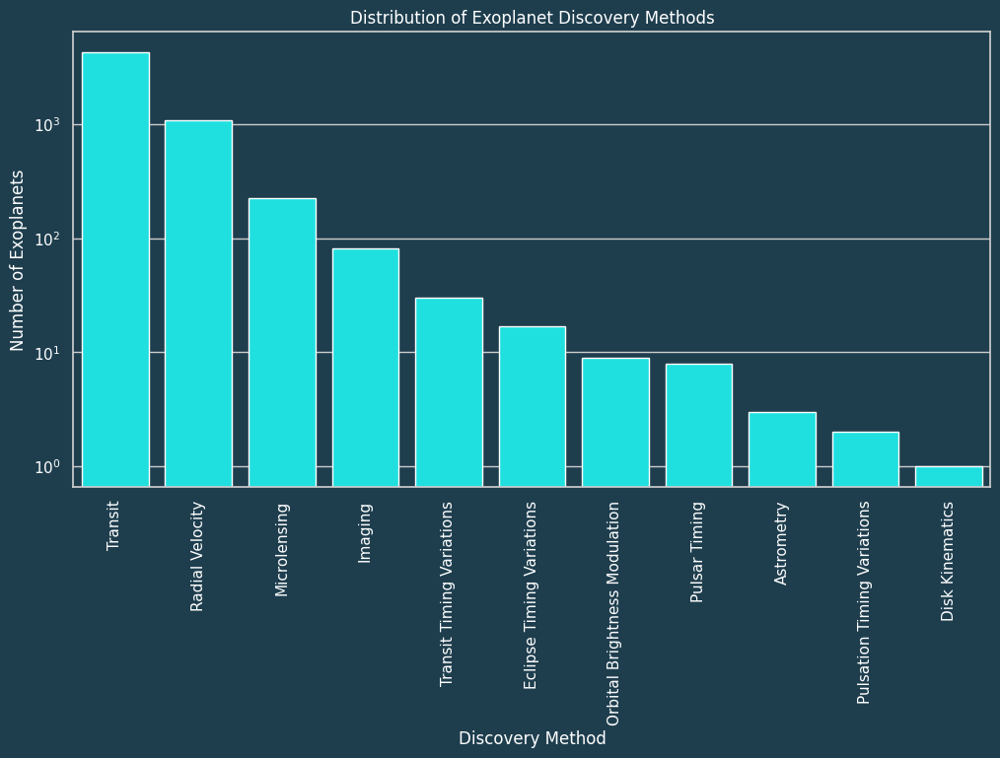

In [435]:
discovery_method_counts = exo['discoverymethod'].value_counts()
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
ax = sns.barplot(x=discovery_method_counts.index, y=discovery_method_counts.values, color='cyan')
plt.gca().set_facecolor('#1e3e4e')
plt.gcf().set_facecolor('#1e3e4e')
ax.set_xlabel('Discovery Method', color='white')
ax.set_ylabel('Number of Exoplanets', color='white')
ax.set_title('Distribution of Exoplanet Discovery Methods', color='white')
ax.tick_params(colors='white')
plt.xticks(rotation=90, color='white')
plt.yticks(color='white')
plt.yscale('log')
plt.show()

**Here  what I get from this part**


1.  In showing the year and the methods used we can say that The transit method stands out as the most frequently employed technique for discovering exoplanets.On the other hand, the radial velocity method, while less commonly used compared to the transit method, has been consistently applied across various years.

2.  The least used method is Disk Kinematics.




In [436]:

count_df = exo.groupby('disc_facility').size().reset_index(name='count')
top_15_df = count_df.sort_values(by='count', ascending=False).head(15)
fig = px.bar(top_15_df, x='disc_facility', y='count', title='Top 15 Facilities by Number of Planets Discovered')
fig.update_traces(marker_color='cyan')
fig.update_layout(
    plot_bgcolor='#1e3e4e',
    paper_bgcolor='#1e3e4e',
    font_color='white',
    title_font=dict(size=20, color='white'),
    xaxis_title_font=dict(size=14, color='white'),
    yaxis_title_font=dict(size=14, color='white'),
    xaxis_tickfont=dict(color='white'),
    yaxis_tickfont=dict(color='white'),
    xaxis_title='Discovery Facility',
    yaxis_title='Number of Planets'
)


fig.show()


In [437]:
facility_counts = exo['disc_facility'].value_counts()
least_discovered_facilities = facility_counts[facility_counts == facility_counts.min()]
print("Facilities with the least number of discoveries:")
print(least_discovered_facilities)

Facilities with the least number of discoveries:
disc_facility
James Webb Space Telescope (JWST)                 1
Teide Observatory                                 1
Kitt Peak National Observatory                    1
Infrared Survey Facility                          1
Leoncito Astronomical Complex                     1
Winer Observatory                                 1
South African Radio Astronomy Observatory (SAR    1
KOINet                                            1
Atacama Large Millimeter Array (ALMA)             1
Apache Point Observatory                          1
Very Long Baseline Array                          1
NASA Infrared Telescope Facility (IRTF)           1
Wide-field Infrared Survey Explorer (WISE) Sat    1
University of Canterbury Mt John Observatory      1
Name: count, dtype: int64


**The top 10 facilities in discovering exoplanets**

1.kelper is the facility that discovered most of the exoplanets it discovered 2773 exoplanet

In [438]:
num_of_facilities_per_year = exo.groupby('disc_year')['disc_facility'].nunique().reset_index(name='num_facilities')
fig = px.line(num_of_facilities_per_year, x='disc_year', y='num_facilities',
              title='Number of Facilities Discovered per Year',
              labels={'disc_year': 'Discovery Year', 'num_facilities': 'Number of Facilities'})
fig.show()

**The facility that discovered the first exoplanet is Arecibo Observatory**

In [439]:
numerical_columns = [x for x in exo.columns if exo.dtypes[x] ==float or exo.dtypes[x] ==int ]


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



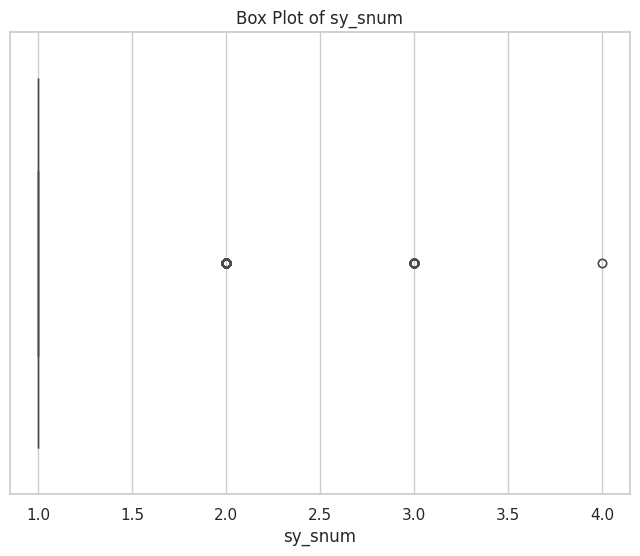

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



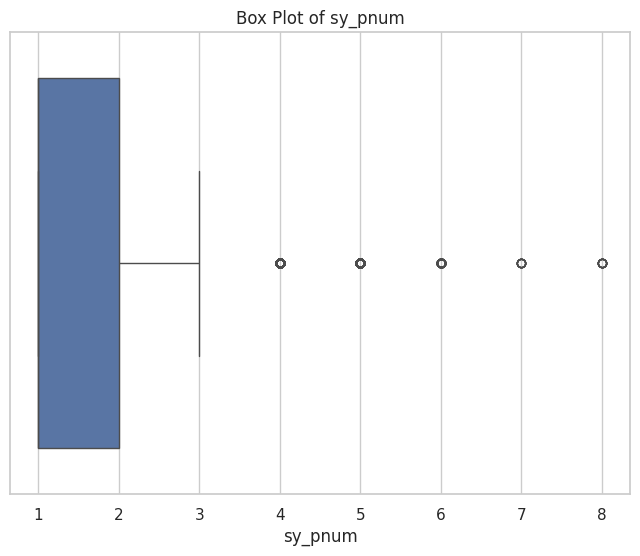

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



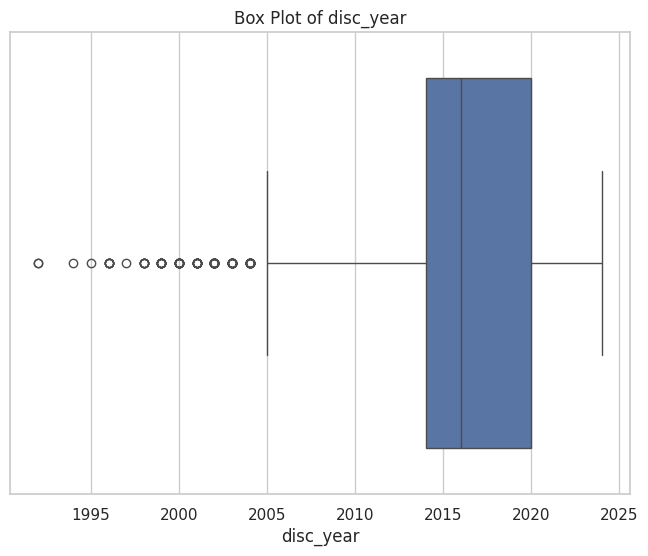

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



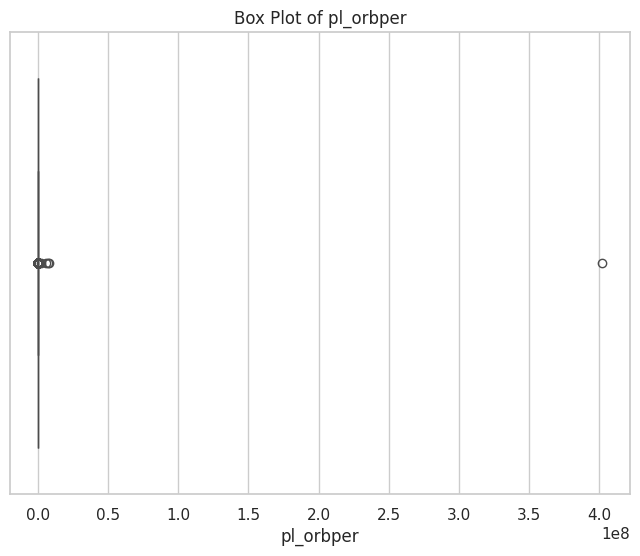

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



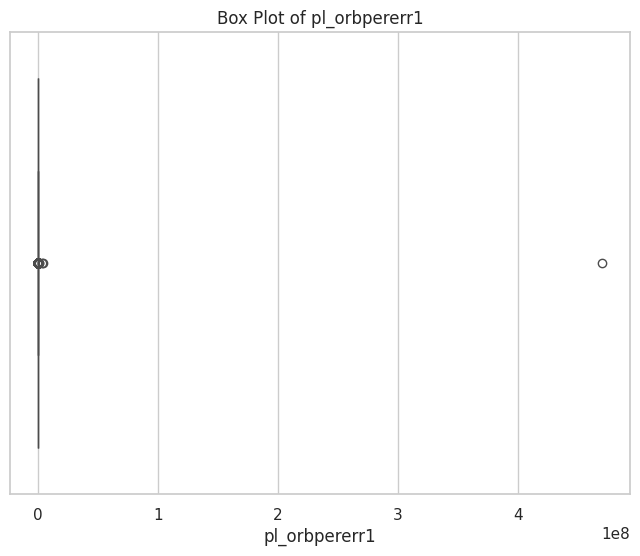

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



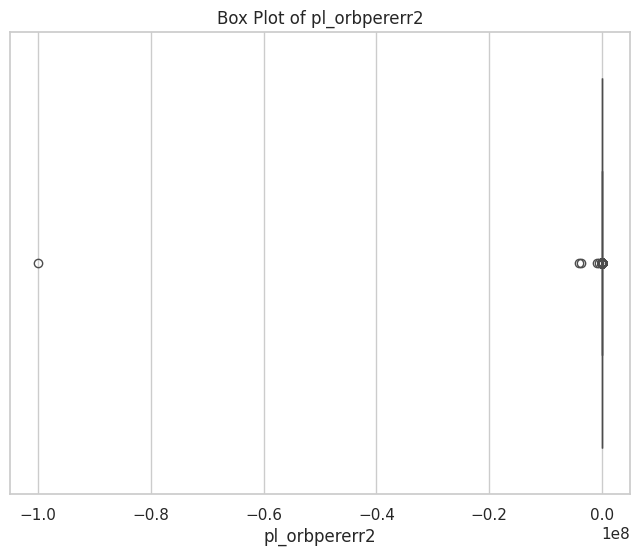

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



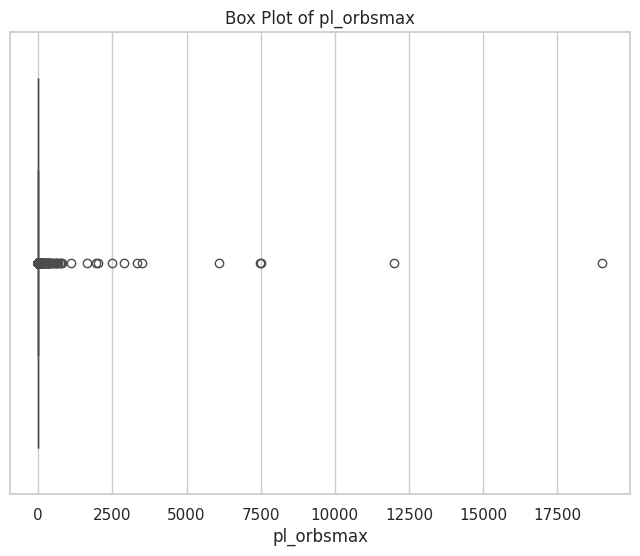

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



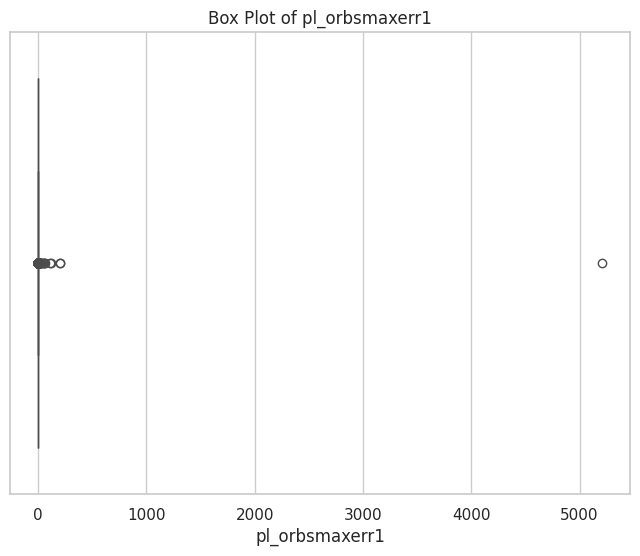

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



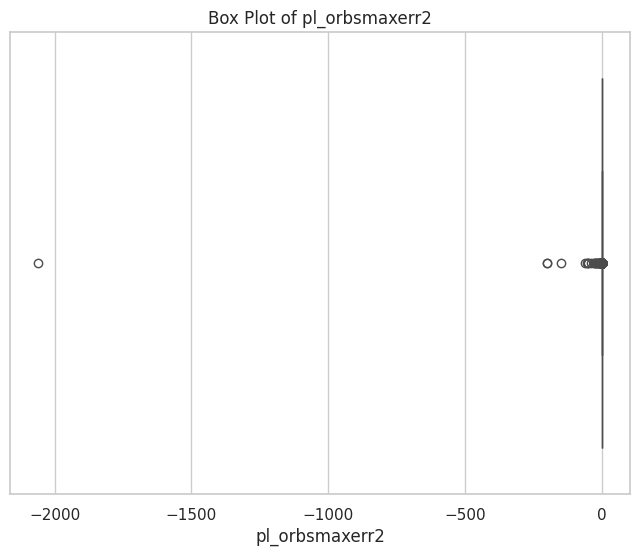

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



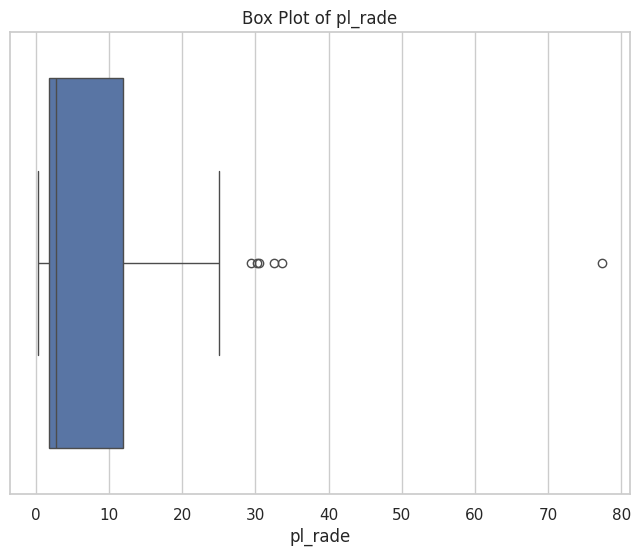

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



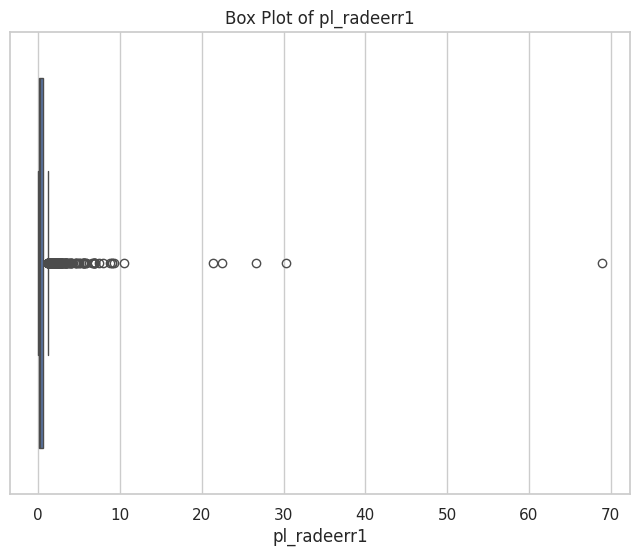

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



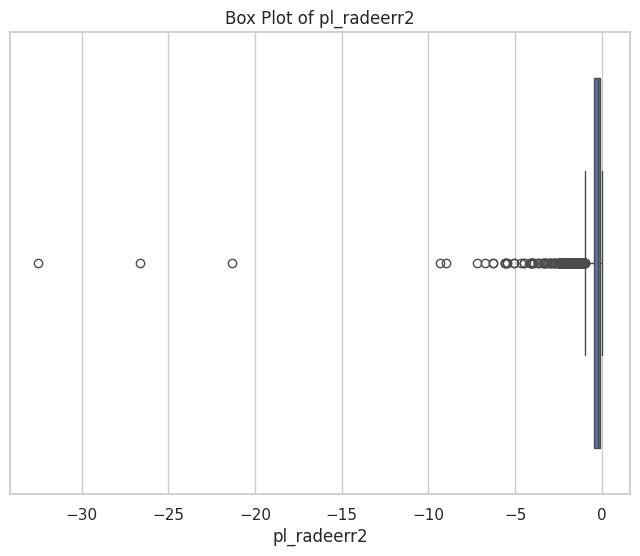

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



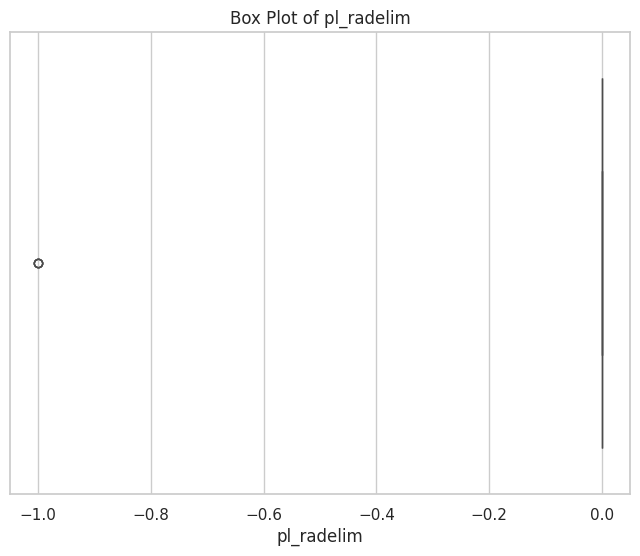

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



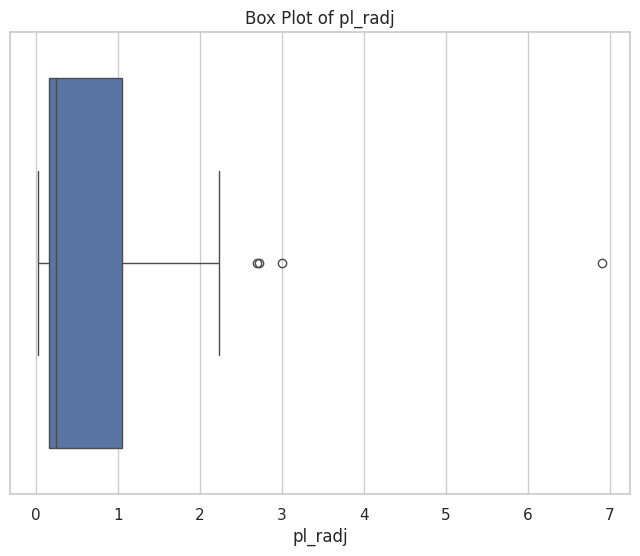

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



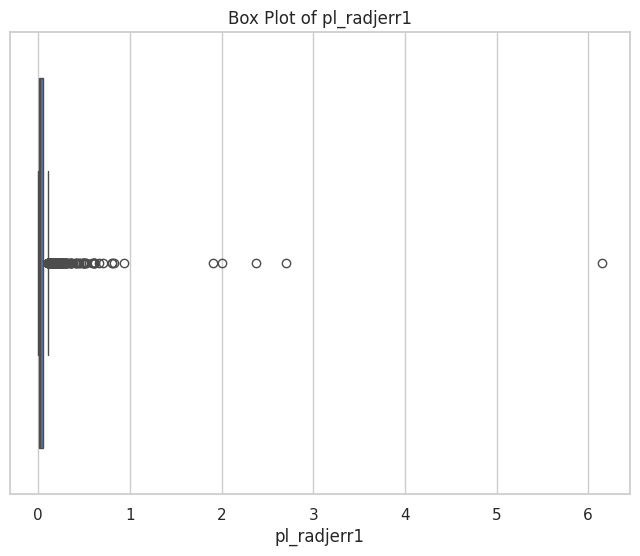

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



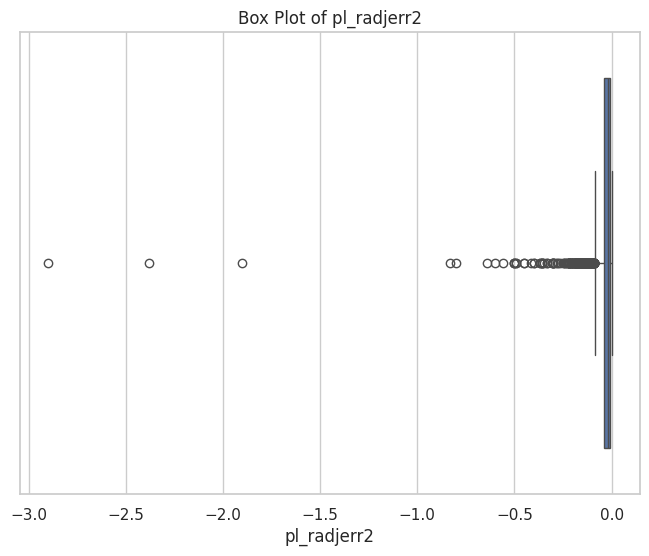

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



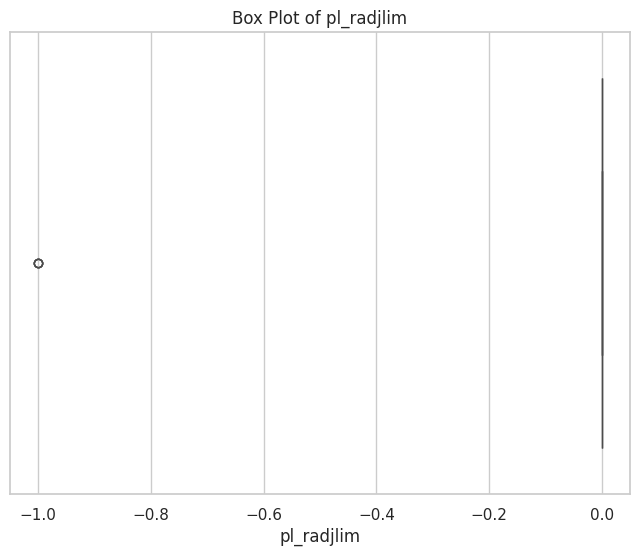

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



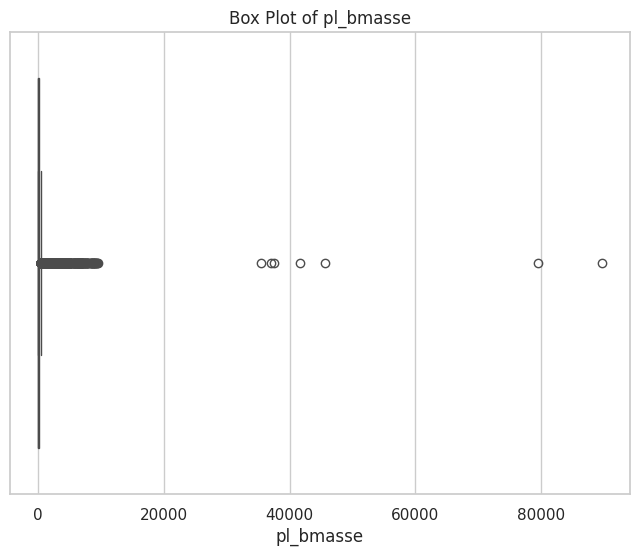

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



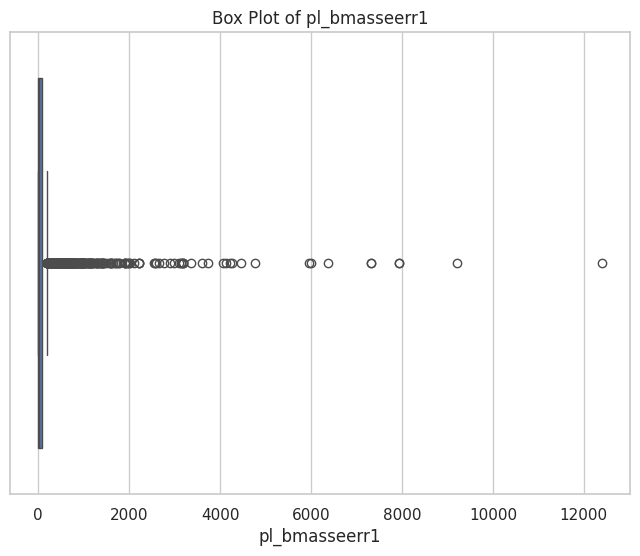

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



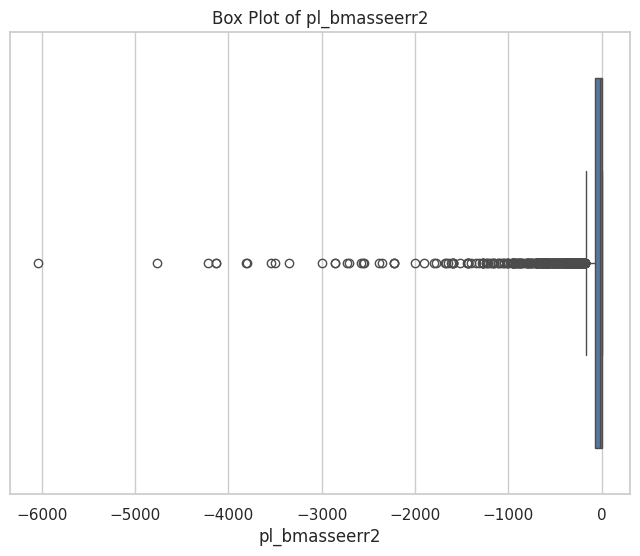

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



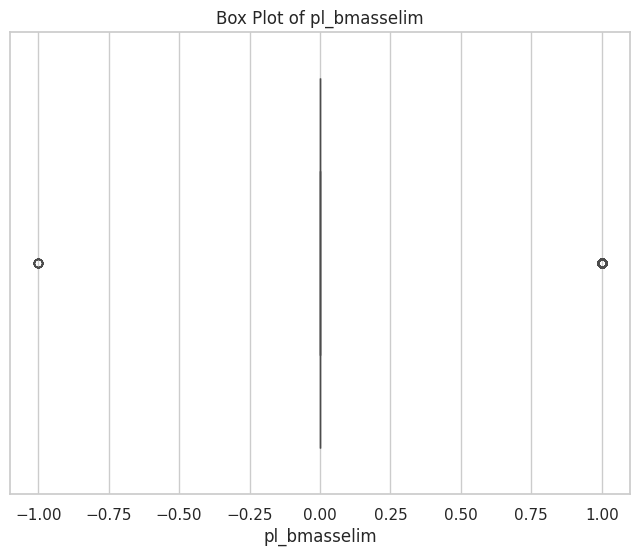

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



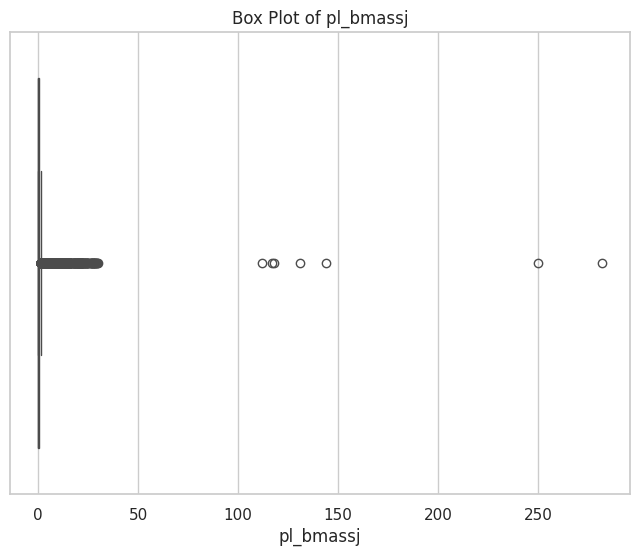

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



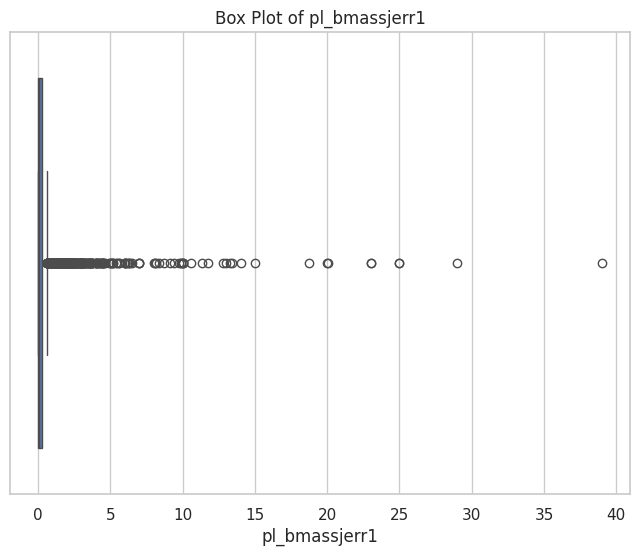

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



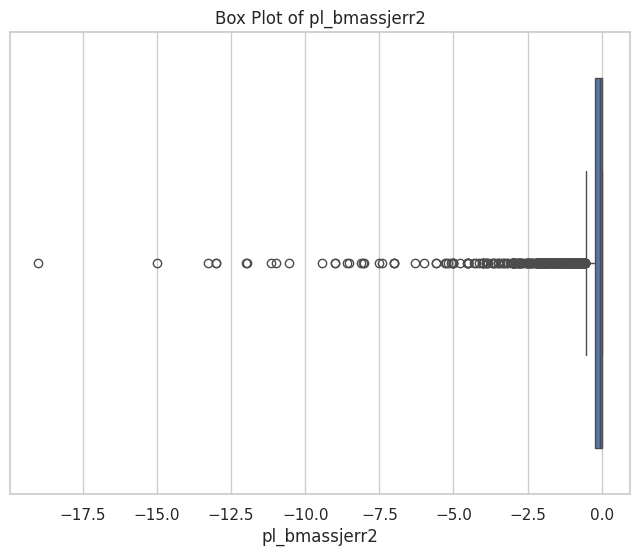

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



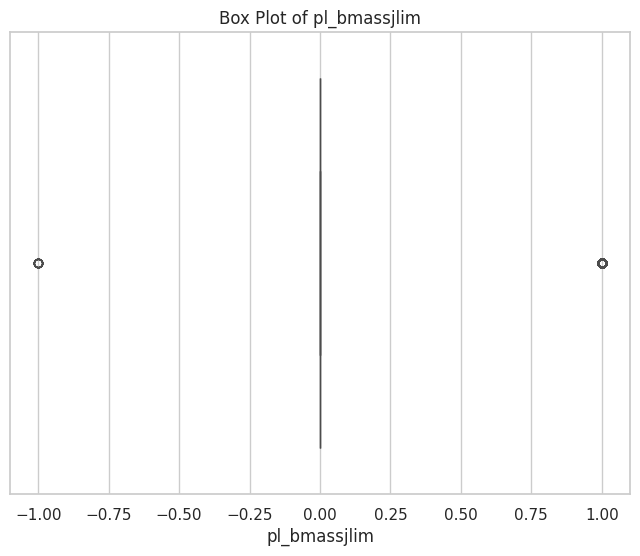

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



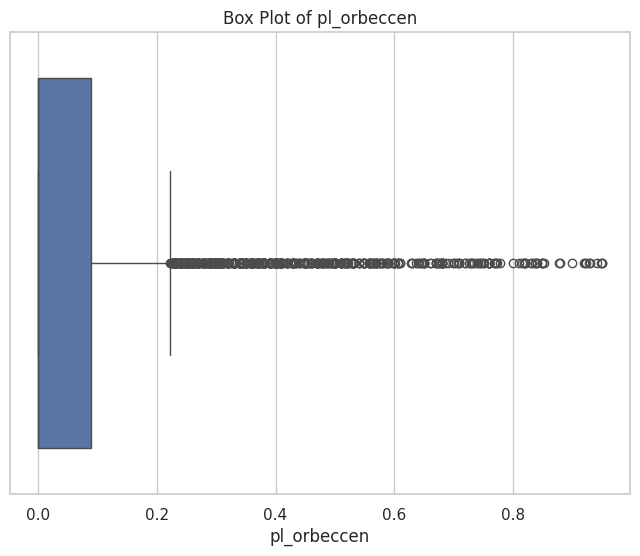

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



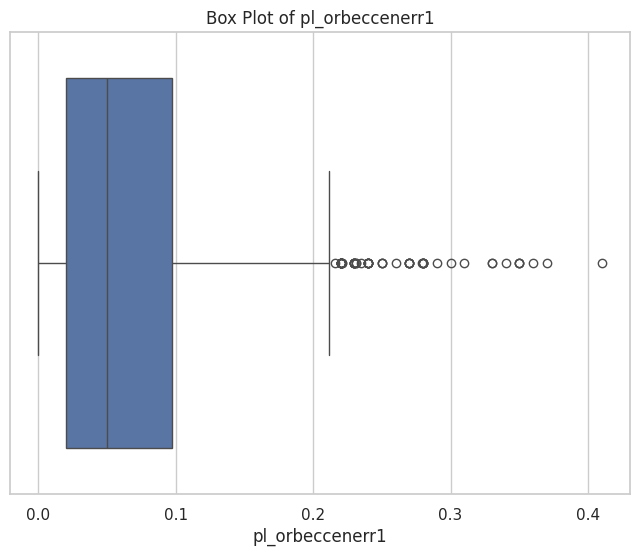

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



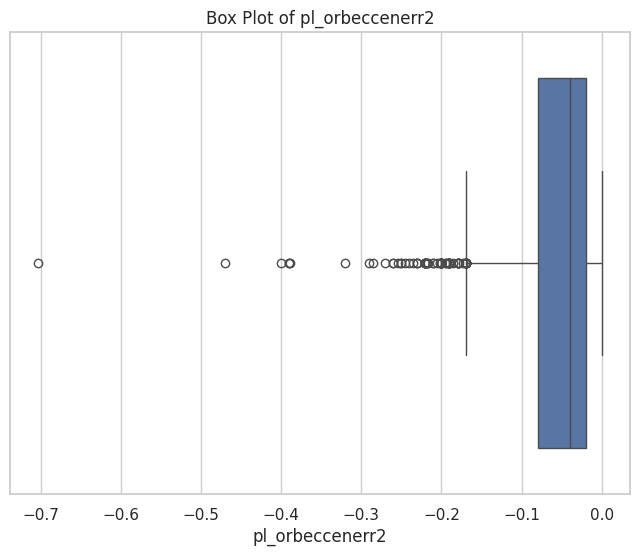

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



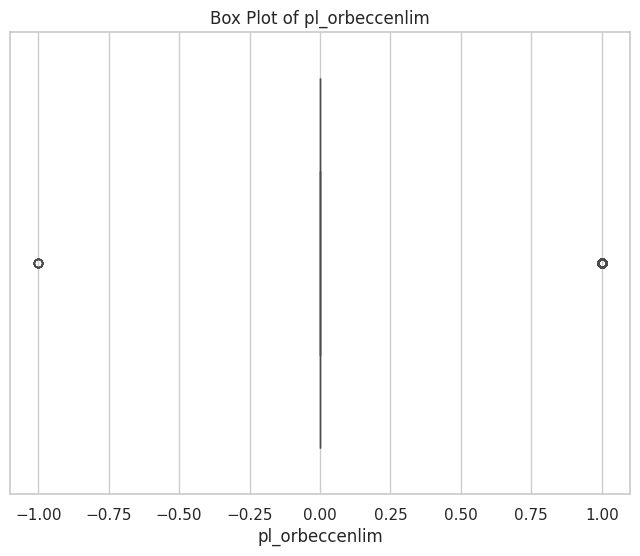

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



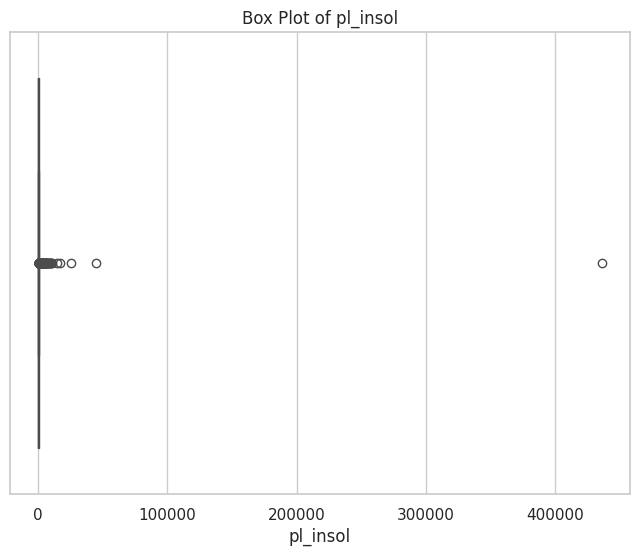

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



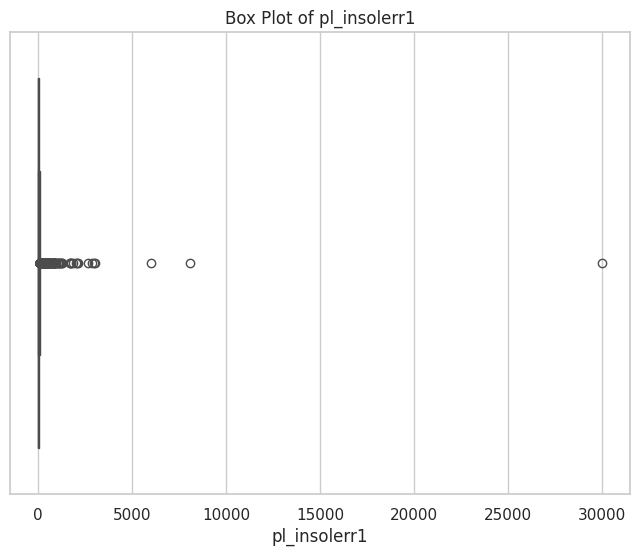

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



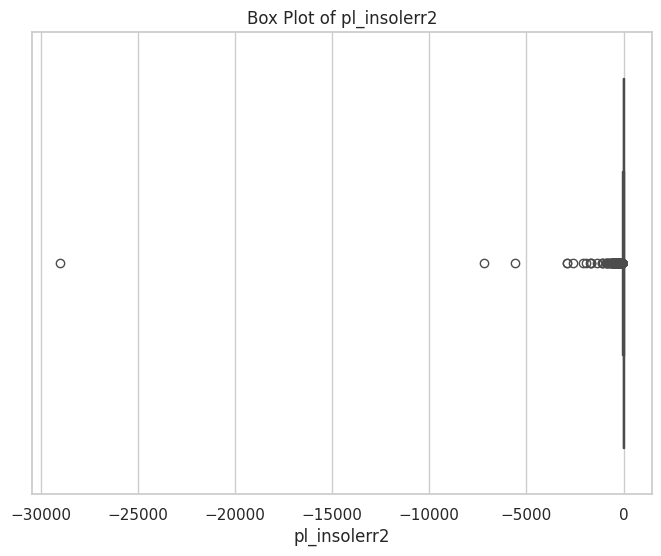

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



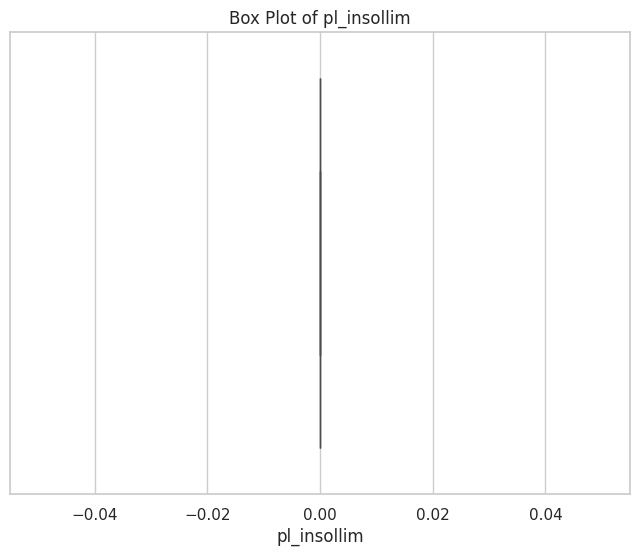

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



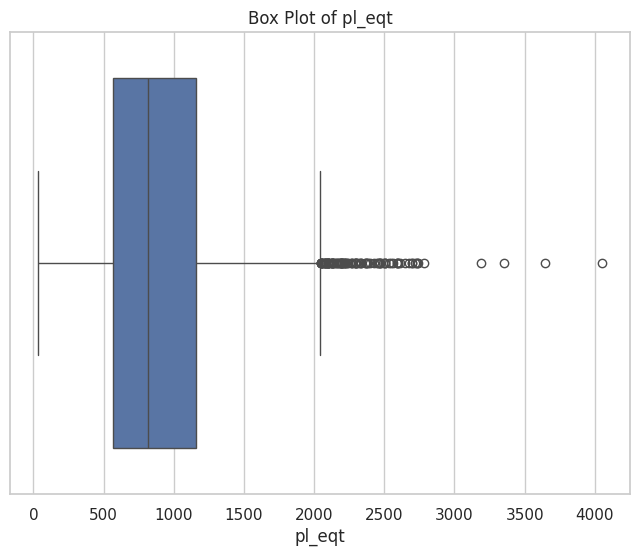

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



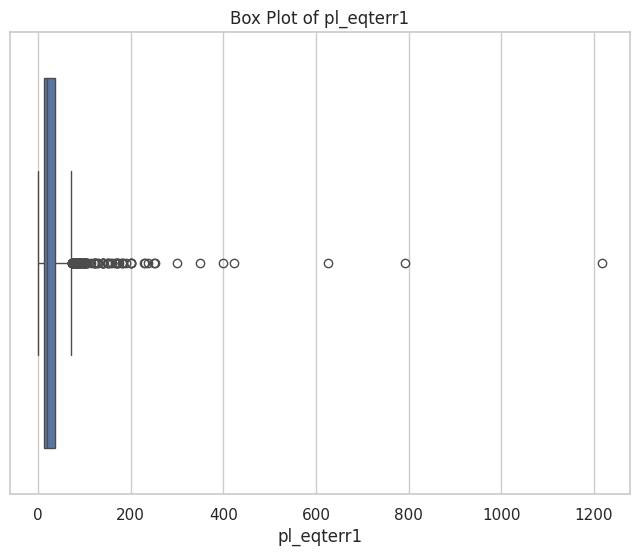

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



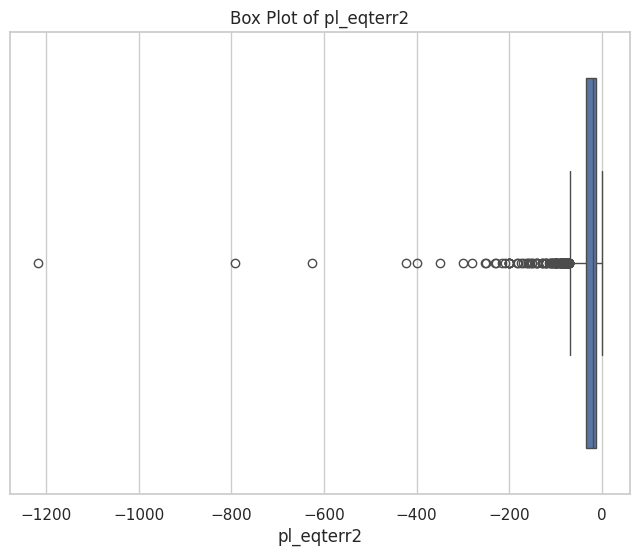

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



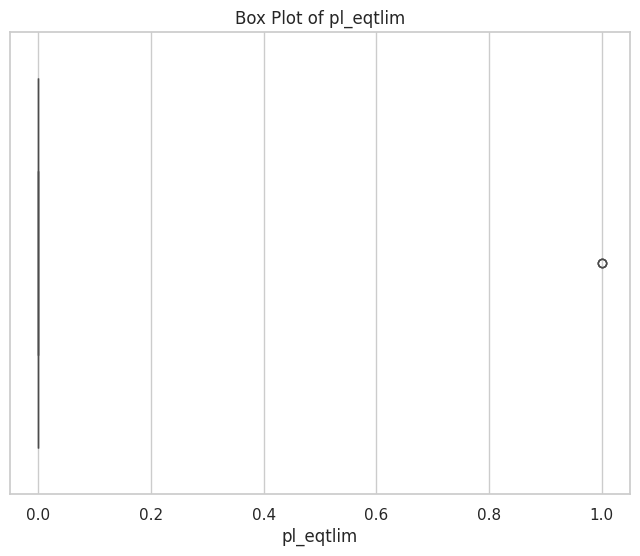

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



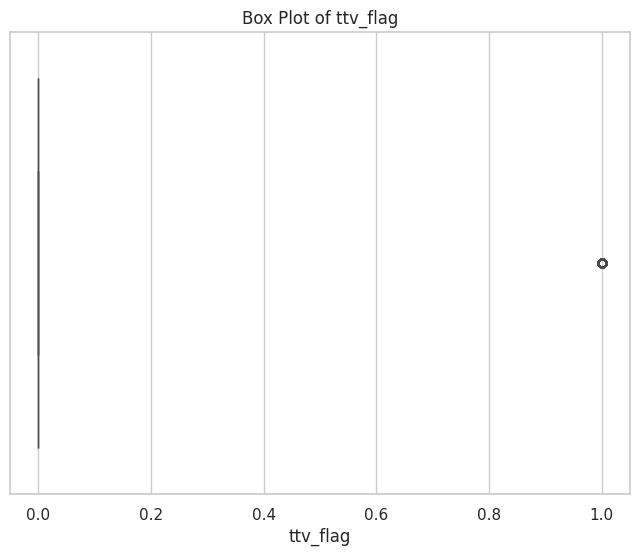

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



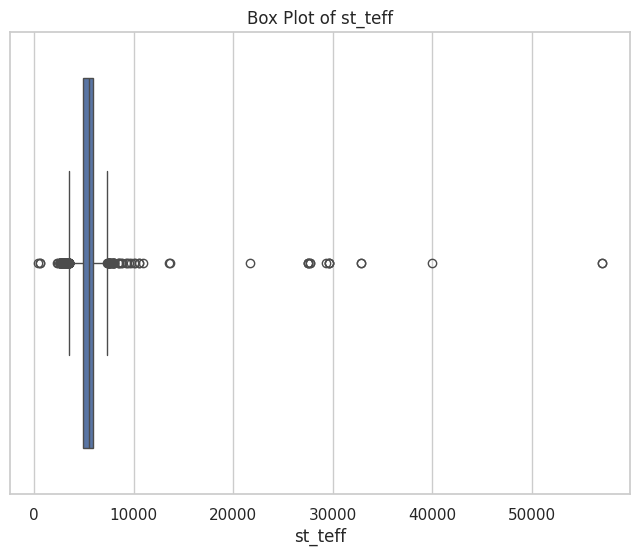

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



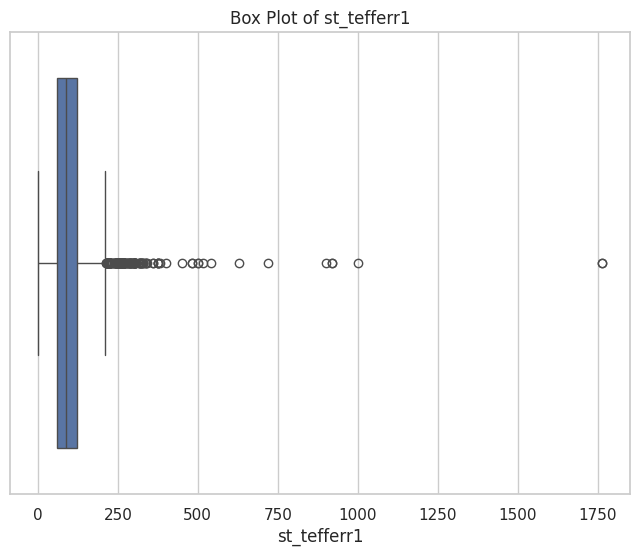

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



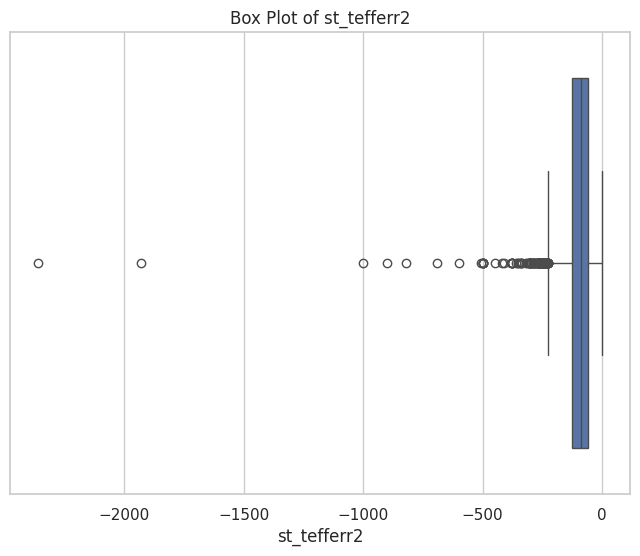

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



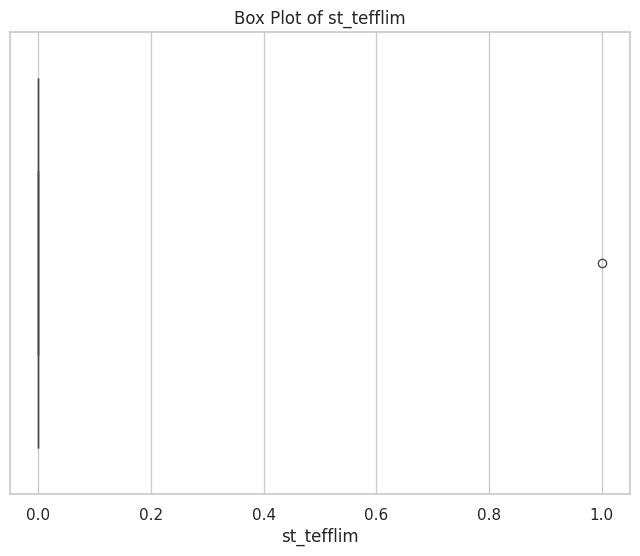

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



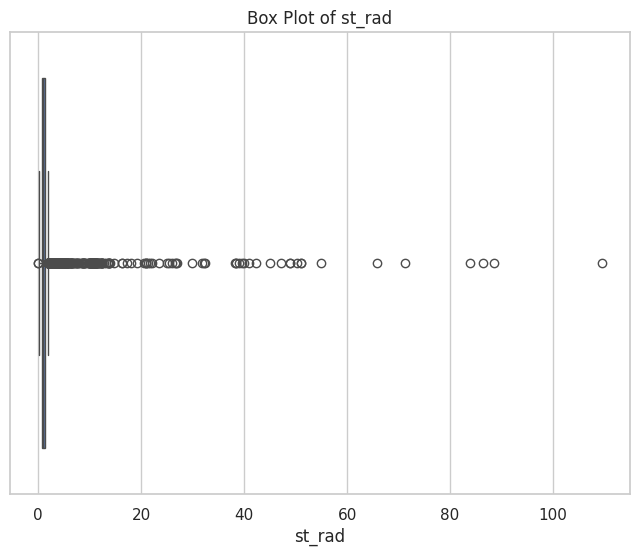

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



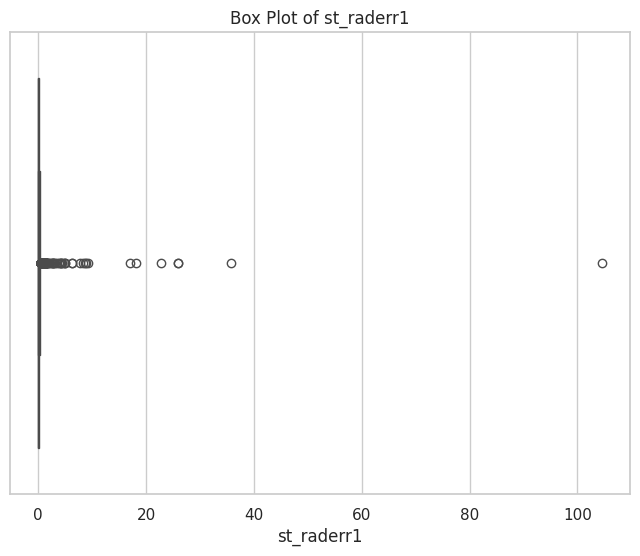

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



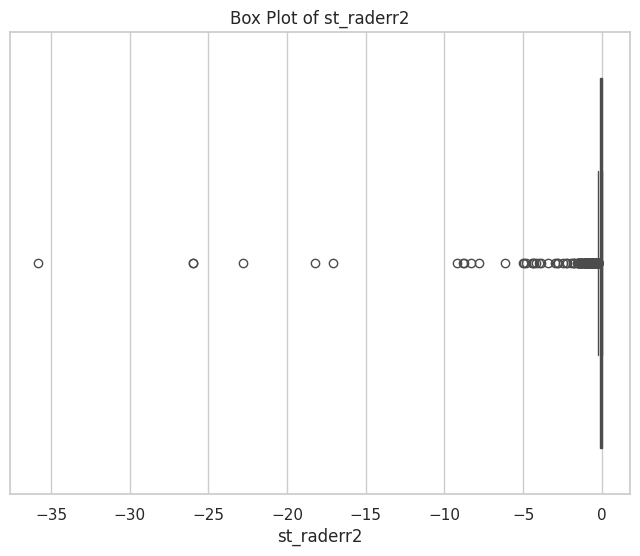

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



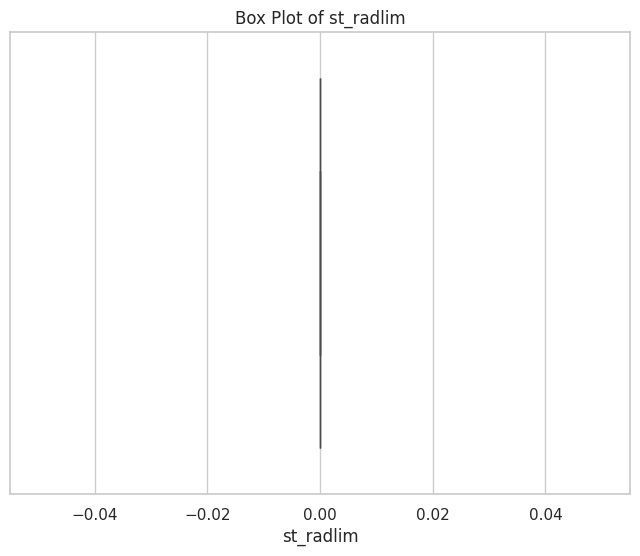

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



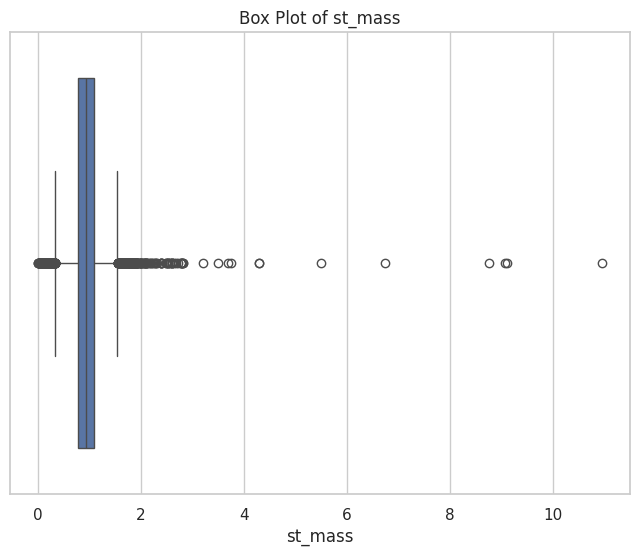

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



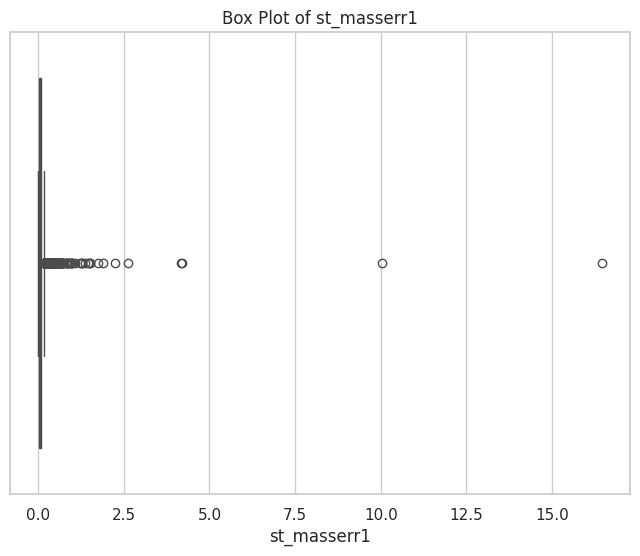

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



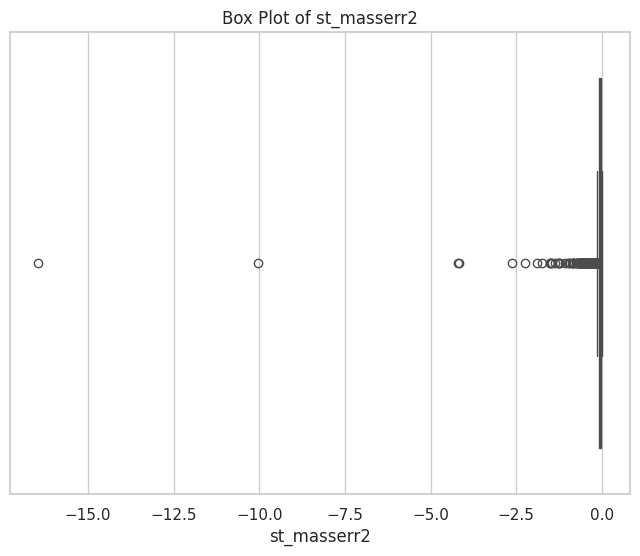

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



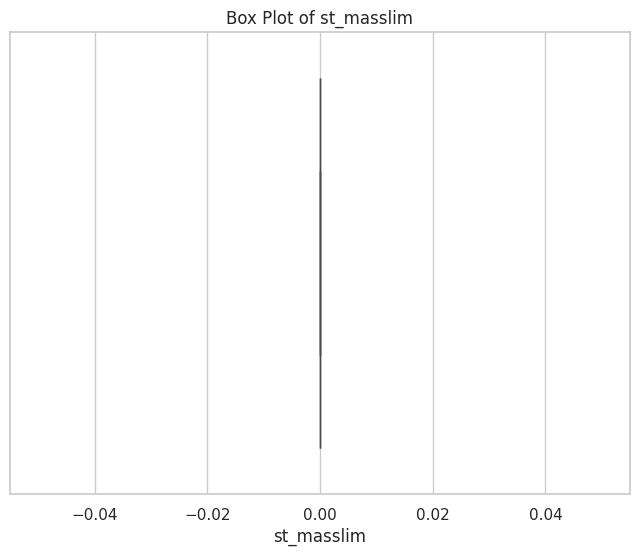

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



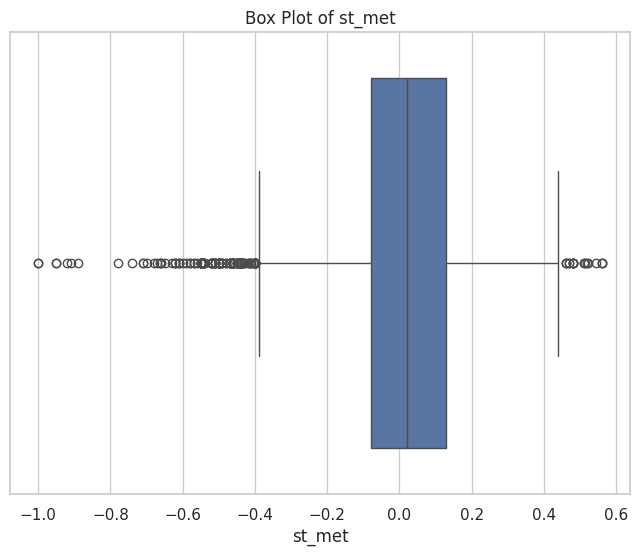

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



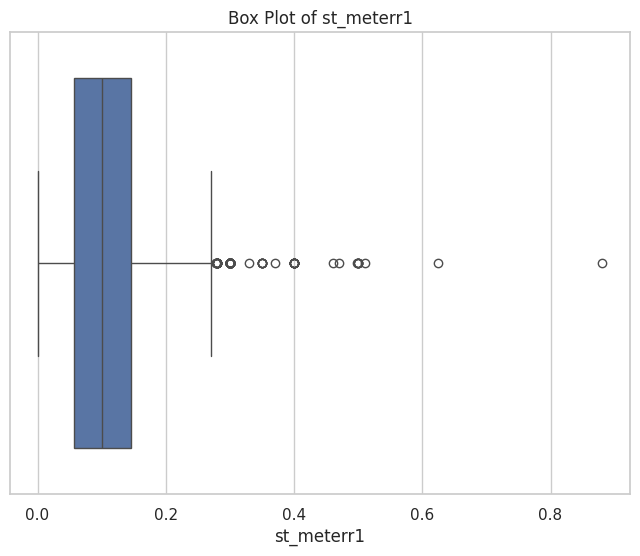

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



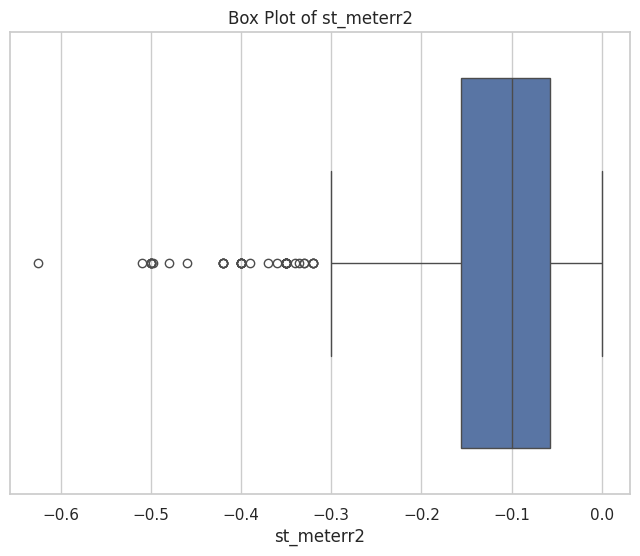

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



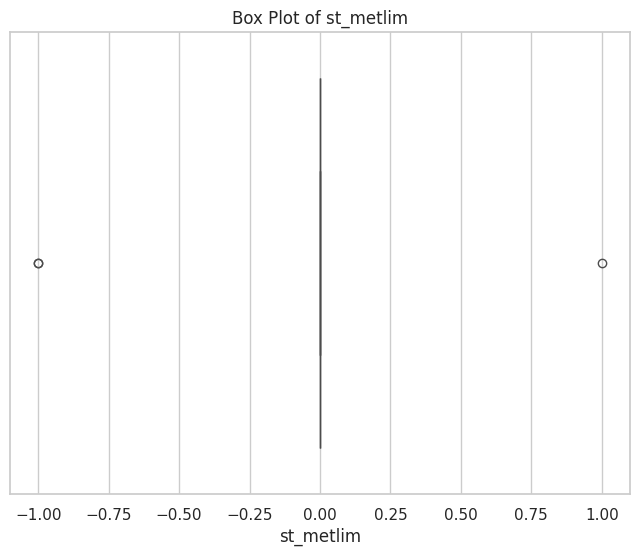

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



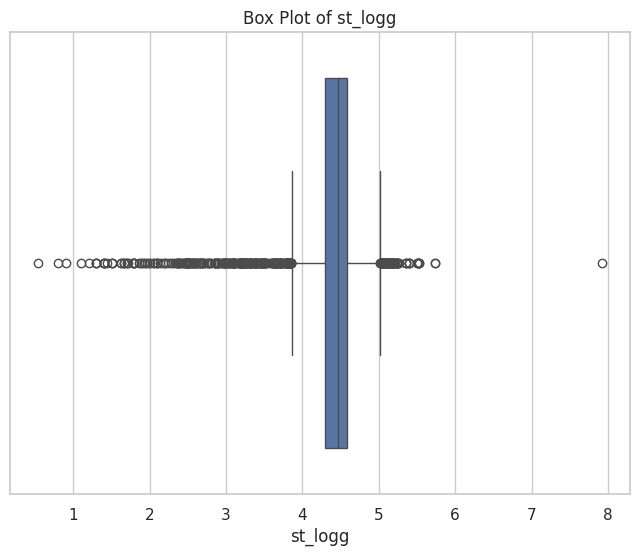

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



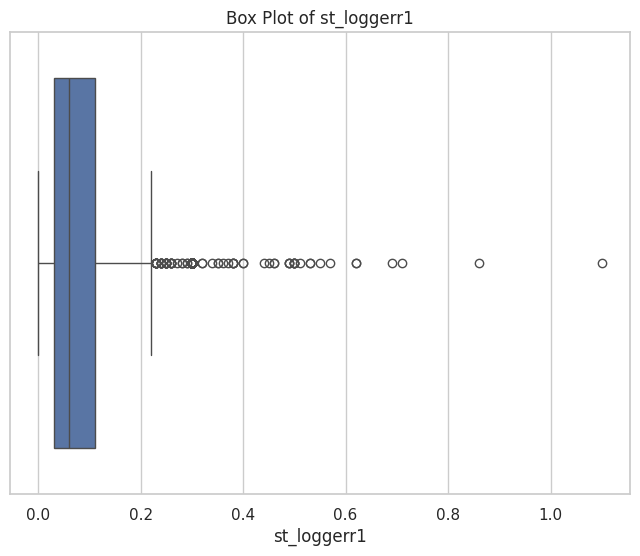

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



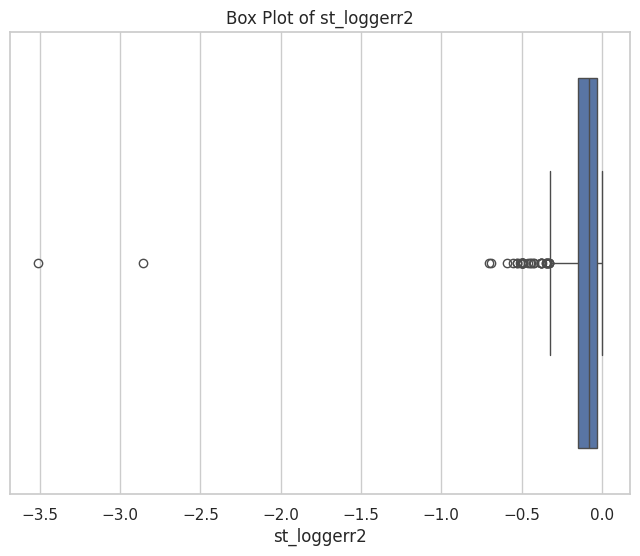

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



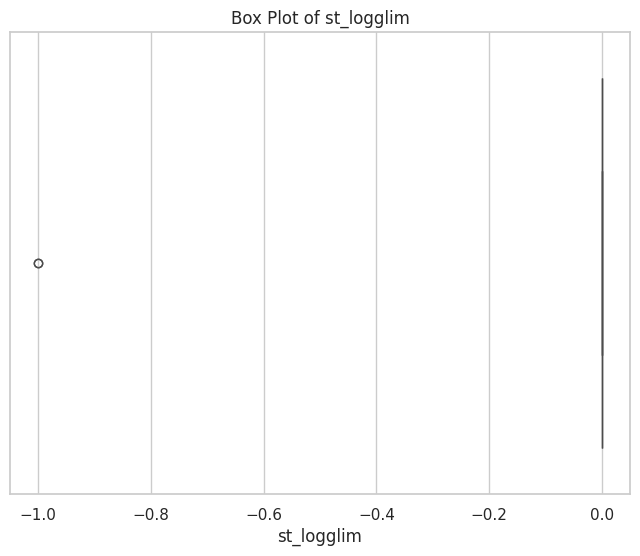

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



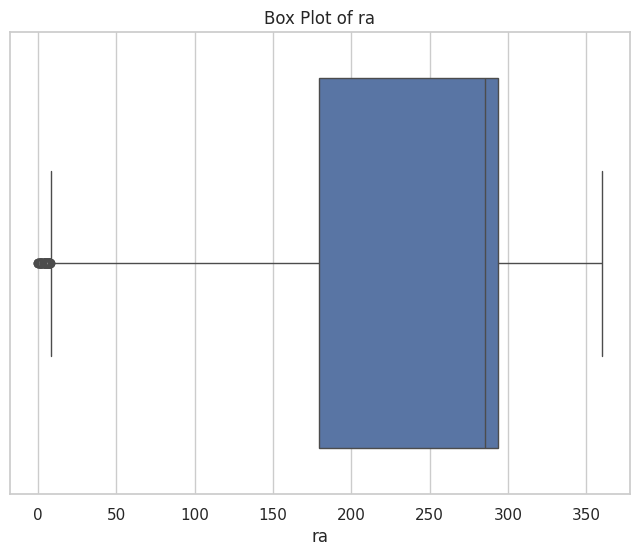

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



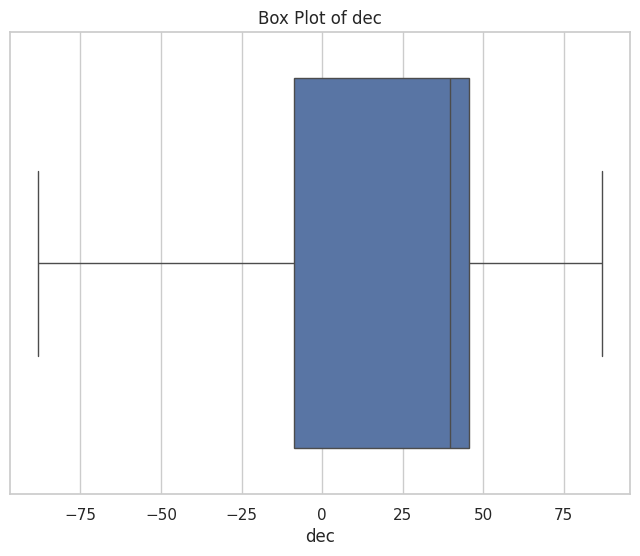

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



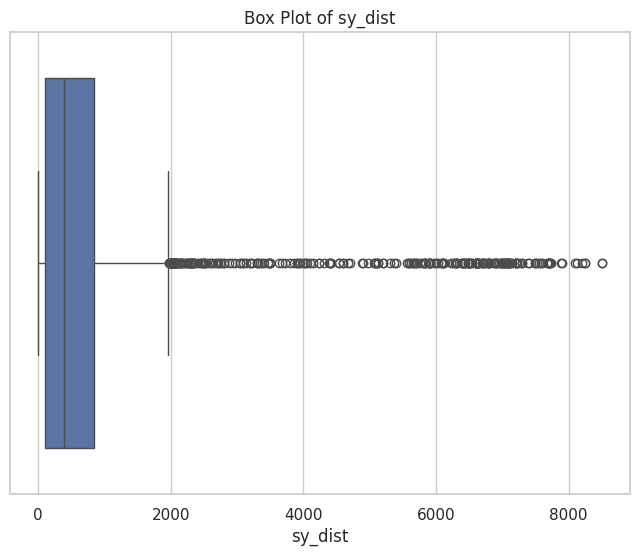

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



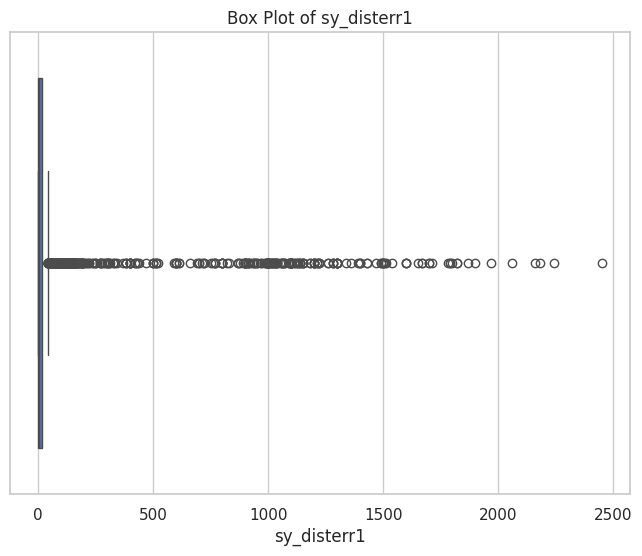

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



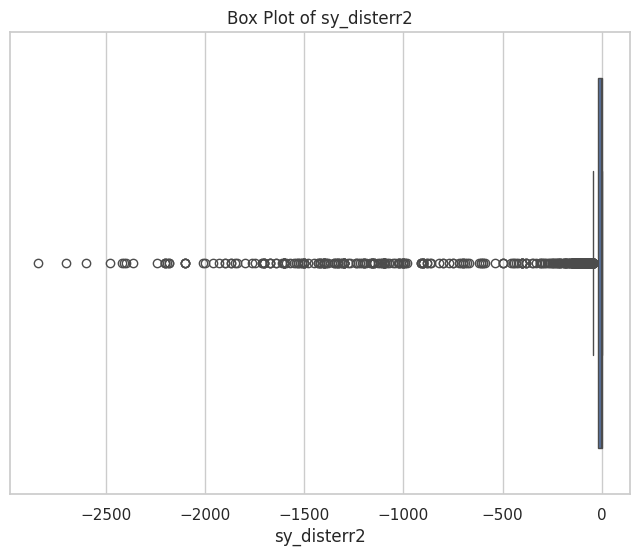

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



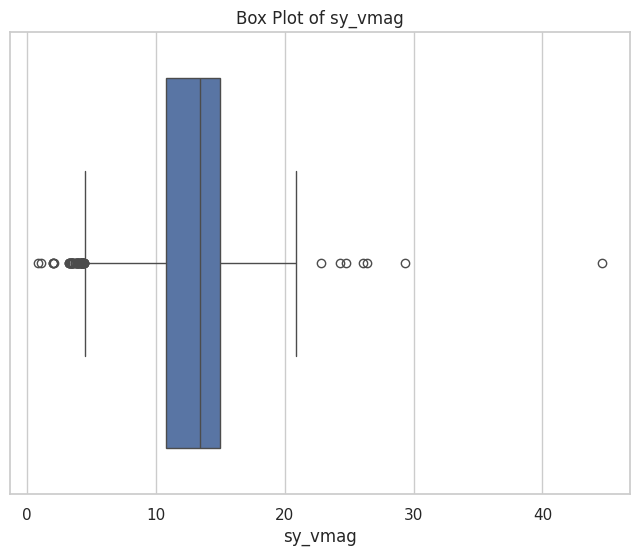

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



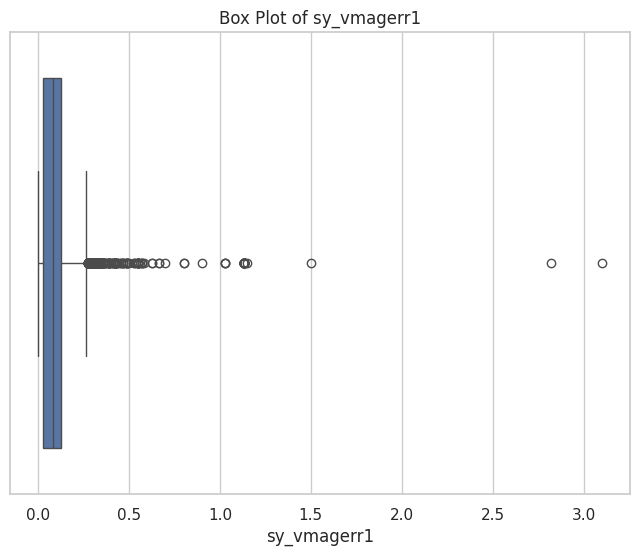

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



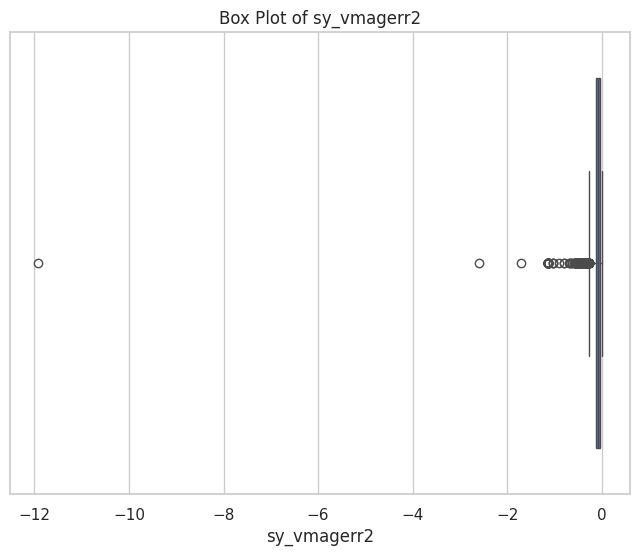

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



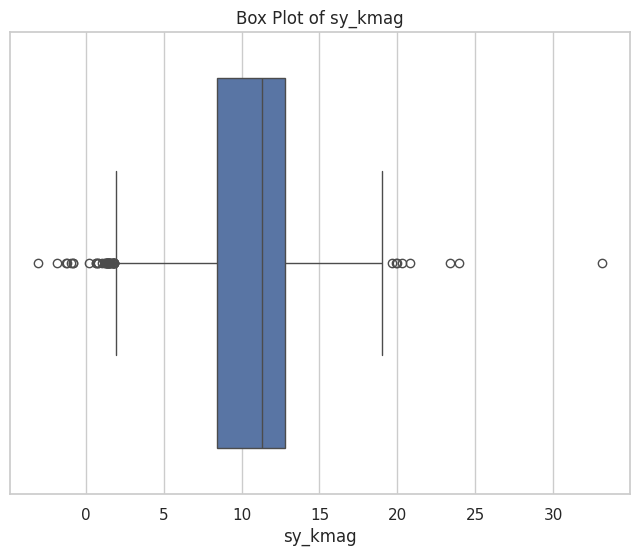

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



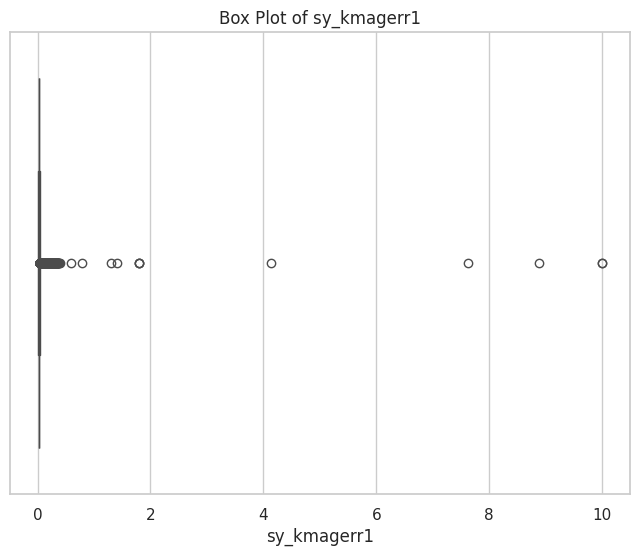

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



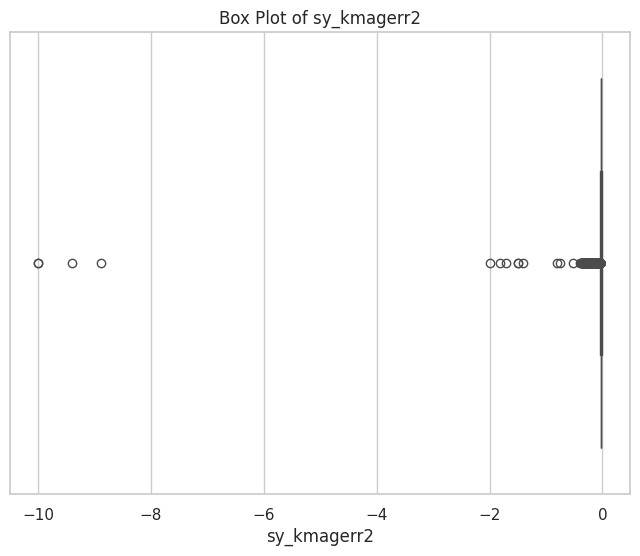

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



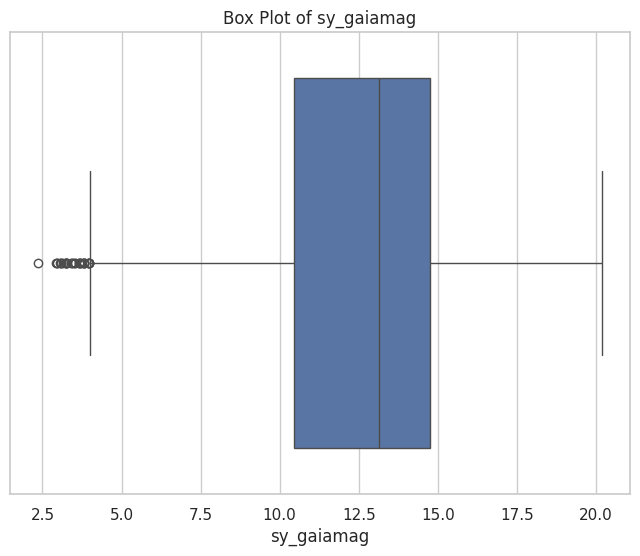

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



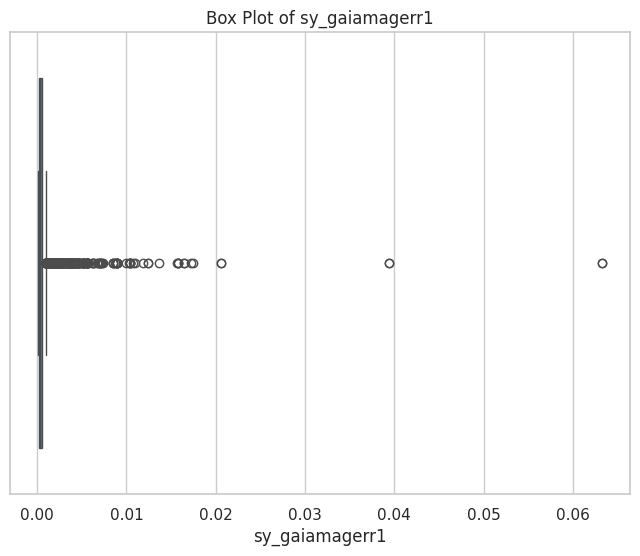

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



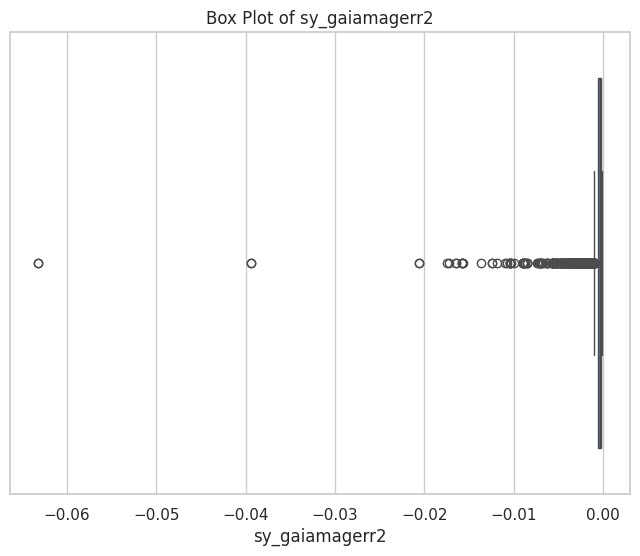

In [440]:
for column in numerical_columns:
  plt.figure(figsize=(8, 6))
  sns.boxplot(x=exo[column])
  plt.title(f'Box Plot of {column}')
  plt.show()


In [441]:
null_counts = exo.isnull().sum()
total_rows = len(exo)
null_percentages = (null_counts / total_rows) * 100
print(null_percentages)

pl_name            0.000000
hostname           0.000000
sy_snum            0.000000
sy_pnum            0.000000
discoverymethod    0.000000
                     ...   
sy_kmagerr1        4.621265
sy_kmagerr2        4.829743
sy_gaiamag         4.986101
sy_gaiamagerr1     5.020848
sy_gaiamagerr2     5.020848
Length: 84, dtype: float64


In [442]:
columns_with_nulls = exo.columns[exo.isnull().any()]
print("Columns with null values:", columns_with_nulls)


Columns with null values: Index(['pl_orbper', 'pl_orbpererr1', 'pl_orbpererr2', 'pl_orbsmax',
       'pl_orbsmaxerr1', 'pl_orbsmaxerr2', 'pl_rade', 'pl_radeerr1',
       'pl_radeerr2', 'pl_radelim', 'pl_radj', 'pl_radjerr1', 'pl_radjerr2',
       'pl_radjlim', 'pl_bmasse', 'pl_bmasseerr1', 'pl_bmasseerr2',
       'pl_bmasselim', 'pl_bmassj', 'pl_bmassjerr1', 'pl_bmassjerr2',
       'pl_bmassjlim', 'pl_orbeccen', 'pl_orbeccenerr1', 'pl_orbeccenerr2',
       'pl_orbeccenlim', 'pl_insol', 'pl_insolerr1', 'pl_insolerr2',
       'pl_insollim', 'pl_eqt', 'pl_eqterr1', 'pl_eqterr2', 'pl_eqtlim',
       'st_spectype', 'st_teff', 'st_tefferr1', 'st_tefferr2', 'st_tefflim',
       'st_rad', 'st_raderr1', 'st_raderr2', 'st_radlim', 'st_mass',
       'st_masserr1', 'st_masserr2', 'st_masslim', 'st_met', 'st_meterr1',
       'st_meterr2', 'st_metlim', 'st_metratio', 'st_logg', 'st_loggerr1',
       'st_loggerr2', 'st_logglim', 'sy_dist', 'sy_disterr1', 'sy_disterr2',
       'sy_vmag', 'sy_vmagerr1'

In [443]:
earth_radius_exoplanets = exo[exo['pl_rade'] == 1]
print(earth_radius_exoplanets['pl_name'])


147     EPIC 201833600 c
156     EPIC 206215704 b
1428            K2-157 b
1535            K2-229 b
1546            K2-239 c
2576       Kepler-1417 b
2635       Kepler-1464 c
3897        Kepler-392 b
Name: pl_name, dtype: object


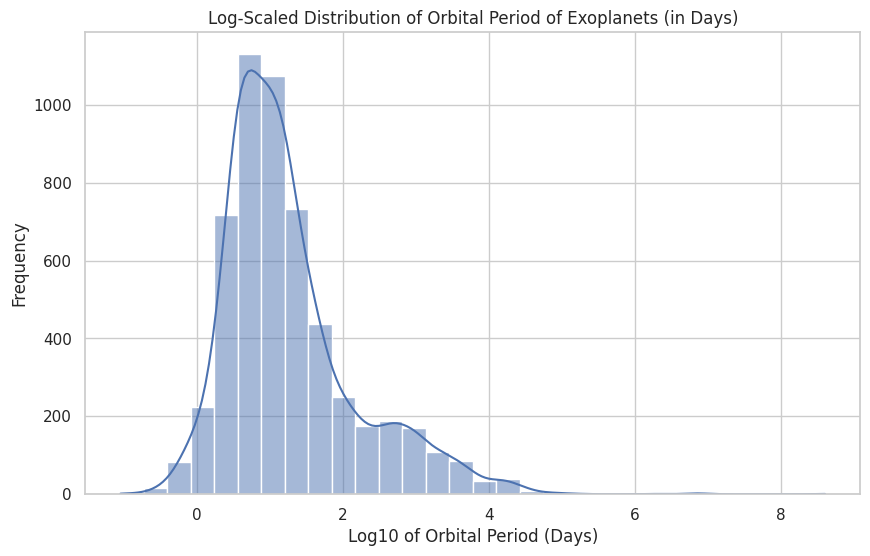

In [444]:

plt.figure(figsize=(10,6))
sns.histplot(np.log10(exo['pl_orbper'].dropna()), bins=30, kde=True)
plt.title('Log-Scaled Distribution of Orbital Period of Exoplanets (in Days)')
plt.xlabel('Log10 of Orbital Period (Days)')
plt.ylabel('Frequency')
plt.show()


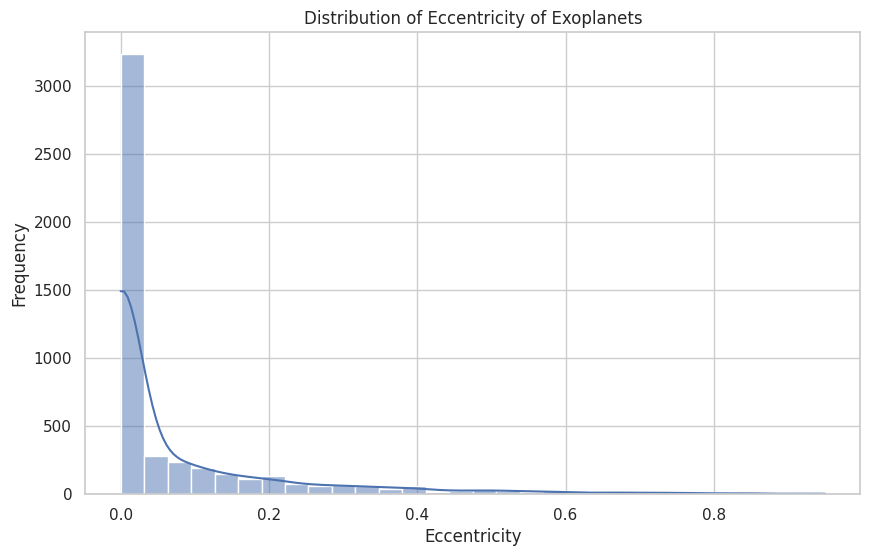

count    4934.000000
mean        0.076563
std         0.151042
min         0.000000
25%         0.000000
50%         0.000000
75%         0.089000
max         0.950000
Name: pl_orbeccen, dtype: float64


In [445]:
eccentricity_data = exo['pl_orbeccen'].dropna()
plt.figure(figsize=(10, 6))
sns.histplot(eccentricity_data, bins=30, kde=True)
plt.title('Distribution of Eccentricity of Exoplanets')
plt.xlabel('Eccentricity')
plt.ylabel('Frequency')
plt.show()
eccentricity_summary = eccentricity_data.describe()
print(eccentricity_summary)

right skewed (means the values may be large )

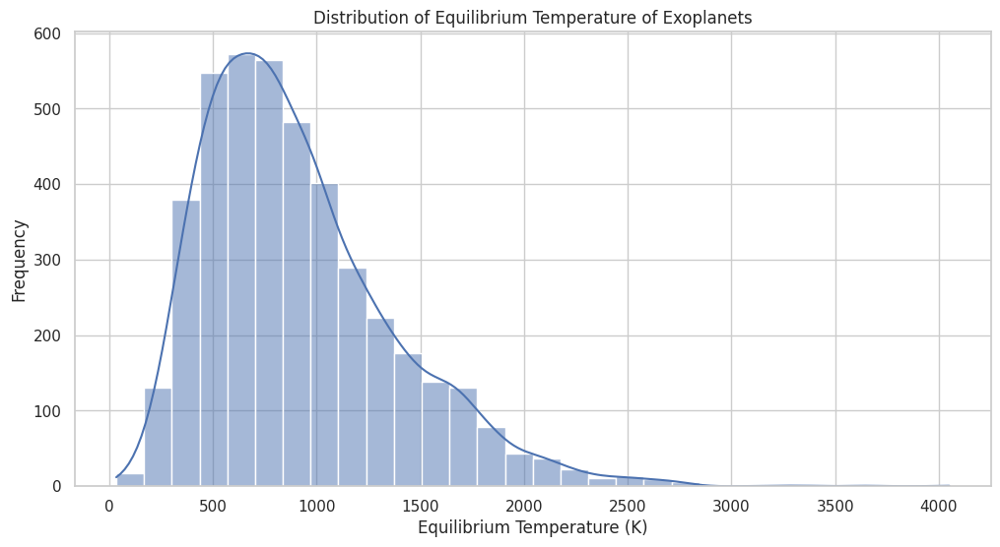

In [446]:
plt.figure(figsize=(12, 6))
sns.histplot(exo['pl_eqt'], bins=30, kde=True)
plt.title('Distribution of Equilibrium Temperature of Exoplanets')
plt.xlabel('Equilibrium Temperature (K)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

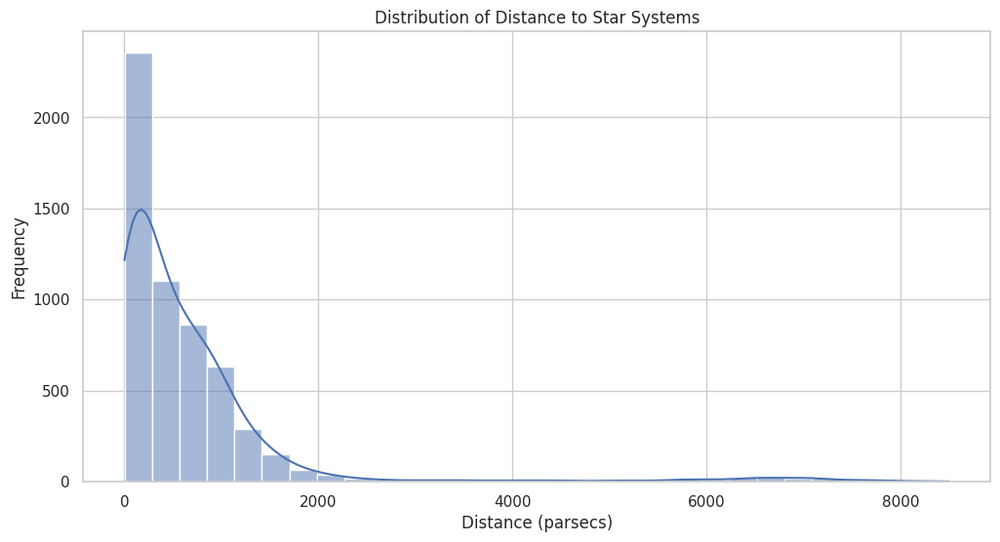

In [447]:
plt.figure(figsize=(12, 6))
sns.histplot(exo['sy_dist'], bins=30, kde=True)
plt.title('Distribution of Distance to Star Systems')
plt.xlabel('Distance (parsecs)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [448]:
highest_eccentricity_planet = exo.loc[exo['pl_orbeccen'].idxmax()]
print(f"The planet with the highest eccentricity is {highest_eccentricity_planet['pl_name']} with an eccentricity of {highest_eccentricity_planet['pl_orbeccen']}.")


The planet with the highest eccentricity is HD 20782 b with an eccentricity of 0.95.


#  One of the First Discovery in 1992


In [449]:
specific_exoplanet_name = 'PSR B1257+12 c'
specific_exoplanet = exo[exo['pl_name'] == specific_exoplanet_name]
if not specific_exoplanet.empty:
    gaia_magnitude = specific_exoplanet['sy_gaiamag'].values[0] if not pd.isnull(specific_exoplanet['sy_gaiamag'].values[0]) else 'Not available'
    planet_mass_earth = specific_exoplanet['pl_bmasse'].values[0] if not pd.isnull(specific_exoplanet['pl_bmasse'].values[0]) else 'Not available'
    planet_mass_jupiter = specific_exoplanet['pl_bmassj'].values[0] if not pd.isnull(specific_exoplanet['pl_bmassj'].values[0]) else 'Not available'
    planet_radius_earth = specific_exoplanet['pl_rade'].values[0] if not pd.isnull(specific_exoplanet['pl_rade'].values[0]) else 'Not available'
    planet_radius_jupiter = specific_exoplanet['pl_radj'].values[0] if not pd.isnull(specific_exoplanet['pl_radj'].values[0]) else 'Not available'
    distance = specific_exoplanet['sy_dist'].values[0] if not pd.isnull(specific_exoplanet['sy_dist'].values[0]) else 'Not available'
    spectral_type = specific_exoplanet['st_spectype'].values[0] if not pd.isnull(specific_exoplanet['st_spectype'].values[0]) else 'Not available'
    orbital_period = specific_exoplanet['pl_orbper'].values[0] if not pd.isnull(specific_exoplanet['pl_orbper'].values[0]) else 'Not available'
    orbital_radius = specific_exoplanet['pl_orbsmax'].values[0] if not pd.isnull(specific_exoplanet['pl_orbsmax'].values[0]) else 'Not available'
    dec_sexagesimal = specific_exoplanet['dec'].values[0] if not pd.isnull(specific_exoplanet['dec'].values[0]) else 'Not available'
    equilibrium_temperature = specific_exoplanet['pl_eqt'].values[0] if not pd.isnull(specific_exoplanet['pl_eqt'].values[0]) else 'Not available'
    metallicity_ratio = specific_exoplanet['st_met'].values[0] if not pd.isnull(specific_exoplanet['st_met'].values[0]) else 'Not available'
    discovery_year = specific_exoplanet['disc_year'].values[0] if not pd.isnull(specific_exoplanet['disc_year'].values[0]) else 'Not available'
    discovery_facility = specific_exoplanet['disc_facility'].values[0] if not pd.isnull(specific_exoplanet['disc_facility'].values[0]) else 'Not available'
    discovery_method = specific_exoplanet['discoverymethod'].values[0] if not pd.isnull(specific_exoplanet['discoverymethod'].values[0]) else 'Not available'
    print(f"Details of {specific_exoplanet_name}:")
    print(f"  Gaia Magnitude: {gaia_magnitude}")
    print(f"  Mass (Earth Masses): {planet_mass_earth}")
    print(f"  Mass (Jupiter Masses): {planet_mass_jupiter}")
    print(f"  Radius (Earth Radii): {planet_radius_earth}")
    print(f"  Radius (Jupiter Radii): {planet_radius_jupiter}")
    print(f"  Distance to Earth (parsecs): {distance}")
    print(f"  Spectral Type: {spectral_type}")
    print(f"  Orbital Period (days): {orbital_period}")
    print(f"  Orbital Radius (AU): {orbital_radius}")
    print(f"  Declination (Dec Sexagesimal): {dec_sexagesimal}")
    print(f"  Equilibrium Temperature (K): {equilibrium_temperature}")
    print(f"  Stellar Metallicity Ratio [Fe/H]: {metallicity_ratio}")
    print(f"  Discovery Year: {discovery_year}")
    print(f"  Discovery Facility: {discovery_facility}")
    print(f"  Discovery Method: {discovery_method}")

else:
    print(f"Exoplanet {specific_exoplanet_name} not found in the dataset.")

Details of PSR B1257+12 c:
  Gaia Magnitude: Not available
  Mass (Earth Masses): 4.3
  Mass (Jupiter Masses): 0.01353
  Radius (Earth Radii): 1.91
  Radius (Jupiter Radii): 0.17
  Distance to Earth (parsecs): 600.0
  Spectral Type: Not available
  Orbital Period (days): 66.5419
  Orbital Radius (AU): 0.36
  Declination (Dec Sexagesimal): 12.6823534
  Equilibrium Temperature (K): Not available
  Stellar Metallicity Ratio [Fe/H]: Not available
  Discovery Year: 1992
  Discovery Facility: Arecibo Observatory
  Discovery Method: Pulsar Timing


# One of the Largest exoplanets and the highest in radius

In [450]:
largest_planet = exo.loc[exo['pl_rade'].idxmax()]
print(f"The largest planet by radius is {largest_planet['pl_name']} with a radius of {largest_planet['pl_rade']}.")


The largest planet by radius is HD 100546 b with a radius of 77.342.


In [451]:
specific_exoplanet_name = 'HD 100546 b'
specific_exoplanet = exo[exo['pl_name'] == specific_exoplanet_name]
if not specific_exoplanet.empty:
    gaia_magnitude = specific_exoplanet['sy_gaiamag'].values[0] if not pd.isnull(specific_exoplanet['sy_gaiamag'].values[0]) else 'Not available'
    planet_mass_earth = specific_exoplanet['pl_bmasse'].values[0] if not pd.isnull(specific_exoplanet['pl_bmasse'].values[0]) else 'Not available'
    planet_mass_jupiter = specific_exoplanet['pl_bmassj'].values[0] if not pd.isnull(specific_exoplanet['pl_bmassj'].values[0]) else 'Not available'
    planet_radius_earth = specific_exoplanet['pl_rade'].values[0] if not pd.isnull(specific_exoplanet['pl_rade'].values[0]) else 'Not available'
    planet_radius_jupiter = specific_exoplanet['pl_radj'].values[0] if not pd.isnull(specific_exoplanet['pl_radj'].values[0]) else 'Not available'
    distance = specific_exoplanet['sy_dist'].values[0] if not pd.isnull(specific_exoplanet['sy_dist'].values[0]) else 'Not available'
    spectral_type = specific_exoplanet['st_spectype'].values[0] if not pd.isnull(specific_exoplanet['st_spectype'].values[0]) else 'Not available'
    orbital_period = specific_exoplanet['pl_orbper'].values[0] if not pd.isnull(specific_exoplanet['pl_orbper'].values[0]) else 'Not available'
    orbital_radius = specific_exoplanet['pl_orbsmax'].values[0] if not pd.isnull(specific_exoplanet['pl_orbsmax'].values[0]) else 'Not available'
    dec_sexagesimal = specific_exoplanet['dec'].values[0] if not pd.isnull(specific_exoplanet['dec'].values[0]) else 'Not available'
    equilibrium_temperature = specific_exoplanet['pl_eqt'].values[0] if not pd.isnull(specific_exoplanet['pl_eqt'].values[0]) else 'Not available'
    metallicity_ratio = specific_exoplanet['st_met'].values[0] if not pd.isnull(specific_exoplanet['st_met'].values[0]) else 'Not available'
    discovery_year = specific_exoplanet['disc_year'].values[0] if not pd.isnull(specific_exoplanet['disc_year'].values[0]) else 'Not available'
    discovery_facility = specific_exoplanet['disc_facility'].values[0] if not pd.isnull(specific_exoplanet['disc_facility'].values[0]) else 'Not available'
    discovery_method = specific_exoplanet['discoverymethod'].values[0] if not pd.isnull(specific_exoplanet['discoverymethod'].values[0]) else 'Not available'
    print(f"Details of {specific_exoplanet_name}:")
    print(f"  Gaia Magnitude: {gaia_magnitude}")
    print(f"  Mass (Earth Masses): {planet_mass_earth}")
    print(f"  Mass (Jupiter Masses): {planet_mass_jupiter}")
    print(f"  Radius (Earth Radii): {planet_radius_earth}")
    print(f"  Radius (Jupiter Radii): {planet_radius_jupiter}")
    print(f"  Distance to Earth (parsecs): {distance}")
    print(f"  Spectral Type: {spectral_type}")
    print(f"  Orbital Period (days): {orbital_period}")
    print(f"  Orbital Radius (AU): {orbital_radius}")
    print(f"  Declination (Dec Sexagesimal): {dec_sexagesimal}")
    print(f"  Equilibrium Temperature (K): {equilibrium_temperature}")
    print(f"  Stellar Metallicity Ratio [Fe/H]: {metallicity_ratio}")
    print(f"  Discovery Year: {discovery_year}")
    print(f"  Discovery Facility: {discovery_facility}")
    print(f"  Discovery Method: {discovery_method}")

else:
    print(f"Exoplanet {specific_exoplanet_name} not found in the dataset.")

Details of HD 100546 b:
  Gaia Magnitude: 6.65514
  Mass (Earth Masses): 2701.54146
  Mass (Jupiter Masses): 8.5
  Radius (Earth Radii): 77.342
  Radius (Jupiter Radii): 6.9
  Distance to Earth (parsecs): 109.677
  Spectral Type: B9 Vne
  Orbital Period (days): Not available
  Orbital Radius (AU): 53.0
  Declination (Dec Sexagesimal): -70.1947897
  Equilibrium Temperature (K): Not available
  Stellar Metallicity Ratio [Fe/H]: Not available
  Discovery Year: 2014
  Discovery Facility: Paranal Observatory
  Discovery Method: Imaging


#Hottest exoplanet

In [452]:
hottest_planet = exo.loc[exo['pl_eqt'].idxmax()]
print(f"The hottest planet by equilibrium temperature is {hottest_planet['pl_name']} with a temperature of {hottest_planet['pl_eqt']}.")


The hottest planet by equilibrium temperature is KELT-9 b with a temperature of 4050.0.


In [453]:
specific_exoplanet_name = 'KELT-9 b'
specific_exoplanet = exo[exo['pl_name'] == specific_exoplanet_name]
if not specific_exoplanet.empty:
    gaia_magnitude = specific_exoplanet['sy_gaiamag'].values[0] if not pd.isnull(specific_exoplanet['sy_gaiamag'].values[0]) else 'Not available'
    planet_mass_earth = specific_exoplanet['pl_bmasse'].values[0] if not pd.isnull(specific_exoplanet['pl_bmasse'].values[0]) else 'Not available'
    planet_mass_jupiter = specific_exoplanet['pl_bmassj'].values[0] if not pd.isnull(specific_exoplanet['pl_bmassj'].values[0]) else 'Not available'
    planet_radius_earth = specific_exoplanet['pl_rade'].values[0] if not pd.isnull(specific_exoplanet['pl_rade'].values[0]) else 'Not available'
    planet_radius_jupiter = specific_exoplanet['pl_radj'].values[0] if not pd.isnull(specific_exoplanet['pl_radj'].values[0]) else 'Not available'
    distance = specific_exoplanet['sy_dist'].values[0] if not pd.isnull(specific_exoplanet['sy_dist'].values[0]) else 'Not available'
    spectral_type = specific_exoplanet['st_spectype'].values[0] if not pd.isnull(specific_exoplanet['st_spectype'].values[0]) else 'Not available'
    orbital_period = specific_exoplanet['pl_orbper'].values[0] if not pd.isnull(specific_exoplanet['pl_orbper'].values[0]) else 'Not available'
    orbital_radius = specific_exoplanet['pl_orbsmax'].values[0] if not pd.isnull(specific_exoplanet['pl_orbsmax'].values[0]) else 'Not available'
    dec_sexagesimal = specific_exoplanet['dec'].values[0] if not pd.isnull(specific_exoplanet['dec'].values[0]) else 'Not available'
    equilibrium_temperature = specific_exoplanet['pl_eqt'].values[0] if not pd.isnull(specific_exoplanet['pl_eqt'].values[0]) else 'Not available'
    metallicity_ratio = specific_exoplanet['st_met'].values[0] if not pd.isnull(specific_exoplanet['st_met'].values[0]) else 'Not available'
    discovery_year = specific_exoplanet['disc_year'].values[0] if not pd.isnull(specific_exoplanet['disc_year'].values[0]) else 'Not available'
    discovery_facility = specific_exoplanet['disc_facility'].values[0] if not pd.isnull(specific_exoplanet['disc_facility'].values[0]) else 'Not available'
    discovery_method = specific_exoplanet['discoverymethod'].values[0] if not pd.isnull(specific_exoplanet['discoverymethod'].values[0]) else 'Not available'
    print(f"Details of {specific_exoplanet_name}:")
    print(f"  Gaia Magnitude: {gaia_magnitude}")
    print(f"  Mass (Earth Masses): {planet_mass_earth}")
    print(f"  Mass (Jupiter Masses): {planet_mass_jupiter}")
    print(f"  Radius (Earth Radii): {planet_radius_earth}")
    print(f"  Radius (Jupiter Radii): {planet_radius_jupiter}")
    print(f"  Distance to Earth (parsecs): {distance}")
    print(f"  Spectral Type: {spectral_type}")
    print(f"  Orbital Period (days): {orbital_period}")
    print(f"  Orbital Radius (AU): {orbital_radius}")
    print(f"  Declination (Dec Sexagesimal): {dec_sexagesimal}")
    print(f"  Equilibrium Temperature (K): {equilibrium_temperature}")
    print(f"  Stellar Metallicity Ratio [Fe/H]: {metallicity_ratio}")
    print(f"  Discovery Year: {discovery_year}")
    print(f"  Discovery Facility: {discovery_facility}")
    print(f"  Discovery Method: {discovery_method}")

else:
    print(f"Exoplanet {specific_exoplanet_name} not found in the dataset.")

Details of KELT-9 b:
  Gaia Magnitude: 7.57675
  Mass (Earth Masses): 915.3504
  Mass (Jupiter Masses): 2.88
  Radius (Earth Radii): 21.196
  Radius (Jupiter Radii): 1.891
  Distance to Earth (parsecs): 204.455
  Spectral Type: B9.5-A0
  Orbital Period (days): 1.4811235
  Orbital Radius (AU): 0.03462
  Declination (Dec Sexagesimal): 39.9389161
  Equilibrium Temperature (K): 4050.0
  Stellar Metallicity Ratio [Fe/H]: -0.03
  Discovery Year: 2017
  Discovery Facility: KELT-North
  Discovery Method: Transit




# Planet with longest orbital period around one star



In [454]:
longest_orbit_planet = exo.loc[exo['pl_orbper'].idxmax()]
print(f"The planet with the longest orbital period is {longest_orbit_planet['pl_name']} with an orbital period of {longest_orbit_planet['pl_orbper']} days.")


The planet with the longest orbital period is COCONUTS-2 b with an orbital period of 402000000.0 days.


In [455]:
orbital_period_days = longest_orbit_planet['pl_orbper']
orbital_period_years = orbital_period_days / 365

print(f"The planet with the longest orbital period is {longest_orbit_planet['pl_name']} with an orbital period of {orbital_period_years:.2f} years.")


The planet with the longest orbital period is COCONUTS-2 b with an orbital period of 1101369.86 years.


In [456]:
specific_exoplanet_name = 'COCONUTS-2 b'
specific_exoplanet = exo[exo['pl_name'] == specific_exoplanet_name]
if not specific_exoplanet.empty:
    gaia_magnitude = specific_exoplanet['sy_gaiamag'].values[0] if not pd.isnull(specific_exoplanet['sy_gaiamag'].values[0]) else 'Not available'
    planet_mass_earth = specific_exoplanet['pl_bmasse'].values[0] if not pd.isnull(specific_exoplanet['pl_bmasse'].values[0]) else 'Not available'
    planet_mass_jupiter = specific_exoplanet['pl_bmassj'].values[0] if not pd.isnull(specific_exoplanet['pl_bmassj'].values[0]) else 'Not available'
    planet_radius_earth = specific_exoplanet['pl_rade'].values[0] if not pd.isnull(specific_exoplanet['pl_rade'].values[0]) else 'Not available'
    planet_radius_jupiter = specific_exoplanet['pl_radj'].values[0] if not pd.isnull(specific_exoplanet['pl_radj'].values[0]) else 'Not available'
    distance = specific_exoplanet['sy_dist'].values[0] if not pd.isnull(specific_exoplanet['sy_dist'].values[0]) else 'Not available'
    spectral_type = specific_exoplanet['st_spectype'].values[0] if not pd.isnull(specific_exoplanet['st_spectype'].values[0]) else 'Not available'
    orbital_period = specific_exoplanet['pl_orbper'].values[0] if not pd.isnull(specific_exoplanet['pl_orbper'].values[0]) else 'Not available'
    orbital_radius = specific_exoplanet['pl_orbsmax'].values[0] if not pd.isnull(specific_exoplanet['pl_orbsmax'].values[0]) else 'Not available'
    dec_sexagesimal = specific_exoplanet['dec'].values[0] if not pd.isnull(specific_exoplanet['dec'].values[0]) else 'Not available'
    equilibrium_temperature = specific_exoplanet['pl_eqt'].values[0] if not pd.isnull(specific_exoplanet['pl_eqt'].values[0]) else 'Not available'
    metallicity_ratio = specific_exoplanet['st_met'].values[0] if not pd.isnull(specific_exoplanet['st_met'].values[0]) else 'Not available'
    discovery_year = specific_exoplanet['disc_year'].values[0] if not pd.isnull(specific_exoplanet['disc_year'].values[0]) else 'Not available'
    discovery_facility = specific_exoplanet['disc_facility'].values[0] if not pd.isnull(specific_exoplanet['disc_facility'].values[0]) else 'Not available'
    discovery_method = specific_exoplanet['discoverymethod'].values[0] if not pd.isnull(specific_exoplanet['discoverymethod'].values[0]) else 'Not available'
    print(f"Details of {specific_exoplanet_name}:")
    print(f"  Gaia Magnitude: {gaia_magnitude}")
    print(f"  Mass (Earth Masses): {planet_mass_earth}")
    print(f"  Mass (Jupiter Masses): {planet_mass_jupiter}")
    print(f"  Radius (Earth Radii): {planet_radius_earth}")
    print(f"  Radius (Jupiter Radii): {planet_radius_jupiter}")
    print(f"  Distance to Earth (parsecs): {distance}")
    print(f"  Spectral Type: {spectral_type}")
    print(f"  Orbital Period (days): {orbital_period}")
    print(f"  Orbital Radius (AU): {orbital_radius}")
    print(f"  Declination (Dec Sexagesimal): {dec_sexagesimal}")
    print(f"  Equilibrium Temperature (K): {equilibrium_temperature}")
    print(f"  Stellar Metallicity Ratio [Fe/H]: {metallicity_ratio}")
    print(f"  Discovery Year: {discovery_year}")
    print(f"  Discovery Facility: {discovery_facility}")
    print(f"  Discovery Method: {discovery_method}")

else:
    print(f"Exoplanet {specific_exoplanet_name} not found in the dataset.")

Details of COCONUTS-2 b:
  Gaia Magnitude: 10.146
  Mass (Earth Masses): 2002.31896
  Mass (Jupiter Masses): 6.3
  Radius (Earth Radii): 12.442
  Radius (Jupiter Radii): 1.11
  Distance to Earth (parsecs): 10.8864
  Spectral Type: M3 V
  Orbital Period (days): 402000000.0
  Orbital Radius (AU): 7506.0
  Declination (Dec Sexagesimal): -76.702696
  Equilibrium Temperature (K): 434.0
  Stellar Metallicity Ratio [Fe/H]: 0.0
  Discovery Year: 2021
  Discovery Facility: NASA Infrared Telescope Facility (IRTF)
  Discovery Method: Imaging


# Closest exoplanet to earth


In [457]:

closest_planet = exo.loc[exo['sy_dist'].idxmin()]

print(f"The closest exoplanet to Earth is {closest_planet['pl_name']} with a distance of {closest_planet['sy_dist']} light-years.")


The closest exoplanet to Earth is Proxima Cen b with a distance of 1.30119 light-years.


In [458]:
specific_exoplanet_name = 'Proxima Cen b'
specific_exoplanet = exo[exo['pl_name'] == specific_exoplanet_name]
if not specific_exoplanet.empty:
    gaia_magnitude = specific_exoplanet['sy_gaiamag'].values[0] if not pd.isnull(specific_exoplanet['sy_gaiamag'].values[0]) else 'Not available'
    planet_mass_earth = specific_exoplanet['pl_bmasse'].values[0] if not pd.isnull(specific_exoplanet['pl_bmasse'].values[0]) else 'Not available'
    planet_mass_jupiter = specific_exoplanet['pl_bmassj'].values[0] if not pd.isnull(specific_exoplanet['pl_bmassj'].values[0]) else 'Not available'
    planet_radius_earth = specific_exoplanet['pl_rade'].values[0] if not pd.isnull(specific_exoplanet['pl_rade'].values[0]) else 'Not available'
    planet_radius_jupiter = specific_exoplanet['pl_radj'].values[0] if not pd.isnull(specific_exoplanet['pl_radj'].values[0]) else 'Not available'
    distance = specific_exoplanet['sy_dist'].values[0] if not pd.isnull(specific_exoplanet['sy_dist'].values[0]) else 'Not available'
    spectral_type = specific_exoplanet['st_spectype'].values[0] if not pd.isnull(specific_exoplanet['st_spectype'].values[0]) else 'Not available'
    orbital_period = specific_exoplanet['pl_orbper'].values[0] if not pd.isnull(specific_exoplanet['pl_orbper'].values[0]) else 'Not available'
    orbital_radius = specific_exoplanet['pl_orbsmax'].values[0] if not pd.isnull(specific_exoplanet['pl_orbsmax'].values[0]) else 'Not available'
    dec_sexagesimal = specific_exoplanet['dec'].values[0] if not pd.isnull(specific_exoplanet['dec'].values[0]) else 'Not available'
    equilibrium_temperature = specific_exoplanet['pl_eqt'].values[0] if not pd.isnull(specific_exoplanet['pl_eqt'].values[0]) else 'Not available'
    metallicity_ratio = specific_exoplanet['st_met'].values[0] if not pd.isnull(specific_exoplanet['st_met'].values[0]) else 'Not available'
    discovery_year = specific_exoplanet['disc_year'].values[0] if not pd.isnull(specific_exoplanet['disc_year'].values[0]) else 'Not available'
    discovery_facility = specific_exoplanet['disc_facility'].values[0] if not pd.isnull(specific_exoplanet['disc_facility'].values[0]) else 'Not available'
    discovery_method = specific_exoplanet['discoverymethod'].values[0] if not pd.isnull(specific_exoplanet['discoverymethod'].values[0]) else 'Not available'
    print(f"Details of {specific_exoplanet_name}:")
    print(f"  Gaia Magnitude: {gaia_magnitude}")
    print(f"  Mass (Earth Masses): {planet_mass_earth}")
    print(f"  Mass (Jupiter Masses): {planet_mass_jupiter}")
    print(f"  Radius (Earth Radii): {planet_radius_earth}")
    print(f"  Radius (Jupiter Radii): {planet_radius_jupiter}")
    print(f"  Distance to Earth (parsecs): {distance}")
    print(f"  Spectral Type: {spectral_type}")
    print(f"  Orbital Period (days): {orbital_period}")
    print(f"  Orbital Radius (AU): {orbital_radius}")
    print(f"  Declination (Dec Sexagesimal): {dec_sexagesimal}")
    print(f"  Equilibrium Temperature (K): {equilibrium_temperature}")
    print(f"  Stellar Metallicity Ratio [Fe/H]: {metallicity_ratio}")
    print(f"  Discovery Year: {discovery_year}")
    print(f"  Discovery Facility: {discovery_facility}")
    print(f"  Discovery Method: {discovery_method}")

else:
    print(f"Exoplanet {specific_exoplanet_name} not found in the dataset.")

Details of Proxima Cen b:
  Gaia Magnitude: 8.95361
  Mass (Earth Masses): 1.07
  Mass (Jupiter Masses): 0.00337
  Radius (Earth Radii): 1.03
  Radius (Jupiter Radii): 0.092
  Distance to Earth (parsecs): 1.30119
  Spectral Type: M5.5 V
  Orbital Period (days): 11.1868
  Orbital Radius (AU): 0.04856
  Declination (Dec Sexagesimal): -62.6761821
  Equilibrium Temperature (K): 234.0
  Stellar Metallicity Ratio [Fe/H]: Not available
  Discovery Year: 2016
  Discovery Facility: European Southern Observatory
  Discovery Method: Radial Velocity


# The planet which has the brightest star

In [459]:
brightest_star_exoplanet = exo.loc[exo['sy_gaiamag'].idxmin()]
print(f"The exoplanet orbiting the star with the highest Gaia magnitude is {brightest_star_exoplanet['pl_name']} with a Gaia magnitude of {brightest_star_exoplanet['sy_gaiamag']}.")


The exoplanet orbiting the star with the highest Gaia magnitude is HD 112300 b with a Gaia magnitude of 2.36431.


In [460]:
specific_exoplanet_name = 'HD 112300 b'
specific_exoplanet = exo[exo['pl_name'] == specific_exoplanet_name]
if not specific_exoplanet.empty:
    gaia_magnitude = specific_exoplanet['sy_gaiamag'].values[0] if not pd.isnull(specific_exoplanet['sy_gaiamag'].values[0]) else 'Not available'
    planet_mass_earth = specific_exoplanet['pl_bmasse'].values[0] if not pd.isnull(specific_exoplanet['pl_bmasse'].values[0]) else 'Not available'
    planet_mass_jupiter = specific_exoplanet['pl_bmassj'].values[0] if not pd.isnull(specific_exoplanet['pl_bmassj'].values[0]) else 'Not available'
    planet_radius_earth = specific_exoplanet['pl_rade'].values[0] if not pd.isnull(specific_exoplanet['pl_rade'].values[0]) else 'Not available'
    planet_radius_jupiter = specific_exoplanet['pl_radj'].values[0] if not pd.isnull(specific_exoplanet['pl_radj'].values[0]) else 'Not available'
    distance = specific_exoplanet['sy_dist'].values[0] if not pd.isnull(specific_exoplanet['sy_dist'].values[0]) else 'Not available'
    spectral_type = specific_exoplanet['st_spectype'].values[0] if not pd.isnull(specific_exoplanet['st_spectype'].values[0]) else 'Not available'
    orbital_period = specific_exoplanet['pl_orbper'].values[0] if not pd.isnull(specific_exoplanet['pl_orbper'].values[0]) else 'Not available'
    orbital_radius = specific_exoplanet['pl_orbsmax'].values[0] if not pd.isnull(specific_exoplanet['pl_orbsmax'].values[0]) else 'Not available'
    dec_sexagesimal = specific_exoplanet['dec'].values[0] if not pd.isnull(specific_exoplanet['dec'].values[0]) else 'Not available'
    equilibrium_temperature = specific_exoplanet['pl_eqt'].values[0] if not pd.isnull(specific_exoplanet['pl_eqt'].values[0]) else 'Not available'
    metallicity_ratio = specific_exoplanet['st_met'].values[0] if not pd.isnull(specific_exoplanet['st_met'].values[0]) else 'Not available'
    discovery_year = specific_exoplanet['disc_year'].values[0] if not pd.isnull(specific_exoplanet['disc_year'].values[0]) else 'Not available'
    discovery_facility = specific_exoplanet['disc_facility'].values[0] if not pd.isnull(specific_exoplanet['disc_facility'].values[0]) else 'Not available'
    discovery_method = specific_exoplanet['discoverymethod'].values[0] if not pd.isnull(specific_exoplanet['discoverymethod'].values[0]) else 'Not available'
    print(f"Details of {specific_exoplanet_name}:")
    print(f"  Gaia Magnitude: {gaia_magnitude}")
    print(f"  Mass (Earth Masses): {planet_mass_earth}")
    print(f"  Mass (Jupiter Masses): {planet_mass_jupiter}")
    print(f"  Radius (Earth Radii): {planet_radius_earth}")
    print(f"  Radius (Jupiter Radii): {planet_radius_jupiter}")
    print(f"  Distance to Earth (parsecs): {distance}")
    print(f"  Spectral Type: {spectral_type}")
    print(f"  Orbital Period (days): {orbital_period}")
    print(f"  Orbital Radius (AU): {orbital_radius}")
    print(f"  Declination (Dec Sexagesimal): {dec_sexagesimal}")
    print(f"  Equilibrium Temperature (K): {equilibrium_temperature}")
    print(f"  Stellar Metallicity Ratio [Fe/H]: {metallicity_ratio}")
    print(f"  Discovery Year: {discovery_year}")
    print(f"  Discovery Facility: {discovery_facility}")
    print(f"  Discovery Method: {discovery_method}")

else:
    print(f"Exoplanet {specific_exoplanet_name} not found in the dataset.")

Details of HD 112300 b:
  Gaia Magnitude: 2.36431
  Mass (Earth Masses): 5031.22368
  Mass (Jupiter Masses): 15.83
  Radius (Earth Radii): 12.2
  Radius (Jupiter Radii): 1.09
  Distance to Earth (parsecs): 62.07324
  Spectral Type: M1 III
  Orbital Period (days): 466.63
  Orbital Radius (AU): 1.33
  Declination (Dec Sexagesimal): 3.3972376
  Equilibrium Temperature (K): Not available
  Stellar Metallicity Ratio [Fe/H]: -0.06
  Discovery Year: 2023
  Discovery Facility: Bohyunsan Optical Astronomical Observatory
  Discovery Method: Radial Velocity


# Kepler-186f

In [461]:
specific_exoplanet_name = 'Kepler-186 f'
specific_exoplanet = exo[exo['pl_name'] == specific_exoplanet_name]
if not specific_exoplanet.empty:
    gaia_magnitude = specific_exoplanet['sy_gaiamag'].values[0] if not pd.isnull(specific_exoplanet['sy_gaiamag'].values[0]) else 'Not available'
    planet_mass_earth = specific_exoplanet['pl_bmasse'].values[0] if not pd.isnull(specific_exoplanet['pl_bmasse'].values[0]) else 'Not available'
    planet_mass_jupiter = specific_exoplanet['pl_bmassj'].values[0] if not pd.isnull(specific_exoplanet['pl_bmassj'].values[0]) else 'Not available'
    planet_radius_earth = specific_exoplanet['pl_rade'].values[0] if not pd.isnull(specific_exoplanet['pl_rade'].values[0]) else 'Not available'
    planet_radius_jupiter = specific_exoplanet['pl_radj'].values[0] if not pd.isnull(specific_exoplanet['pl_radj'].values[0]) else 'Not available'
    distance = specific_exoplanet['sy_dist'].values[0] if not pd.isnull(specific_exoplanet['sy_dist'].values[0]) else 'Not available'
    spectral_type = specific_exoplanet['st_spectype'].values[0] if not pd.isnull(specific_exoplanet['st_spectype'].values[0]) else 'Not available'
    orbital_period = specific_exoplanet['pl_orbper'].values[0] if not pd.isnull(specific_exoplanet['pl_orbper'].values[0]) else 'Not available'
    orbital_radius = specific_exoplanet['pl_orbsmax'].values[0] if not pd.isnull(specific_exoplanet['pl_orbsmax'].values[0]) else 'Not available'
    dec_sexagesimal = specific_exoplanet['dec'].values[0] if not pd.isnull(specific_exoplanet['dec'].values[0]) else 'Not available'
    equilibrium_temperature = specific_exoplanet['pl_eqt'].values[0] if not pd.isnull(specific_exoplanet['pl_eqt'].values[0]) else 'Not available'
    metallicity_ratio = specific_exoplanet['st_met'].values[0] if not pd.isnull(specific_exoplanet['st_met'].values[0]) else 'Not available'
    discovery_year = specific_exoplanet['disc_year'].values[0] if not pd.isnull(specific_exoplanet['disc_year'].values[0]) else 'Not available'
    discovery_facility = specific_exoplanet['disc_facility'].values[0] if not pd.isnull(specific_exoplanet['disc_facility'].values[0]) else 'Not available'
    discovery_method = specific_exoplanet['discoverymethod'].values[0] if not pd.isnull(specific_exoplanet['discoverymethod'].values[0]) else 'Not available'
    print(f"Details of {specific_exoplanet_name}:")
    print(f"Details of {specific_exoplanet_name}:")
    print(f"  Gaia Magnitude: {gaia_magnitude}")
    print(f"  Mass (Earth Masses): {planet_mass_earth}")
    print(f"  Mass (Jupiter Masses): {planet_mass_jupiter}")
    print(f"  Radius (Earth Radii): {planet_radius_earth}")
    print(f"  Radius (Jupiter Radii): {planet_radius_jupiter}")
    print(f"  Distance to Earth (parsecs): {distance}")
    print(f"  Spectral Type: {spectral_type}")
    print(f"  Orbital Period (days): {orbital_period}")
    print(f"  Orbital Radius (AU): {orbital_radius}")
    print(f"  Declination (Dec Sexagesimal): {dec_sexagesimal}")
    print(f"  Equilibrium Temperature (K): {equilibrium_temperature}")
    print(f"  Stellar Metallicity Ratio [Fe/H]: {metallicity_ratio}")
    print(f"  Discovery Year: {discovery_year}")
    print(f"  Discovery Facility: {discovery_facility}")
    print(f"  Discovery Method: {discovery_method}")
else:
    print(f"Exoplanet {specific_exoplanet_name} not found in the dataset.")


Details of Kepler-186 f:
Details of Kepler-186 f:
  Gaia Magnitude: 14.5994
  Mass (Earth Masses): 1.71
  Mass (Jupiter Masses): 0.00537
  Radius (Earth Radii): 1.17
  Radius (Jupiter Radii): 0.104
  Distance to Earth (parsecs): 177.594
  Spectral Type: M1
  Orbital Period (days): 129.9441
  Orbital Radius (AU): 0.432
  Declination (Dec Sexagesimal): 43.9549884
  Equilibrium Temperature (K): 177.0
  Stellar Metallicity Ratio [Fe/H]: -0.26
  Discovery Year: 2014
  Discovery Facility: Kepler
  Discovery Method: Transit


# 51 pegasi b


In [462]:
specific_exoplanet_name = '51 Peg b'
specific_exoplanet = exo[exo['pl_name'] == specific_exoplanet_name]
if not specific_exoplanet.empty:
    gaia_magnitude = specific_exoplanet['sy_gaiamag'].values[0] if not pd.isnull(specific_exoplanet['sy_gaiamag'].values[0]) else 'Not available'
    planet_mass_earth = specific_exoplanet['pl_bmasse'].values[0] if not pd.isnull(specific_exoplanet['pl_bmasse'].values[0]) else 'Not available'
    planet_mass_jupiter = specific_exoplanet['pl_bmassj'].values[0] if not pd.isnull(specific_exoplanet['pl_bmassj'].values[0]) else 'Not available'
    planet_radius_earth = specific_exoplanet['pl_rade'].values[0] if not pd.isnull(specific_exoplanet['pl_rade'].values[0]) else 'Not available'
    planet_radius_jupiter = specific_exoplanet['pl_radj'].values[0] if not pd.isnull(specific_exoplanet['pl_radj'].values[0]) else 'Not available'
    distance = specific_exoplanet['sy_dist'].values[0] if not pd.isnull(specific_exoplanet['sy_dist'].values[0]) else 'Not available'
    spectral_type = specific_exoplanet['st_spectype'].values[0] if not pd.isnull(specific_exoplanet['st_spectype'].values[0]) else 'Not available'
    orbital_period = specific_exoplanet['pl_orbper'].values[0] if not pd.isnull(specific_exoplanet['pl_orbper'].values[0]) else 'Not available'
    orbital_radius = specific_exoplanet['pl_orbsmax'].values[0] if not pd.isnull(specific_exoplanet['pl_orbsmax'].values[0]) else 'Not available'
    dec_sexagesimal = specific_exoplanet['dec'].values[0] if not pd.isnull(specific_exoplanet['dec'].values[0]) else 'Not available'
    equilibrium_temperature = specific_exoplanet['pl_eqt'].values[0] if not pd.isnull(specific_exoplanet['pl_eqt'].values[0]) else 'Not available'
    metallicity_ratio = specific_exoplanet['st_met'].values[0] if not pd.isnull(specific_exoplanet['st_met'].values[0]) else 'Not available'
    discovery_year = specific_exoplanet['disc_year'].values[0] if not pd.isnull(specific_exoplanet['disc_year'].values[0]) else 'Not available'
    discovery_facility = specific_exoplanet['disc_facility'].values[0] if not pd.isnull(specific_exoplanet['disc_facility'].values[0]) else 'Not available'
    discovery_method = specific_exoplanet['discoverymethod'].values[0] if not pd.isnull(specific_exoplanet['discoverymethod'].values[0]) else 'Not available'
    print(f"Details of {specific_exoplanet_name}:")
    print(f"  Gaia Magnitude: {gaia_magnitude}")
    print(f"  Mass (Earth Masses): {planet_mass_earth}")
    print(f"  Mass (Jupiter Masses): {planet_mass_jupiter}")
    print(f"  Radius (Earth Radii): {planet_radius_earth}")
    print(f"  Radius (Jupiter Radii): {planet_radius_jupiter}")
    print(f"  Distance to Earth (parsecs): {distance}")
    print(f"  Spectral Type: {spectral_type}")
    print(f"  Orbital Period (days): {orbital_period}")
    print(f"  Orbital Radius (AU): {orbital_radius}")
    print(f"  Declination (Dec Sexagesimal): {dec_sexagesimal}")
    print(f"  Equilibrium Temperature (K): {equilibrium_temperature}")
    print(f"  Stellar Metallicity Ratio [Fe/H]: {metallicity_ratio}")
    print(f"  Discovery Year: {discovery_year}")
    print(f"  Discovery Facility: {discovery_facility}")
    print(f"  Discovery Method: {discovery_method}")

else:
    print(f"Exoplanet {specific_exoplanet_name} not found in the dataset.")

Details of 51 Peg b:
  Gaia Magnitude: 5.28647
  Mass (Earth Masses): 146.2018
  Mass (Jupiter Masses): 0.46
  Radius (Earth Radii): 14.3
  Radius (Jupiter Radii): 1.27
  Distance to Earth (parsecs): 15.4614
  Spectral Type: G5V
  Orbital Period (days): 4.230785
  Orbital Radius (AU): 0.0527
  Declination (Dec Sexagesimal): 20.7690958
  Equilibrium Temperature (K): Not available
  Stellar Metallicity Ratio [Fe/H]: 0.18
  Discovery Year: 1995
  Discovery Facility: Haute-Provence Observatory
  Discovery Method: Radial Velocity


# 55 Cancri e

In [463]:
specific_exoplanet_name = '55 Cnc e'
specific_exoplanet = exo[exo['pl_name'] == specific_exoplanet_name]
if not specific_exoplanet.empty:
    gaia_magnitude = specific_exoplanet['sy_gaiamag'].values[0] if not pd.isnull(specific_exoplanet['sy_gaiamag'].values[0]) else 'Not available'
    planet_mass_earth = specific_exoplanet['pl_bmasse'].values[0] if not pd.isnull(specific_exoplanet['pl_bmasse'].values[0]) else 'Not available'
    planet_mass_jupiter = specific_exoplanet['pl_bmassj'].values[0] if not pd.isnull(specific_exoplanet['pl_bmassj'].values[0]) else 'Not available'
    planet_radius_earth = specific_exoplanet['pl_rade'].values[0] if not pd.isnull(specific_exoplanet['pl_rade'].values[0]) else 'Not available'
    planet_radius_jupiter = specific_exoplanet['pl_radj'].values[0] if not pd.isnull(specific_exoplanet['pl_radj'].values[0]) else 'Not available'
    distance = specific_exoplanet['sy_dist'].values[0] if not pd.isnull(specific_exoplanet['sy_dist'].values[0]) else 'Not available'
    spectral_type = specific_exoplanet['st_spectype'].values[0] if not pd.isnull(specific_exoplanet['st_spectype'].values[0]) else 'Not available'
    orbital_period = specific_exoplanet['pl_orbper'].values[0] if not pd.isnull(specific_exoplanet['pl_orbper'].values[0]) else 'Not available'
    orbital_radius = specific_exoplanet['pl_orbsmax'].values[0] if not pd.isnull(specific_exoplanet['pl_orbsmax'].values[0]) else 'Not available'
    dec_sexagesimal = specific_exoplanet['dec'].values[0] if not pd.isnull(specific_exoplanet['dec'].values[0]) else 'Not available'
    equilibrium_temperature = specific_exoplanet['pl_eqt'].values[0] if not pd.isnull(specific_exoplanet['pl_eqt'].values[0]) else 'Not available'
    metallicity_ratio = specific_exoplanet['st_met'].values[0] if not pd.isnull(specific_exoplanet['st_met'].values[0]) else 'Not available'
    discovery_year = specific_exoplanet['disc_year'].values[0] if not pd.isnull(specific_exoplanet['disc_year'].values[0]) else 'Not available'
    discovery_facility = specific_exoplanet['disc_facility'].values[0] if not pd.isnull(specific_exoplanet['disc_facility'].values[0]) else 'Not available'
    discovery_method = specific_exoplanet['discoverymethod'].values[0] if not pd.isnull(specific_exoplanet['discoverymethod'].values[0]) else 'Not available'
    print(f"Details of {specific_exoplanet_name}:")
    print(f"  Gaia Magnitude: {gaia_magnitude}")
    print(f"  Mass (Earth Masses): {planet_mass_earth}")
    print(f"  Mass (Jupiter Masses): {planet_mass_jupiter}")
    print(f"  Radius (Earth Radii): {planet_radius_earth}")
    print(f"  Radius (Jupiter Radii): {planet_radius_jupiter}")
    print(f"  Distance to Earth (parsecs): {distance}")
    print(f"  Spectral Type: {spectral_type}")
    print(f"  Orbital Period (days): {orbital_period}")
    print(f"  Orbital Radius (AU): {orbital_radius}")
    print(f"  Declination (Dec Sexagesimal): {dec_sexagesimal}")
    print(f"  Equilibrium Temperature (K): {equilibrium_temperature}")
    print(f"  Stellar Metallicity Ratio [Fe/H]: {metallicity_ratio}")
    print(f"  Discovery Year: {discovery_year}")
    print(f"  Discovery Facility: {discovery_facility}")
    print(f"  Discovery Method: {discovery_method}")

else:
    print(f"Exoplanet {specific_exoplanet_name} not found in the dataset.")

Details of 55 Cnc e:
  Gaia Magnitude: 5.72973
  Mass (Earth Masses): 7.99
  Mass (Jupiter Masses): 0.02514
  Radius (Earth Radii): 1.875
  Radius (Jupiter Radii): 0.167
  Distance to Earth (parsecs): 12.5855
  Spectral Type: G8 V
  Orbital Period (days): 0.7365474
  Orbital Radius (AU): 0.01544
  Declination (Dec Sexagesimal): 28.3298154
  Equilibrium Temperature (K): 1958.0
  Stellar Metallicity Ratio [Fe/H]: 0.35
  Discovery Year: 2004
  Discovery Facility: McDonald Observatory
  Discovery Method: Radial Velocity


# TRAPPIST-1 e

In [464]:
specific_exoplanet_name = 'TRAPPIST-1 e'
specific_exoplanet = exo[exo['pl_name'] == specific_exoplanet_name]
if not specific_exoplanet.empty:
    gaia_magnitude = specific_exoplanet['sy_gaiamag'].values[0] if not pd.isnull(specific_exoplanet['sy_gaiamag'].values[0]) else 'Not available'
    planet_mass_earth = specific_exoplanet['pl_bmasse'].values[0] if not pd.isnull(specific_exoplanet['pl_bmasse'].values[0]) else 'Not available'
    planet_mass_jupiter = specific_exoplanet['pl_bmassj'].values[0] if not pd.isnull(specific_exoplanet['pl_bmassj'].values[0]) else 'Not available'
    planet_radius_earth = specific_exoplanet['pl_rade'].values[0] if not pd.isnull(specific_exoplanet['pl_rade'].values[0]) else 'Not available'
    planet_radius_jupiter = specific_exoplanet['pl_radj'].values[0] if not pd.isnull(specific_exoplanet['pl_radj'].values[0]) else 'Not available'
    distance = specific_exoplanet['sy_dist'].values[0] if not pd.isnull(specific_exoplanet['sy_dist'].values[0]) else 'Not available'
    spectral_type = specific_exoplanet['st_spectype'].values[0] if not pd.isnull(specific_exoplanet['st_spectype'].values[0]) else 'Not available'
    orbital_period = specific_exoplanet['pl_orbper'].values[0] if not pd.isnull(specific_exoplanet['pl_orbper'].values[0]) else 'Not available'
    orbital_radius = specific_exoplanet['pl_orbsmax'].values[0] if not pd.isnull(specific_exoplanet['pl_orbsmax'].values[0]) else 'Not available'
    dec_sexagesimal = specific_exoplanet['dec'].values[0] if not pd.isnull(specific_exoplanet['dec'].values[0]) else 'Not available'
    equilibrium_temperature = specific_exoplanet['pl_eqt'].values[0] if not pd.isnull(specific_exoplanet['pl_eqt'].values[0]) else 'Not available'
    metallicity_ratio = specific_exoplanet['st_met'].values[0] if not pd.isnull(specific_exoplanet['st_met'].values[0]) else 'Not available'
    discovery_year = specific_exoplanet['disc_year'].values[0] if not pd.isnull(specific_exoplanet['disc_year'].values[0]) else 'Not available'
    discovery_facility = specific_exoplanet['disc_facility'].values[0] if not pd.isnull(specific_exoplanet['disc_facility'].values[0]) else 'Not available'
    discovery_method = specific_exoplanet['discoverymethod'].values[0] if not pd.isnull(specific_exoplanet['discoverymethod'].values[0]) else 'Not available'
    print(f"Details of {specific_exoplanet_name}:")
    print(f"  Gaia Magnitude: {gaia_magnitude}")
    print(f"  Mass (Earth Masses): {planet_mass_earth}")
    print(f"  Mass (Jupiter Masses): {planet_mass_jupiter}")
    print(f"  Radius (Earth Radii): {planet_radius_earth}")
    print(f"  Radius (Jupiter Radii): {planet_radius_jupiter}")
    print(f"  Distance to Earth (parsecs): {distance}")
    print(f"  Spectral Type: {spectral_type}")
    print(f"  Orbital Period (days): {orbital_period}")
    print(f"  Orbital Radius (AU): {orbital_radius}")
    print(f"  Declination (Dec Sexagesimal): {dec_sexagesimal}")
    print(f"  Equilibrium Temperature (K): {equilibrium_temperature}")
    print(f"  Stellar Metallicity Ratio [Fe/H]: {metallicity_ratio}")
    print(f"  Discovery Year: {discovery_year}")
    print(f"  Discovery Facility: {discovery_facility}")
    print(f"  Discovery Method: {discovery_method}")

else:
    print(f"Exoplanet {specific_exoplanet_name} not found in the dataset.")

Details of TRAPPIST-1 e:
  Gaia Magnitude: 15.6451
  Mass (Earth Masses): 0.692
  Mass (Jupiter Masses): 0.00218
  Radius (Earth Radii): 0.92
  Radius (Jupiter Radii): 0.082
  Distance to Earth (parsecs): 12.4298888
  Spectral Type: Not available
  Orbital Period (days): 6.101013
  Orbital Radius (AU): 0.02925
  Declination (Dec Sexagesimal): -5.0434618
  Equilibrium Temperature (K): 250.0
  Stellar Metallicity Ratio [Fe/H]: 0.04
  Discovery Year: 2017
  Discovery Facility: Multiple Observatories
  Discovery Method: Transit


# Kepler-16 b

In [465]:
specific_exoplanet_name = 'Kepler-16 b'
specific_exoplanet = exo[exo['pl_name'] == specific_exoplanet_name]
if not specific_exoplanet.empty:
    gaia_magnitude = specific_exoplanet['sy_gaiamag'].values[0] if not pd.isnull(specific_exoplanet['sy_gaiamag'].values[0]) else 'Not available'
    planet_mass_earth = specific_exoplanet['pl_bmasse'].values[0] if not pd.isnull(specific_exoplanet['pl_bmasse'].values[0]) else 'Not available'
    planet_mass_jupiter = specific_exoplanet['pl_bmassj'].values[0] if not pd.isnull(specific_exoplanet['pl_bmassj'].values[0]) else 'Not available'
    planet_radius_earth = specific_exoplanet['pl_rade'].values[0] if not pd.isnull(specific_exoplanet['pl_rade'].values[0]) else 'Not available'
    planet_radius_jupiter = specific_exoplanet['pl_radj'].values[0] if not pd.isnull(specific_exoplanet['pl_radj'].values[0]) else 'Not available'
    distance = specific_exoplanet['sy_dist'].values[0] if not pd.isnull(specific_exoplanet['sy_dist'].values[0]) else 'Not available'
    spectral_type = specific_exoplanet['st_spectype'].values[0] if not pd.isnull(specific_exoplanet['st_spectype'].values[0]) else 'Not available'
    orbital_period = specific_exoplanet['pl_orbper'].values[0] if not pd.isnull(specific_exoplanet['pl_orbper'].values[0]) else 'Not available'
    orbital_radius = specific_exoplanet['pl_orbsmax'].values[0] if not pd.isnull(specific_exoplanet['pl_orbsmax'].values[0]) else 'Not available'
    dec_sexagesimal = specific_exoplanet['dec'].values[0] if not pd.isnull(specific_exoplanet['dec'].values[0]) else 'Not available'
    equilibrium_temperature = specific_exoplanet['pl_eqt'].values[0] if not pd.isnull(specific_exoplanet['pl_eqt'].values[0]) else 'Not available'
    metallicity_ratio = specific_exoplanet['st_met'].values[0] if not pd.isnull(specific_exoplanet['st_met'].values[0]) else 'Not available'
    discovery_year = specific_exoplanet['disc_year'].values[0] if not pd.isnull(specific_exoplanet['disc_year'].values[0]) else 'Not available'
    discovery_facility = specific_exoplanet['disc_facility'].values[0] if not pd.isnull(specific_exoplanet['disc_facility'].values[0]) else 'Not available'
    discovery_method = specific_exoplanet['discoverymethod'].values[0] if not pd.isnull(specific_exoplanet['discoverymethod'].values[0]) else 'Not available'
    print(f"Details of {specific_exoplanet_name}:")
    print(f"  Gaia Magnitude: {gaia_magnitude}")
    print(f"  Mass (Earth Masses): {planet_mass_earth}")
    print(f"  Mass (Jupiter Masses): {planet_mass_jupiter}")
    print(f"  Radius (Earth Radii): {planet_radius_earth}")
    print(f"  Radius (Jupiter Radii): {planet_radius_jupiter}")
    print(f"  Distance to Earth (parsecs): {distance}")
    print(f"  Spectral Type: {spectral_type}")
    print(f"  Orbital Period (days): {orbital_period}")
    print(f"  Orbital Radius (AU): {orbital_radius}")
    print(f"  Declination (Dec Sexagesimal): {dec_sexagesimal}")
    print(f"  Equilibrium Temperature (K): {equilibrium_temperature}")
    print(f"  Stellar Metallicity Ratio [Fe/H]: {metallicity_ratio}")
    print(f"  Discovery Year: {discovery_year}")
    print(f"  Discovery Facility: {discovery_facility}")
    print(f"  Discovery Method: {discovery_method}")

else:
    print(f"Exoplanet {specific_exoplanet_name} not found in the dataset.")

Details of Kepler-16 b:
  Gaia Magnitude: 11.7472
  Mass (Earth Masses): 105.833
  Mass (Jupiter Masses): 0.333
  Radius (Earth Radii): 8.449
  Radius (Jupiter Radii): 0.754
  Distance to Earth (parsecs): 75.0852
  Spectral Type: Not available
  Orbital Period (days): 228.776
  Orbital Radius (AU): 0.7048
  Declination (Dec Sexagesimal): 51.757229
  Equilibrium Temperature (K): Not available
  Stellar Metallicity Ratio [Fe/H]: -0.3
  Discovery Year: 2011
  Discovery Facility: Kepler
  Discovery Method: Transit


In [466]:

facility_counts = exo['disc_facility'].value_counts()
print("Discovery facilities and their exoplanet counts:")
for facility, count in facility_counts.items():
    print(f"{facility}: {count}")


Discovery facilities and their exoplanet counts:
Kepler: 2773
Transiting Exoplanet Survey Satellite (TESS): 553
K2: 548
Multiple Observatories: 309
La Silla Observatory: 285
W. M. Keck Observatory: 189
SuperWASP: 113
OGLE: 104
KMTNet: 94
HATSouth: 73
HATNet: 67
Haute-Provence Observatory: 66
Okayama Astrophysical Observatory: 36
Lick Observatory: 36
Anglo-Australian Telescope: 35
Roque de los Muchachos Observatory: 35
CoRoT: 35
SuperWASP-South: 32
McDonald Observatory: 31
MOA: 30
Las Campanas Observatory: 29
Paranal Observatory: 29
Bohyunsan Optical Astronomical Observatory: 26
Next-Generation Transit Survey (NGTS): 21
Calar Alto Observatory: 20
Multiple Facilities: 18
European Space Agency (ESA) Gaia Satellite: 11
WASP-South: 11
Subaru Telescope: 11
KELT: 10
Qatar: 10
Gemini Observatory: 10
Thueringer Landessternwarte Tautenburg: 8
KELT-North: 7
XO: 6
Fred Lawrence Whipple Observatory: 6
Hubble Space Telescope: 6
SuperWASP-North: 5
TrES: 5
Cerro Tololo Inter-American Observatory: 5
KE

In [467]:

num_facilities = exo['disc_facility'].nunique()

print(f"Total number of unique facilities: {num_facilities}")


Total number of unique facilities: 71


In [468]:


num_methods = exo['discoverymethod'].nunique()
print(f"Total number of unique discovery methods: {num_methods}")


Total number of unique discovery methods: 11


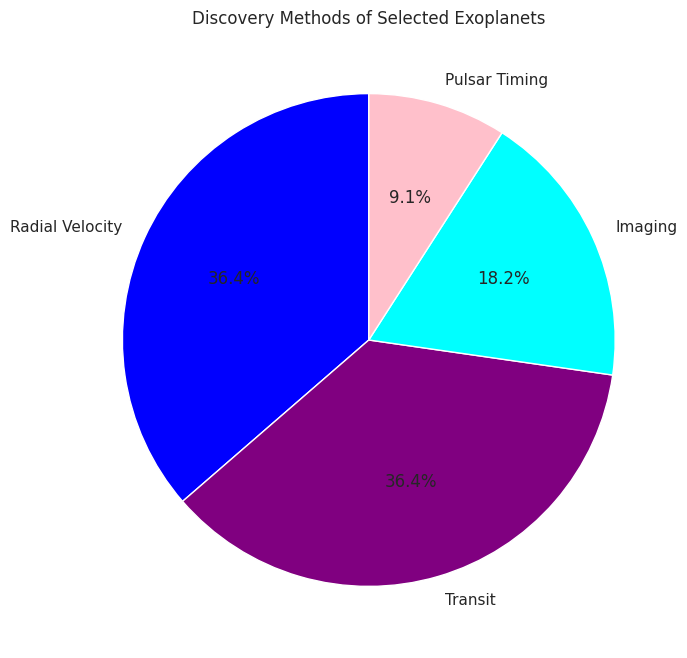

In [469]:
selected_planets = ['Kepler-16 b', 'TRAPPIST-1 e', '55 Cnc e', '51 Peg b', 'Kepler-186 f',
                    'HD 112300 b', 'Proxima Cen b', 'COCONUTS-2 b', 'KELT-9 b', 'HD 100546 b', 'PSR B1257+12 c']
selected_exo = exo[exo['pl_name'].isin(selected_planets)]
discovery_method_counts = selected_exo['discoverymethod'].value_counts()
plt.figure(figsize=(8, 8))
colors = ['blue', 'purple', 'cyan', 'pink']
plt.pie(discovery_method_counts, labels=discovery_method_counts.index, autopct='%1.1f%%', startangle=90, colors=colors)
plt.title('Discovery Methods of Selected Exoplanets')
plt.show()


# Handeling nulls

In [470]:
columns_to_drop = [
    'pl_orbpererr1', 'pl_orbpererr2', 'pl_radeerr1', 'pl_radeerr2', 'pl_radelim',
    'pl_radjerr1', 'pl_radjerr2', 'pl_radjlim', 'pl_bmasseerr1', 'pl_bmasseerr2',
    'pl_bmasselim', 'pl_orbeccenerr1', 'pl_orbeccenerr2', 'pl_orbeccenlim',
    'pl_insolerr1', 'pl_insolerr2', 'pl_insollim', 'pl_eqterr1', 'pl_eqterr2',
    'pl_eqtlim', 'disc_facility', 'discoverymethod', 'pl_controv_flag'
]
exo_cleaned = exo.drop(columns=columns_to_drop, axis=1)
exo_cleaned.shape

(5756, 61)

In [471]:
exo_numeric = exo_cleaned.select_dtypes(include=['float64', 'int64'])
scaler = StandardScaler()
exo_scaled = pd.DataFrame(scaler.fit_transform(exo_numeric), columns=exo_numeric.columns)
knn_imputer = KNNImputer(n_neighbors=5)
exo_imputed = pd.DataFrame(knn_imputer.fit_transform(exo_scaled), columns=exo_numeric.columns)
exo_imputed_unscaled = pd.DataFrame(scaler.inverse_transform(exo_imputed), columns=exo_numeric.columns)
exo_final = pd.concat([exo_imputed_unscaled, exo_cleaned.select_dtypes(exclude=['float64', 'int64'])], axis=1)
exo_final.head()


,sy_snum,sy_pnum,disc_year,pl_orbper,pl_orbsmax,pl_orbsmaxerr1,pl_orbsmaxerr2,pl_rade,pl_radj,pl_bmasse,...,sy_gaiamagerr2,pl_name,hostname,pl_orbperlim,pl_orbsmaxlim,pl_bmassprov,st_spectype,st_metratio,rastr,decstr
0,2.0,1.0,2007.0,323.21000,1.178,0.000,0.00,12.2,1.09,4914.89849,...,-0.003848,11 Com b,11 Com,False,False,Msini,G8 III,[Fe/H],12h20m42.91s,+17d47m35.71s
1,1.0,1.0,2009.0,516.21997,1.530,0.070,-0.07,12.3,1.09,4684.81420,...,-0.003903,11 UMi b,11 UMi,False,False,Msini,K4 III,[Fe/H],15h17m05.90s,+71d49m26.19s
2,1.0,1.0,2008.0,186.76000,0.775,0.000,0.00,13.1,1.16,1131.15130,...,-0.002826,14 And b,14 And,False,False,Msini,K0 III,[Fe/H],23h31m17.80s,+39d14m09.01s
3,1.0,2.0,2002.0,1765.03890,2.774,0.109,-0.12,12.6,1.12,2559.47216,...,-0.000351,14 Her b,14 Her,False,False,Mass,K0 V,[Fe/H],16h10m24.50s,+43d48m58.90s
4,3.0,1.0,1996.0,798.50000,1.660,0.030,-0.03,13.5,1.20,565.73740,...,-0.000603,16 Cyg B b,16 Cyg B,False,False,Msini,G3 V,[Fe/H],19h41m51.75s,+50d31m00.57s


In [472]:
null_counts = exo_final.isnull().sum()
print("Null values in each column after KNN Imputation:\n", null_counts[null_counts > 0])


Null values in each column after KNN Imputation:
 st_spectype    3697
st_metratio     498
dtype: int64


In [473]:
features_for_imputation = ['st_teff', 'st_rad', 'st_mass', 'st_spectype']
exo_knn = exo_final[features_for_imputation].copy()
label_encoder = LabelEncoder()
exo_knn['st_spectype_encoded'] = label_encoder.fit_transform(exo_knn['st_spectype'].astype(str))
exo_knn.drop('st_spectype', axis=1, inplace=True)
knn_imputer = KNNImputer(n_neighbors=5)
exo_knn_imputed = pd.DataFrame(knn_imputer.fit_transform(exo_knn), columns=exo_knn.columns)
exo_knn_imputed['st_spectype_imputed'] = label_encoder.inverse_transform(exo_knn_imputed['st_spectype_encoded'].round().astype(int))
exo_final['st_spectype'] = exo_knn_imputed['st_spectype_imputed']
print(exo_final['st_spectype'].isnull().sum())

0


In [474]:
unique_values = exo['st_metratio'].unique()
print(unique_values)


['[Fe/H]' nan '[M/H]']


In [475]:
print("Initial nulls in st_metratio:", exo_final['st_metratio'].isnull().sum())
print("Initial nulls in st_met:", exo_final['st_met'].isnull().sum())


Initial nulls in st_metratio: 498
Initial nulls in st_met: 0


In [476]:
mapping = exo_final.groupby('st_metratio')['st_met'].agg(['mean', 'min', 'max']).reset_index()
print(mapping)
bins = [-float('inf'), -0.5, -0.2, 0, 0.2, 0.5, float('inf')]
labels = ['Low', 'Below Average', 'Average', 'Above Average', 'High', 'Very High']
exo_final['st_met_binned'] = pd.cut(exo_final['st_met'], bins=bins, labels=labels)
mapping_dict = exo_final.groupby('st_met_binned')['st_metratio'].agg(lambda x: x.mode()[0]).to_dict()
exo_final['st_metratio'] = exo_final['st_metratio'].fillna(exo_final['st_met_binned'].map(mapping_dict))
exo_final.drop(columns=['st_met_binned'], inplace=True)

  st_metratio      mean   min    max
0      [Fe/H]  0.013909 -1.00  0.560
1       [M/H]  0.006010 -0.89  0.415


<ipython-input-476-f3a57a9e6d7d>:6: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [477]:
print(exo_final['st_metratio'].isnull().sum())

0


In [478]:
null_counts = exo_final.isnull().sum()
print("Summation of nulls in the data:\n", null_counts.sum())


Summation of nulls in the data:
 0


# Prediction Model

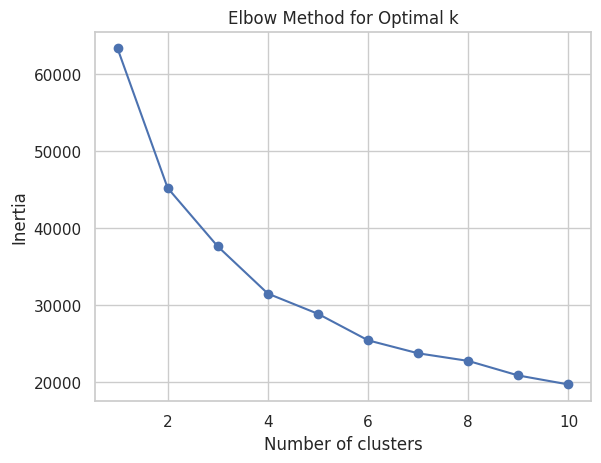

In [479]:
features_for_clustering = [ 'pl_orbper', 'pl_orbsmax', 'pl_rade',
    'pl_bmasse', 'pl_insol', 'pl_eqt',
    'st_teff', 'st_rad', 'st_mass','sy_dist','pl_orbeccen']
for feature in features_for_clustering:
    Q1 = exo_final[feature].quantile(0.25)
    Q3 = exo_final[feature].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    exo_final[feature] = exo_final[feature].clip(lower=lower_bound, upper=upper_bound)

exo_clustering = exo_final[features_for_clustering].copy()
scaler = StandardScaler()
exo_clustering_scaled = pd.DataFrame(scaler.fit_transform(exo_clustering), columns=exo_clustering.columns)
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(exo_clustering_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()


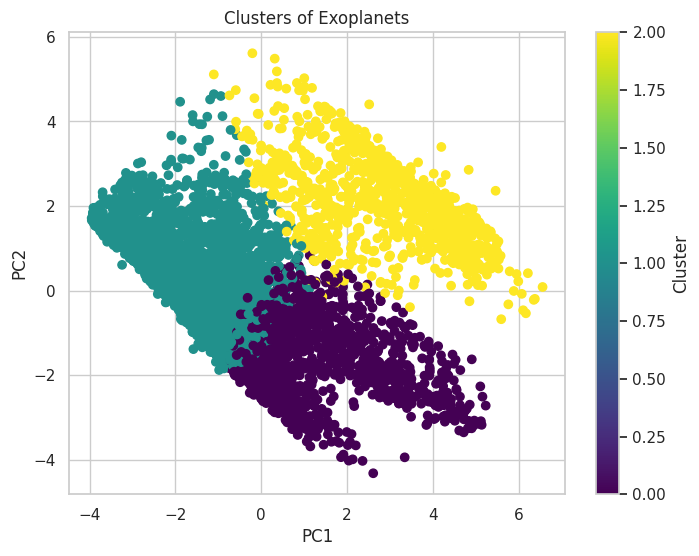

Cluster 0:
pl_orbper         7.058012
pl_orbsmax        0.069048
pl_rade           7.416908
pl_bmasse       131.439295
pl_insol        713.665557
pl_eqt         1363.980344
st_teff        5905.090131
st_rad            1.300113
st_mass           1.128983
sy_dist         631.460561
pl_orbeccen       0.040879
dtype: float64
Cluster 1:
pl_orbper        24.019085
pl_orbsmax        0.155389
pl_rade           2.857194
pl_bmasse        18.334962
pl_insol         96.202395
pl_eqt          694.322178
st_teff        5071.490182
st_rad            0.821633
st_mass           0.813829
sy_dist         574.511253
pl_orbeccen       0.038400
dtype: float64
Cluster 2:
pl_orbper       112.170872
pl_orbsmax        0.615025
pl_rade          12.604425
pl_bmasse       350.210045
pl_insol        572.779147
pl_eqt          999.508259
st_teff        5239.123519
st_rad            1.285924
st_mass           1.028312
sy_dist         379.652152
pl_orbeccen       0.154630
dtype: float64


In [480]:
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
exo_final['cluster'] = kmeans.fit_predict(exo_clustering_scaled)
exo_clustering_scaled = pd.DataFrame(scaler.fit_transform(exo_clustering), columns=exo_clustering.columns)
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(exo_clustering_scaled)

plt.figure(figsize=(8,6))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=exo_final['cluster'], cmap='viridis')
plt.title('Clusters of Exoplanets')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.colorbar(label='Cluster')
plt.show()
for i in range(n_clusters):
    print(f"Cluster {i}:")
    print(exo_final[exo_final['cluster'] == i][features_for_clustering].mean())


In [481]:

silhouette_avg = silhouette_score(exo_clustering_scaled, exo_final['cluster'])
print(f"The average silhouette score is: {silhouette_avg}")


The average silhouette score is: 0.2722678864369132


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` 

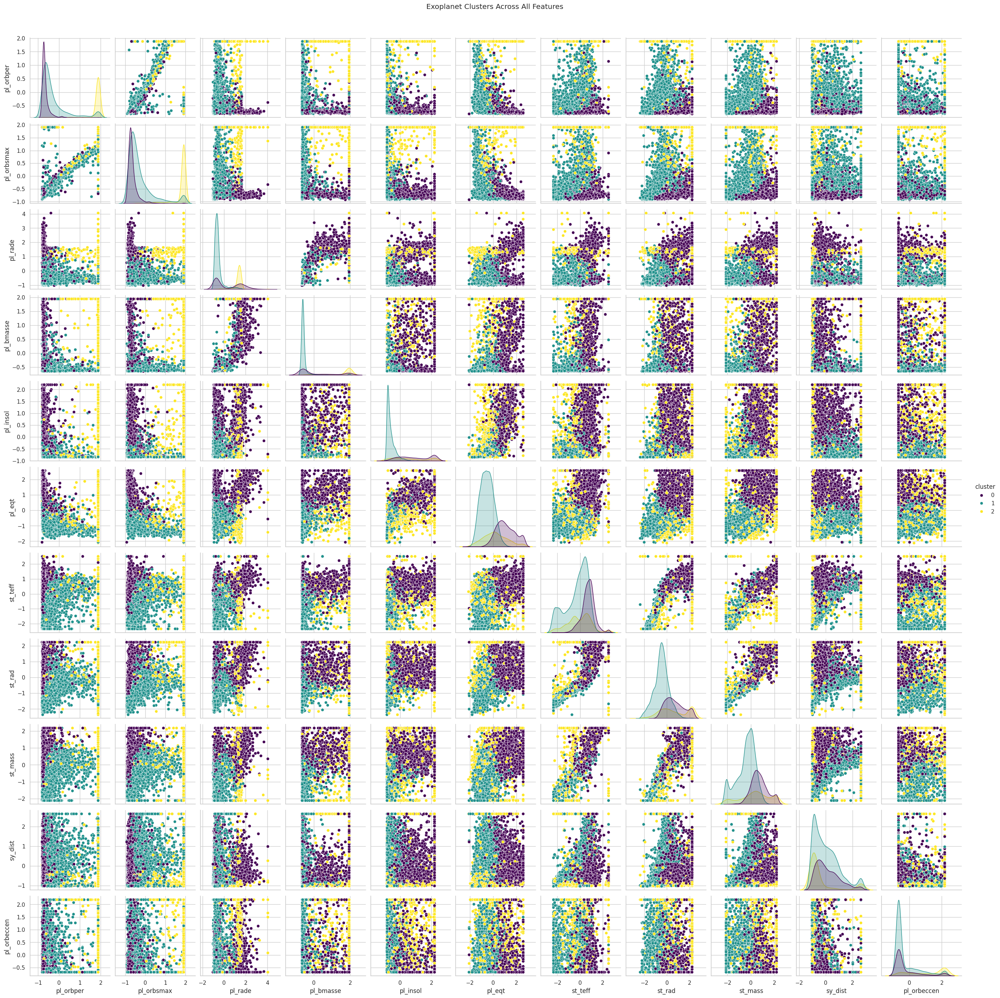

In [482]:
exo_clustering_scaled['cluster'] = exo_final['cluster']
sns.pairplot(exo_clustering_scaled, hue='cluster', diag_kind='kde', palette='viridis')
plt.suptitle('Exoplanet Clusters Across All Features', y=1.02)
plt.show()

In [483]:
exo_final['habitable'] = exo_final['cluster'].apply(lambda x: 1 if x == 1 else 0)
X = exo_final[features_for_clustering]
y = exo_final['habitable']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred):.2f}')
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))

Accuracy: 0.98
[[515   9]
 [  9 619]]
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       524
           1       0.99      0.99      0.99       628

    accuracy                           0.98      1152
   macro avg       0.98      0.98      0.98      1152
weighted avg       0.98      0.98      0.98      1152



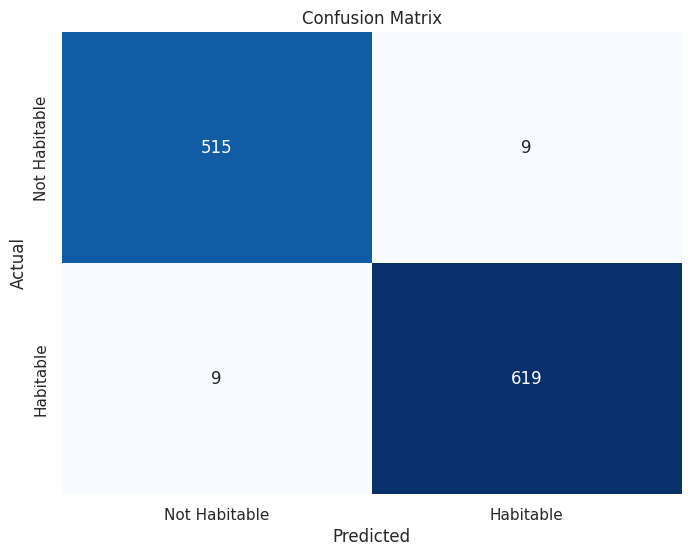

In [484]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Not Habitable', 'Habitable'],
            yticklabels=['Not Habitable', 'Habitable'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [485]:
planets_to_check = ['Kepler-16 b', 'TRAPPIST-1 e', '55 Cnc e', '51 Peg b',
                    'Kepler-186 f', 'PSR B0329+54 b', 'Proxima Cen b',
                    'COCONUTS-2 b', 'KELT-9 b', 'HD 100546 b', 'PSR B1257+12 c','Kepler-22 b','TOI-715 b','WASP-12 b','HD 112300 b']

planets_data = exo_final[exo_final['pl_name'].isin(planets_to_check)]
predictions = model.predict(planets_data[features_for_clustering])
planets_data['predicted_habitable'] = predictions
for index, row in planets_data.iterrows():
    print(f"Planet: {row['pl_name']}, Predicted Habitability: {'Yes' if row['predicted_habitable'] == 1 else 'No'}")


Planet: 51 Peg b, Predicted Habitability: No
Planet: 55 Cnc e, Predicted Habitability: No
Planet: COCONUTS-2 b, Predicted Habitability: No
Planet: HD 100546 b, Predicted Habitability: No
Planet: HD 112300 b, Predicted Habitability: No
Planet: KELT-9 b, Predicted Habitability: No
Planet: Kepler-16 b, Predicted Habitability: No
Planet: Kepler-186 f, Predicted Habitability: Yes
Planet: Kepler-22 b, Predicted Habitability: No
Planet: PSR B0329+54 b, Predicted Habitability: No
Planet: PSR B1257+12 c, Predicted Habitability: No
Planet: Proxima Cen b, Predicted Habitability: Yes
Planet: TOI-715 b, Predicted Habitability: Yes
Planet: TRAPPIST-1 e, Predicted Habitability: Yes
Planet: WASP-12 b, Predicted Habitability: No


<ipython-input-485-0695b14f8d71>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [486]:
features_for_clustering = [
    'pl_orbper', 'pl_orbsmax', 'pl_rade',
    'pl_bmasse', 'pl_insol', 'pl_eqt',
    'st_teff', 'st_rad', 'st_mass', "sy_dist","pl_orbeccen"
]
X = exo_final[features_for_clustering].copy()
y = exo_final['habitable']
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)
scaler = StandardScaler()
X_resampled_scaled = scaler.fit_transform(X_resampled)
X_train, X_test, y_train, y_test = train_test_split(X_resampled_scaled, y_resampled, test_size=0.2, random_state=42)
model = GradientBoostingClassifier(random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
planets_to_check = ['Kepler-16 b', 'TRAPPIST-1 e', '55 Cnc e', '51 Peg b',
                    'Kepler-186 f', 'PSR B0329+54 b', 'Proxima Cen b',
                    'COCONUTS-2 b', 'KELT-9 b', 'HD 100546 b', 'PSR B1257+12 c']
planets_data = exo_final[exo_final['pl_name'].isin(planets_to_check)]
planets_data_scaled = scaler.transform(planets_data[features_for_clustering])
predictions = model.predict(planets_data_scaled)
planets_data['predicted_habitable'] = predictions
for index, row in planets_data.iterrows():
    print(f"Planet: {row['pl_name']}, Predicted Habitability: {'Yes' if row['predicted_habitable'] == 1 else 'No'}")

Accuracy: 0.98
Confusion Matrix:
[[661  14]
 [ 14 630]]

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       675
           1       0.98      0.98      0.98       644

    accuracy                           0.98      1319
   macro avg       0.98      0.98      0.98      1319
weighted avg       0.98      0.98      0.98      1319

Planet: 51 Peg b, Predicted Habitability: No
Planet: 55 Cnc e, Predicted Habitability: No
Planet: COCONUTS-2 b, Predicted Habitability: No
Planet: HD 100546 b, Predicted Habitability: No
Planet: KELT-9 b, Predicted Habitability: No
Planet: Kepler-16 b, Predicted Habitability: No
Planet: Kepler-186 f, Predicted Habitability: Yes
Planet: PSR B0329+54 b, Predicted Habitability: No
Planet: PSR B1257+12 c, Predicted Habitability: No
Planet: Proxima Cen b, Predicted Habitability: Yes
Planet: TRAPPIST-1 e, Predicted Habitability: Yes


<ipython-input-486-c8e25908b27b>:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



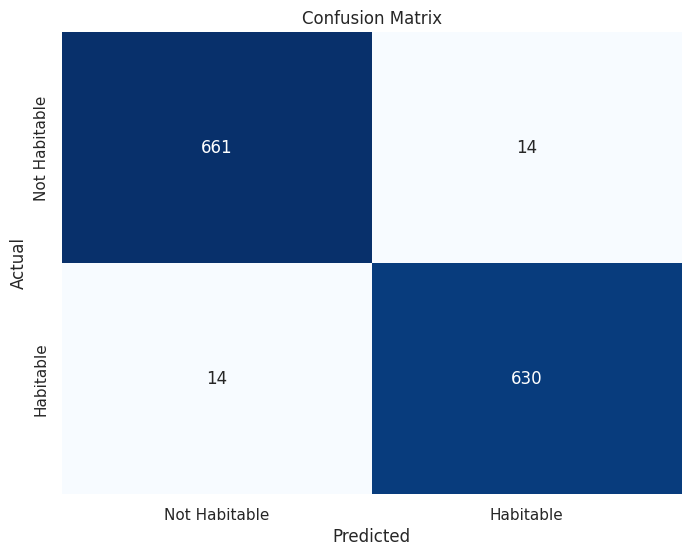

In [487]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Not Habitable', 'Habitable'],
            yticklabels=['Not Habitable', 'Habitable'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


In [488]:
exo_final.shape

(5756, 63)

# Comparisons between planets and earth and jupiter


# PSR B1257+12 c


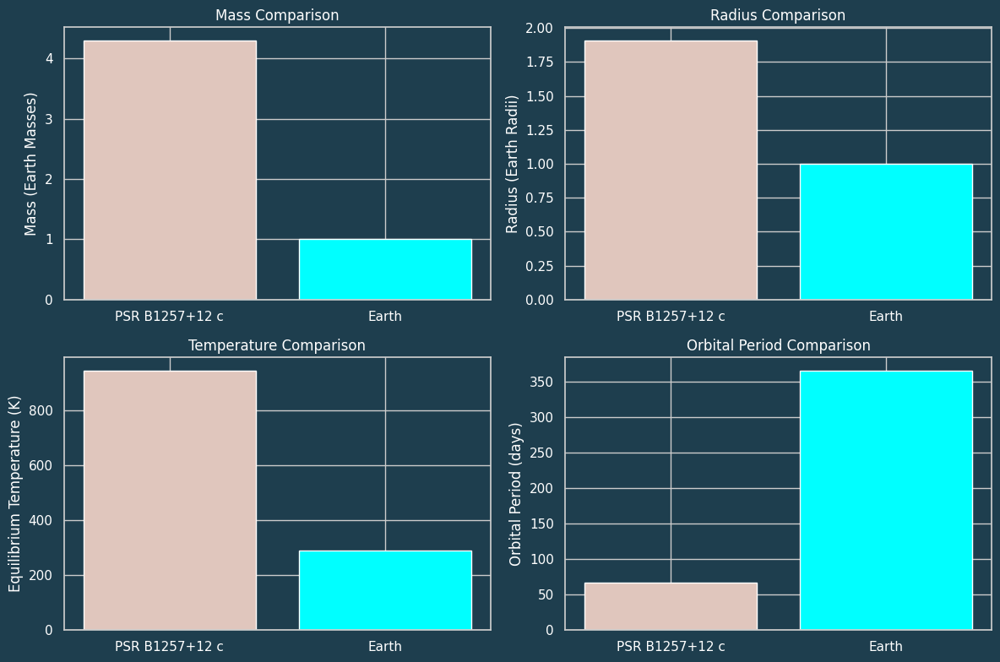

In [489]:
PSR= exo_final[exo_final['pl_name'] == 'PSR B1257+12 c']
earth_data = pd.DataFrame({'pl_name': ['Earth'],
                           'pl_bmasse': [1],
                           'pl_rade': [1],
                           'pl_eqt': [288],
                           'pl_orbper': [365.25]})

comparison_data = pd.concat([PSR , earth_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')
axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmasse'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Earth Masses)')
axs[0, 0].set_title('Mass Comparison')
#axs[0, 0].set_ylim(0,2)


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_rade'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Earth Radii)')
axs[0, 1].set_title('Radius Comparison')


axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')


plt.tight_layout()
plt.show()

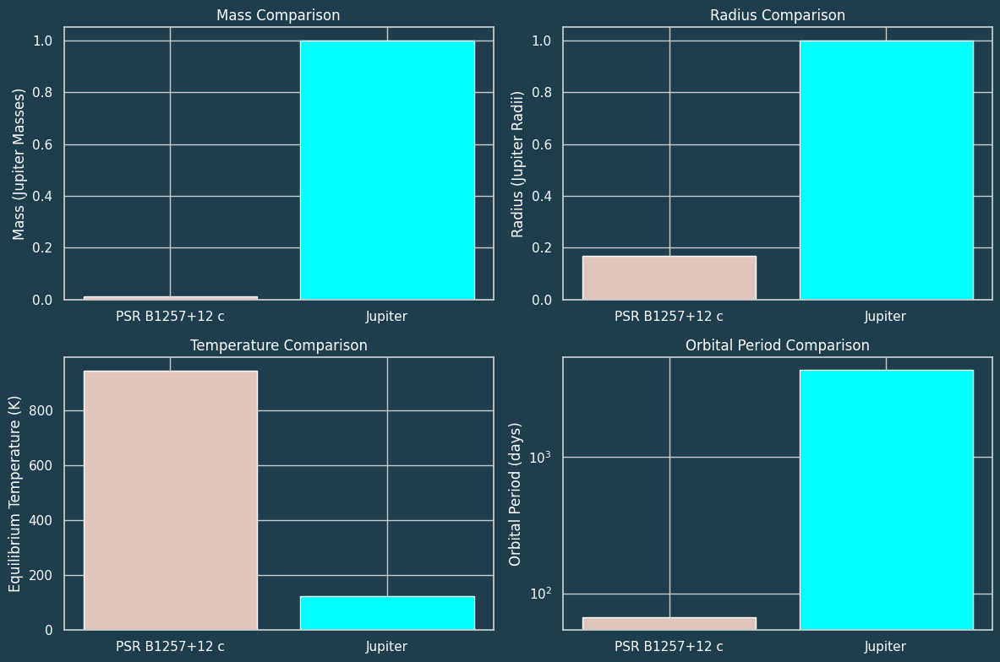

In [490]:
PSR= exo_final[exo_final['pl_name'] == 'PSR B1257+12 c']
jupiter_data = pd.DataFrame({'pl_name': ['Jupiter'],
                           'pl_bmassj': [1],
                           'pl_radj': [1],
                           'pl_eqt': [122],
                           'pl_orbper': [4331.865]})

comparison_data = pd.concat([PSR, jupiter_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmassj'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Jupiter Masses)')
axs[0, 0].set_title('Mass Comparison')
#axs[0, 0].set_yscale('log')

axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_radj'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Jupiter Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')
axs[1, 1].set_yscale('log')



plt.tight_layout()
plt.show()

# HD 100546 b


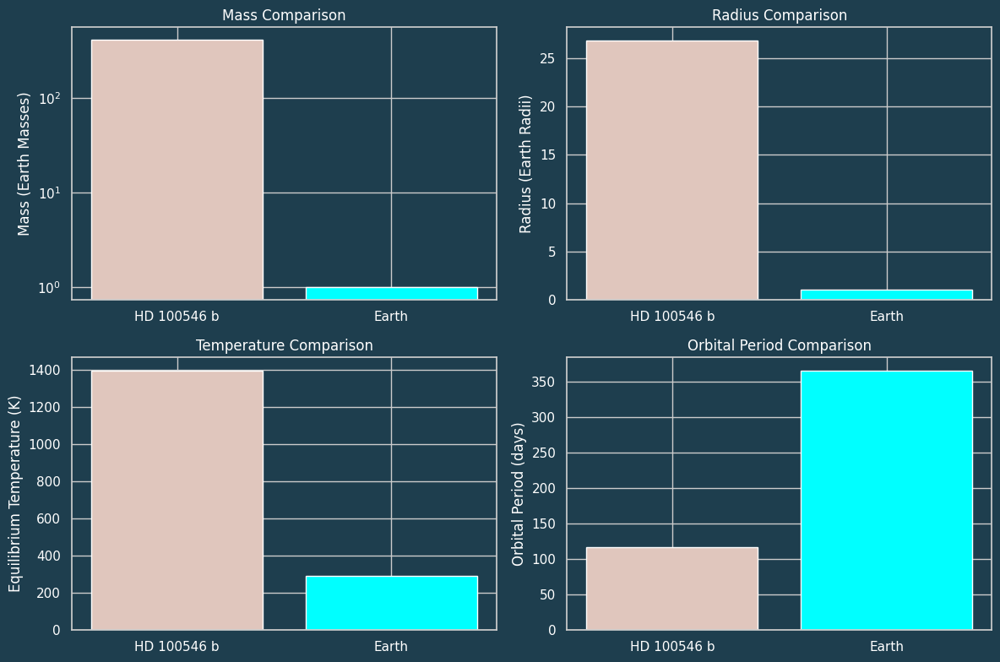

In [491]:
HD100546b= exo_final[exo_final['pl_name'] == 'HD 100546 b']
earth_data = pd.DataFrame({'pl_name': ['Earth'],
                           'pl_bmasse': [1],
                           'pl_rade': [1],
                           'pl_eqt': [288],
                           'pl_orbper': [365.25]})

comparison_data = pd.concat([HD100546b, earth_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')
axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmasse'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Earth Masses)')
axs[0, 0].set_title('Mass Comparison')
#axs[0, 0].set_ylim(0,50)
axs[0, 0].set_yscale('log')


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_rade'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Earth Radii)')
axs[0, 1].set_title('Radius Comparison')


axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')


plt.tight_layout()
plt.show()

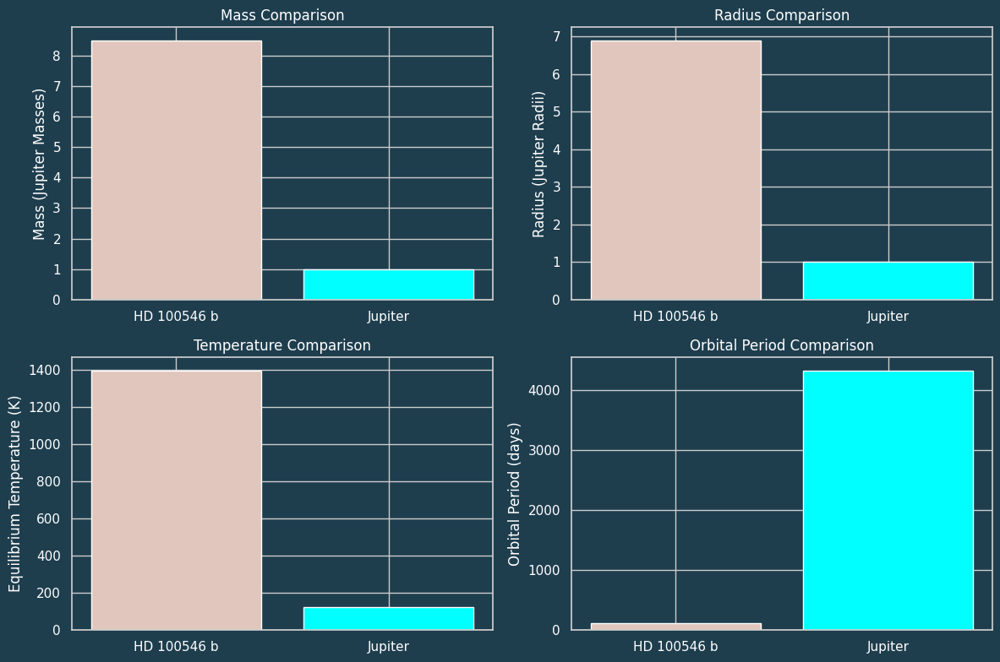

In [492]:
HD100546b= exo_final[exo_final['pl_name'] == 'HD 100546 b']
jupiter_data = pd.DataFrame({'pl_name': ['Jupiter'],
                           'pl_bmassj': [1],
                           'pl_radj': [1],
                           'pl_eqt': [122],
                           'pl_orbper': [4331.865]})

comparison_data = pd.concat([HD100546b, jupiter_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmassj'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Jupiter Masses)')
axs[0, 0].set_title('Mass Comparison')



axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_radj'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Jupiter Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')




plt.tight_layout()
plt.show()

#  KELT-9 b

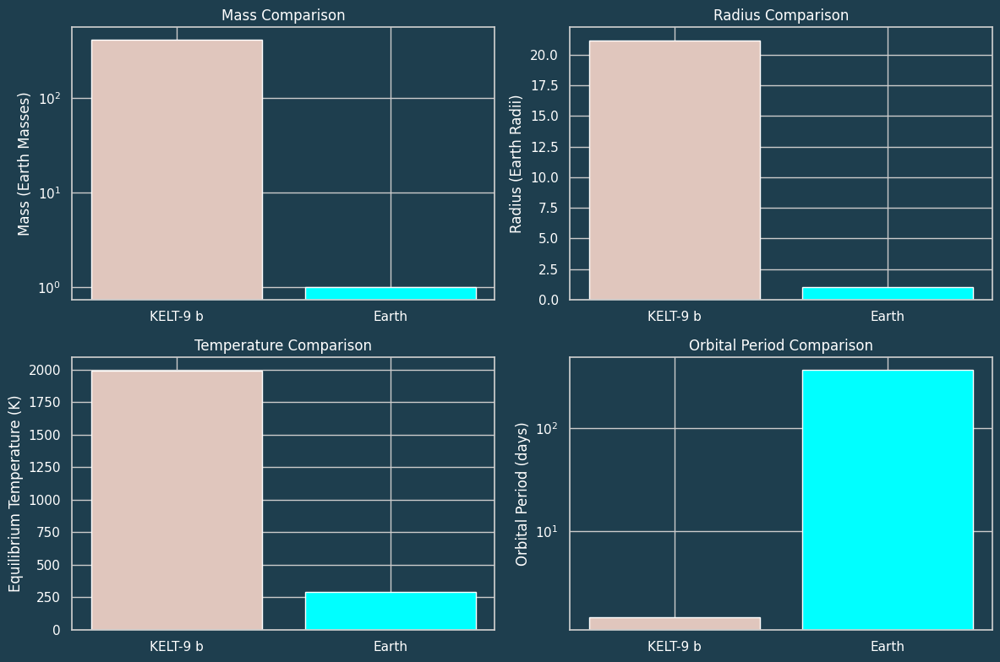

In [493]:
KELTb= exo_final[exo_final['pl_name'] == 'KELT-9 b']
earth_data = pd.DataFrame({'pl_name': ['Earth'],
                           'pl_bmasse': [1],
                           'pl_rade': [1],
                           'pl_eqt': [288],
                           'pl_orbper': [365.25]})

comparison_data = pd.concat([KELTb, earth_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')
axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmasse'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Earth Masses)')
axs[0, 0].set_title('Mass Comparison')
#axs[0, 0].set_ylim(0,2)
axs[0, 0].set_yscale('log')

axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_rade'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Earth Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')
axs[1, 1].set_yscale('log')

plt.tight_layout()
plt.show()

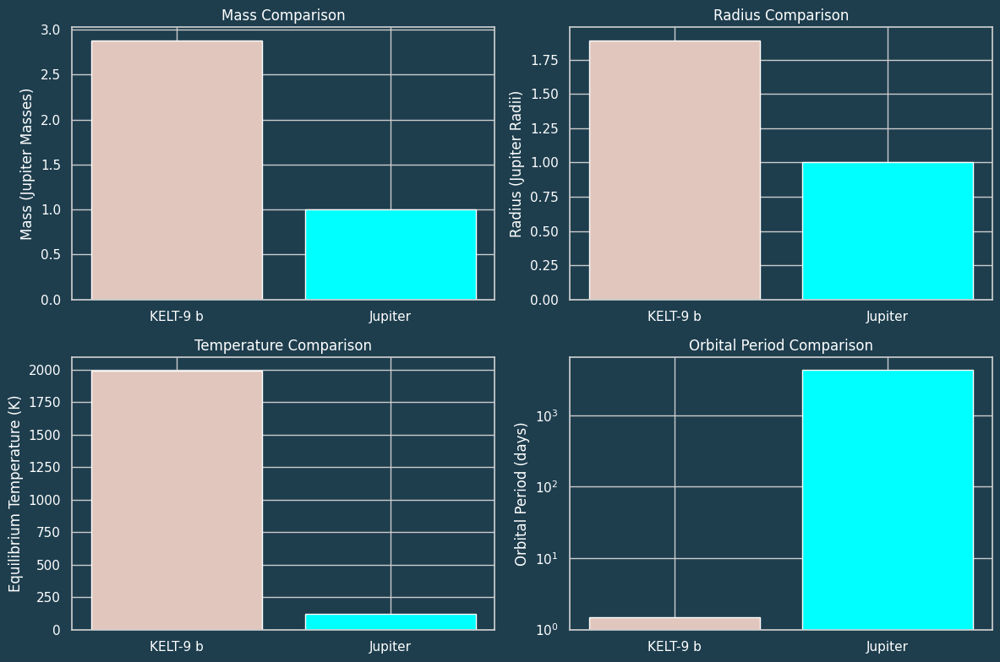

In [494]:
KELTb= exo_final[exo_final['pl_name'] == 'KELT-9 b']
jupiter_data = pd.DataFrame({'pl_name': ['Jupiter'],
                           'pl_bmassj': [1],
                           'pl_radj': [1],
                           'pl_eqt': [122],
                           'pl_orbper': [4331.865]})

comparison_data = pd.concat([KELTb, jupiter_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmassj'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Jupiter Masses)')
axs[0, 0].set_title('Mass Comparison')



axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_radj'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Jupiter Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')
axs[1, 1].set_yscale('log')



plt.tight_layout()
plt.show()

# COCONUTS-2 b


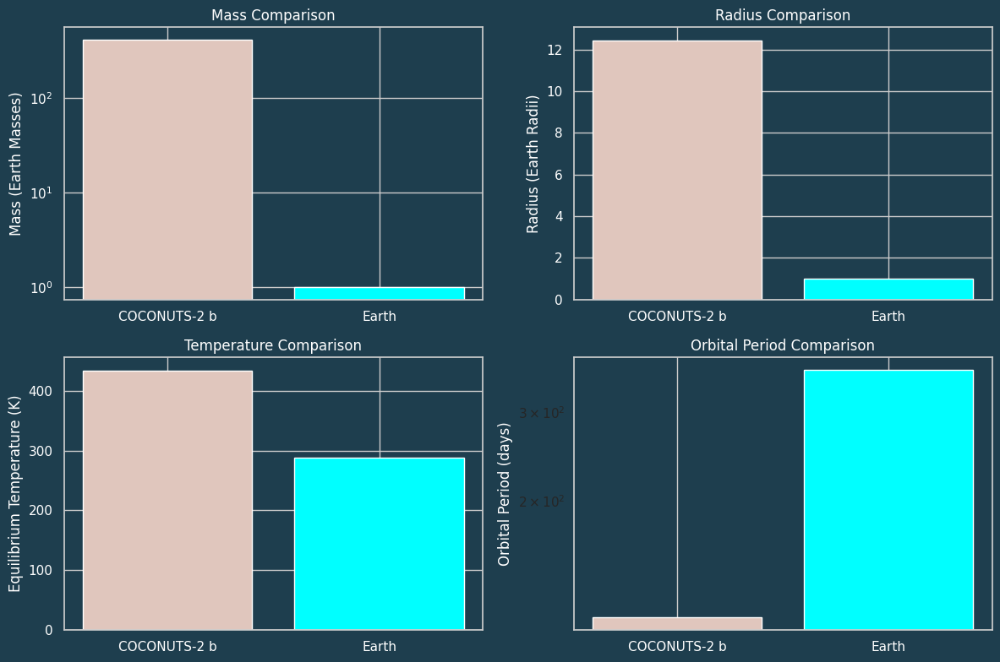

In [495]:
coconuts= exo_final[exo_final['pl_name'] == 'COCONUTS-2 b']
earth_data = pd.DataFrame({'pl_name': ['Earth'],
                           'pl_bmasse': [1],
                           'pl_rade': [1],
                           'pl_eqt': [288],
                           'pl_orbper': [365.25]})

comparison_data = pd.concat([coconuts, earth_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')
axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmasse'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Earth Masses)')
axs[0, 0].set_title('Mass Comparison')
#axs[0, 0].set_ylim(0,2)
axs[0, 0].set_yscale('log')


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_rade'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Earth Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')
axs[1, 1].set_yscale('log')

plt.tight_layout()
plt.show()

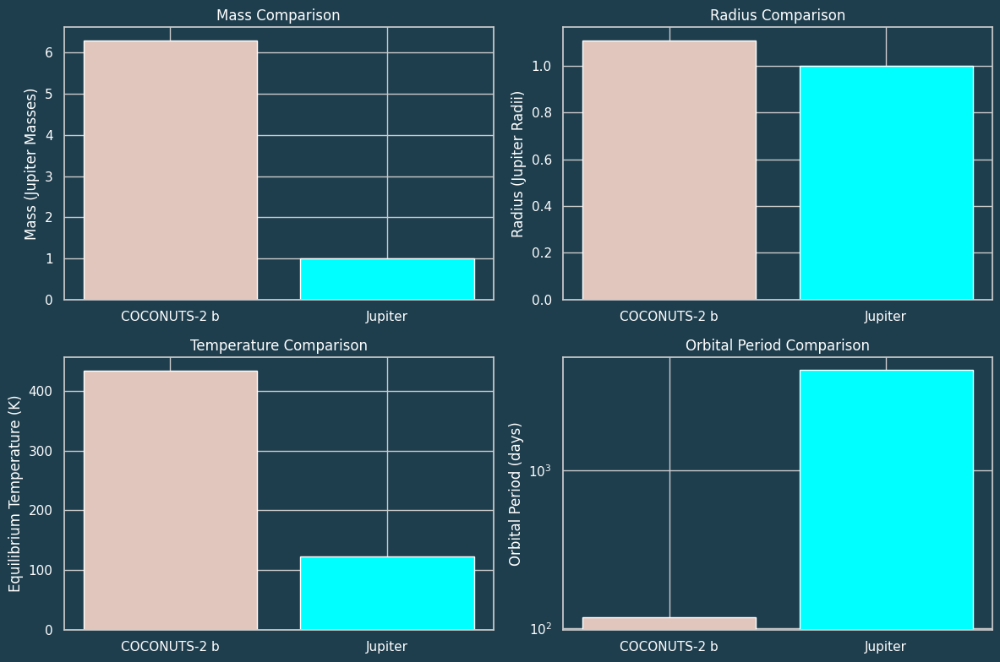

In [496]:
coconuts= exo_final[exo_final['pl_name'] == 'COCONUTS-2 b']
jupiter_data = pd.DataFrame({'pl_name': ['Jupiter'],
                           'pl_bmassj': [1],
                           'pl_radj': [1],
                           'pl_eqt': [122],
                           'pl_orbper': [4331.865]})

comparison_data = pd.concat([coconuts, jupiter_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmassj'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Jupiter Masses)')
axs[0, 0].set_title('Mass Comparison')



axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_radj'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Jupiter Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')
axs[1, 1].set_yscale('log')



plt.tight_layout()
plt.show()

# Proxima Cen b

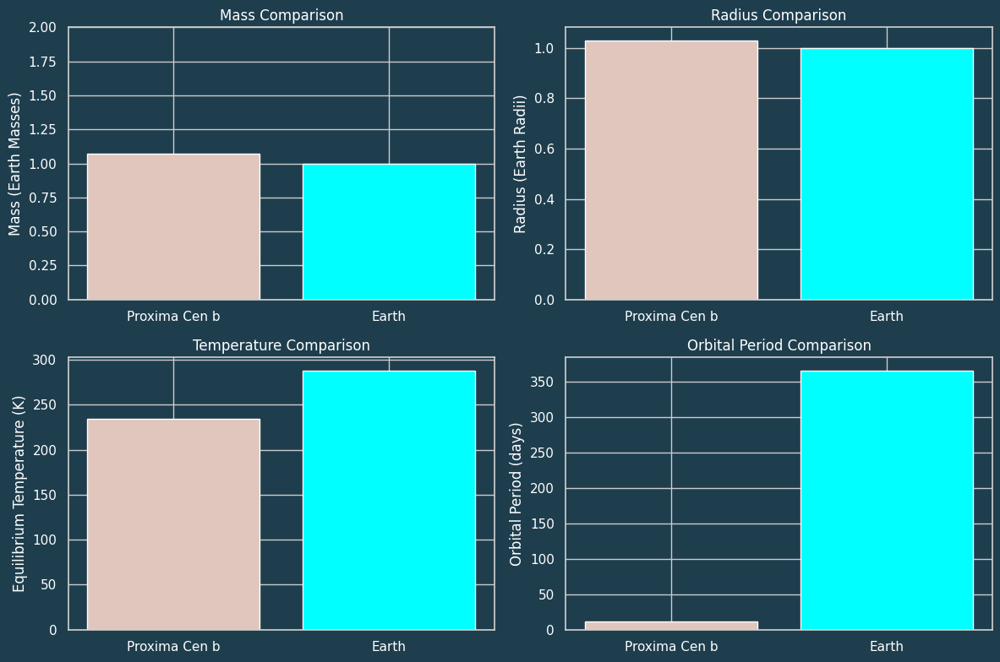

In [497]:
Proxima= exo_final[exo_final['pl_name'] == 'Proxima Cen b']
earth_data = pd.DataFrame({'pl_name': ['Earth'],
                           'pl_bmasse': [1],
                           'pl_rade': [1],
                           'pl_eqt': [288],
                           'pl_orbper': [365.25]})

comparison_data = pd.concat([Proxima, earth_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')
axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmasse'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Earth Masses)')
axs[0, 0].set_title('Mass Comparison')
axs[0, 0].set_ylim(0, 2)


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_rade'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Earth Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')


plt.tight_layout()
plt.show()

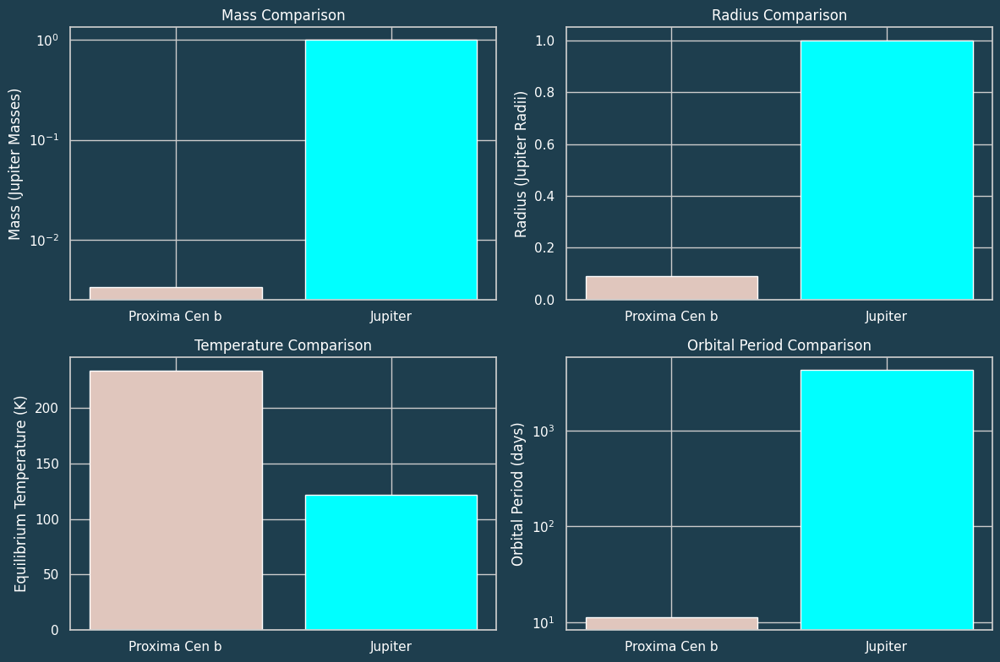

In [498]:
Proxima= exo_final[exo_final['pl_name'] == 'Proxima Cen b']
jupiter_data = pd.DataFrame({'pl_name': ['Jupiter'],
                           'pl_bmassj': [1],
                           'pl_radj': [1],
                           'pl_eqt': [122],
                           'pl_orbper': [4331.865]})

comparison_data = pd.concat([Proxima, jupiter_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmassj'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Jupiter Masses)')
axs[0, 0].set_title('Mass Comparison')
axs[0, 0].set_yscale('log')


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_radj'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Jupiter Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')
axs[1, 1].set_yscale('log')



plt.tight_layout()
plt.show()

#HD 112300 b


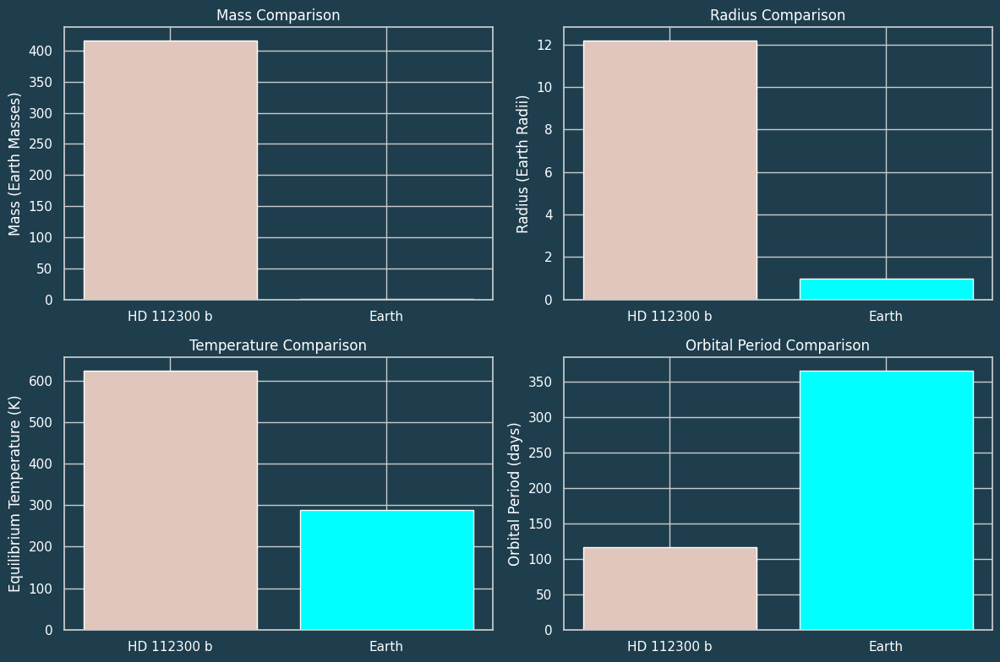

In [499]:
HD112300b = exo_final[exo_final['pl_name'] =='HD 112300 b']
earth_data = pd.DataFrame({'pl_name': ['Earth'],
                           'pl_bmasse': [1],
                           'pl_rade': [1],
                           'pl_eqt': [288],
                           'pl_orbper': [365.25]})

comparison_data = pd.concat([HD112300b, earth_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')
axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmasse'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Earth Masses)')
axs[0, 0].set_title('Mass Comparison')
#axs[0, 0].set_ylim(0, 2)


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_rade'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Earth Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')


plt.tight_layout()
plt.show()

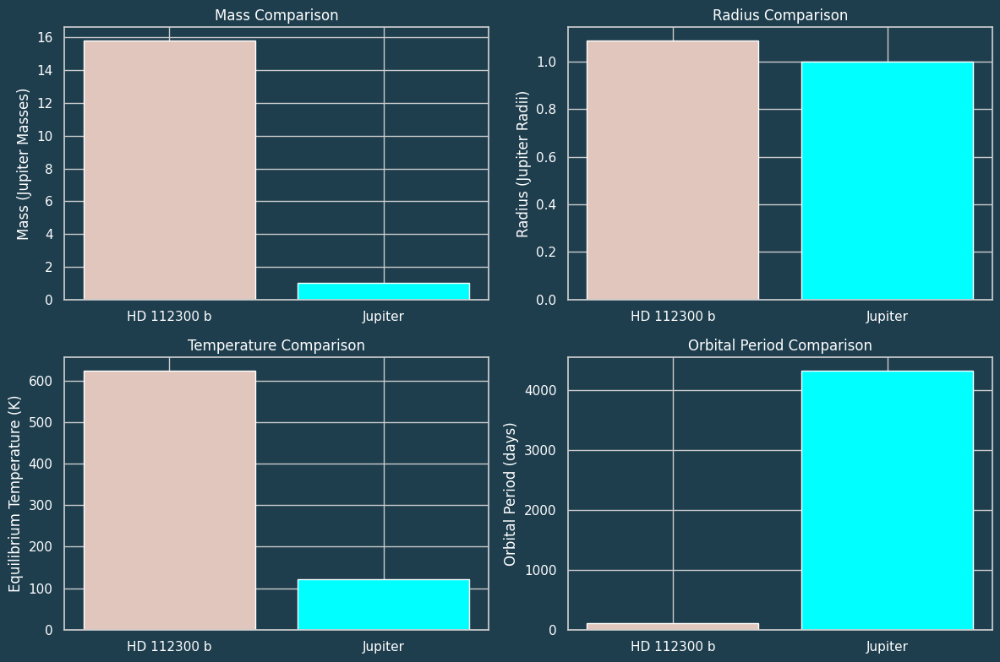

In [500]:
HD112300b = exo_final[exo_final['pl_name'] == 'HD 112300 b']
jupiter_data = pd.DataFrame({'pl_name': ['Jupiter'],
                           'pl_bmassj': [1],
                           'pl_radj': [1],
                           'pl_eqt': [122],
                           'pl_orbper': [4331.865]})

comparison_data = pd.concat([HD112300b, jupiter_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmassj'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Jupiter Masses)')
axs[0, 0].set_title('Mass Comparison')
#axs[0, 0].set_ylim(0, 2)


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_radj'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Jupiter Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')



plt.tight_layout()
plt.show()

# Kepler-186f

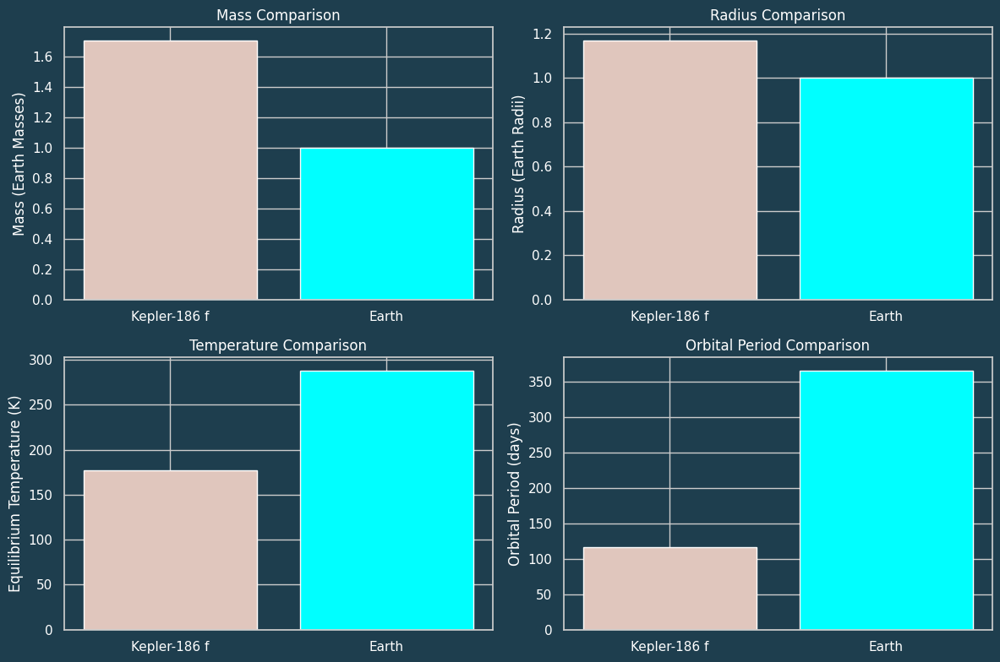

In [501]:
Kepler_186_f = exo_final[exo_final['pl_name'] == 'Kepler-186 f']
earth_data = pd.DataFrame({'pl_name': ['Earth'],
                           'pl_bmasse': [1],
                           'pl_rade': [1],
                           'pl_eqt': [288],
                           'pl_orbper': [365.25]})

comparison_data = pd.concat([Kepler_186_f, earth_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')
axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmasse'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Earth Masses)')
axs[0, 0].set_title('Mass Comparison')


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_rade'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Earth Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')


plt.tight_layout()
plt.show()

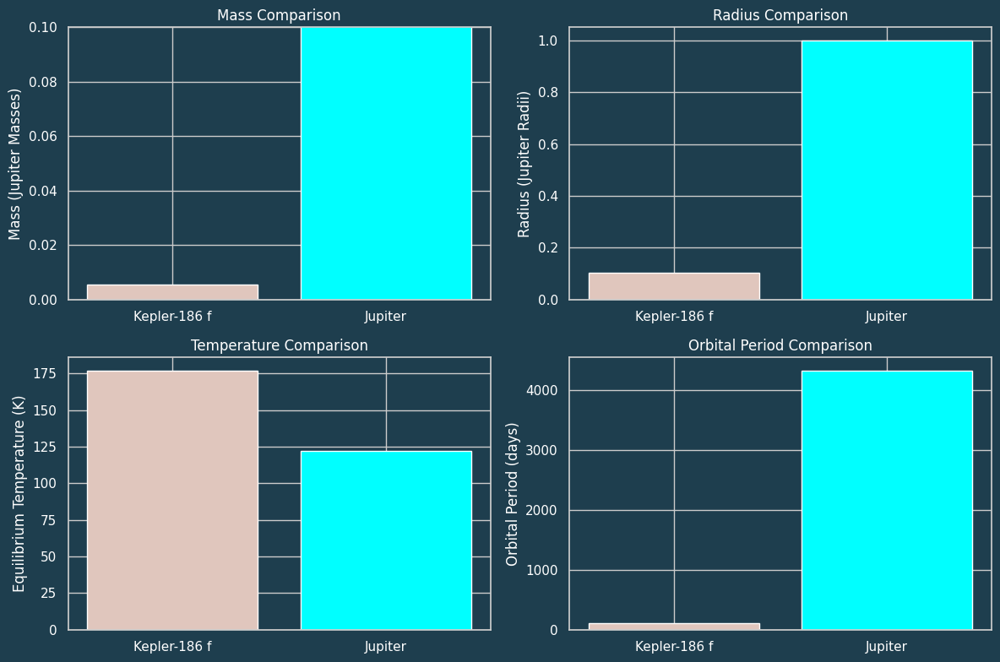

In [502]:
Kepler_186_f = exo_final[exo_final['pl_name'] == 'Kepler-186 f']
jupiter_data = pd.DataFrame({'pl_name': ['Jupiter'],
                           'pl_bmassj': [1],
                           'pl_radj': [1],
                           'pl_eqt': [122],
                           'pl_orbper': [4331.865]})

comparison_data = pd.concat([Kepler_186_f, jupiter_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmassj'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Jupiter Masses)')
axs[0, 0].set_title('Mass Comparison')
axs[0, 0].set_ylim(0, 0.1)


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_radj'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Jupiter Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')



plt.tight_layout()
plt.show()

# 51 pegasi b

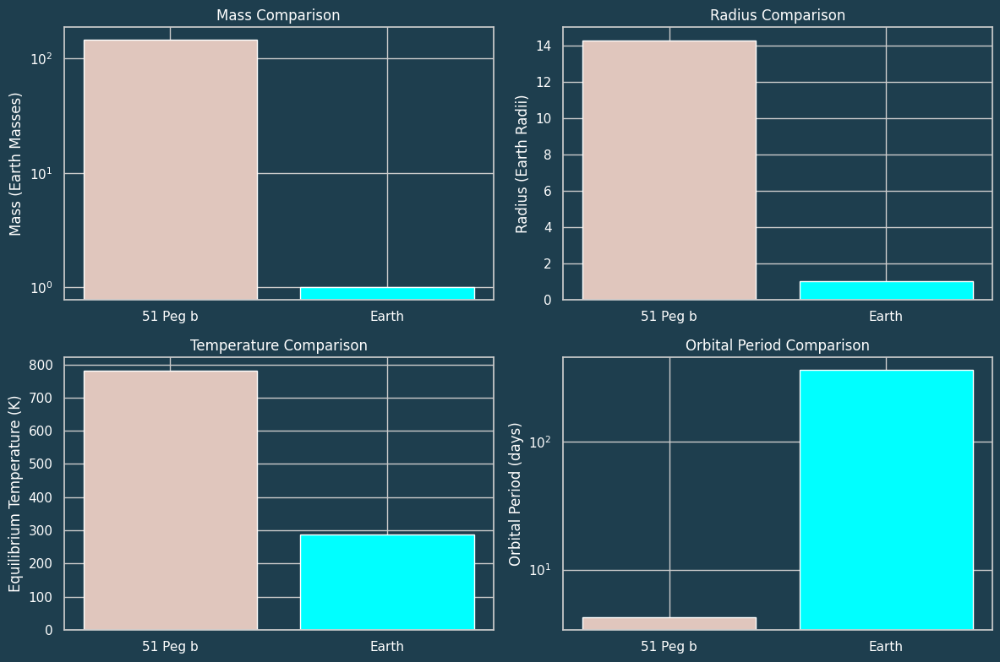

In [503]:
peg_b_data = exo_final[exo_final['pl_name'] == '51 Peg b']
earth_data = pd.DataFrame({'pl_name': ['Earth'],
                           'pl_bmasse': [1],
                           'pl_rade': [1],
                           'pl_eqt': [288],
                           'pl_orbper': [365.25]})

comparison_data = pd.concat([peg_b_data, earth_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')
axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmasse'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Earth Masses)')
axs[0, 0].set_title('Mass Comparison')
axs[0, 0].set_yscale('log')

axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_rade'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Earth Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')
axs[1, 1].set_yscale('log')

plt.tight_layout()
plt.show()

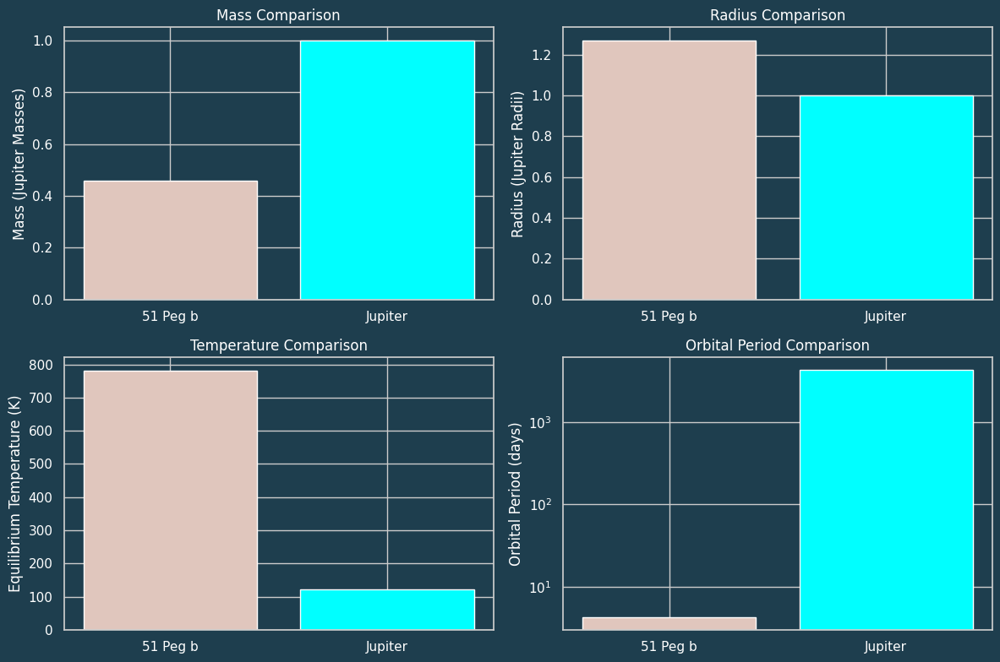

In [504]:
peg_b_data = exo_final[exo_final['pl_name'] == '51 Peg b']
jupiter_data = pd.DataFrame({'pl_name': ['Jupiter'],
                           'pl_bmassj': [1],
                           'pl_radj': [1],
                           'pl_eqt': [122],
                           'pl_orbper': [4331.865]})

comparison_data = pd.concat([peg_b_data, jupiter_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmassj'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Jupiter Masses)')
axs[0, 0].set_title('Mass Comparison')


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_radj'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Jupiter Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')
axs[1, 1].set_yscale('log')


plt.tight_layout()
plt.show()


# 55 Cancri e

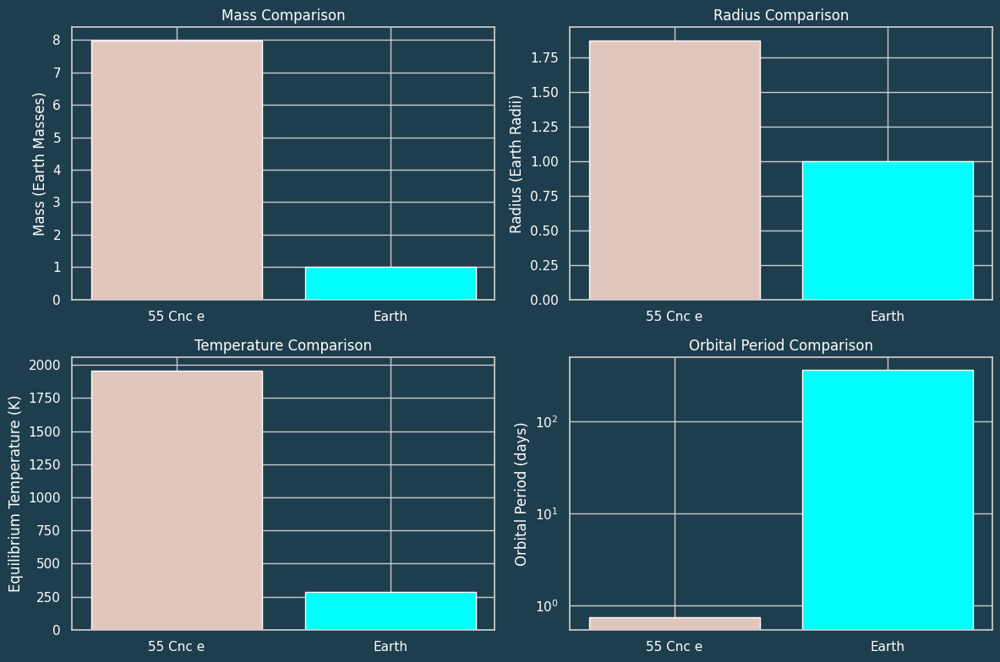

In [505]:
Cancri_e_data = exo_final[exo_final['pl_name'] == '55 Cnc e']
earth_data = pd.DataFrame({'pl_name': ['Earth'],
                           'pl_bmasse': [1],
                           'pl_rade': [1],
                           'pl_eqt': [288],
                           'pl_orbper': [365.25]})

comparison_data = pd.concat([Cancri_e_data, earth_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmasse'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Earth Masses)')
axs[0, 0].set_title('Mass Comparison')

axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_rade'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Earth Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')
axs[1, 1].set_yscale('log')

plt.tight_layout()
plt.show()


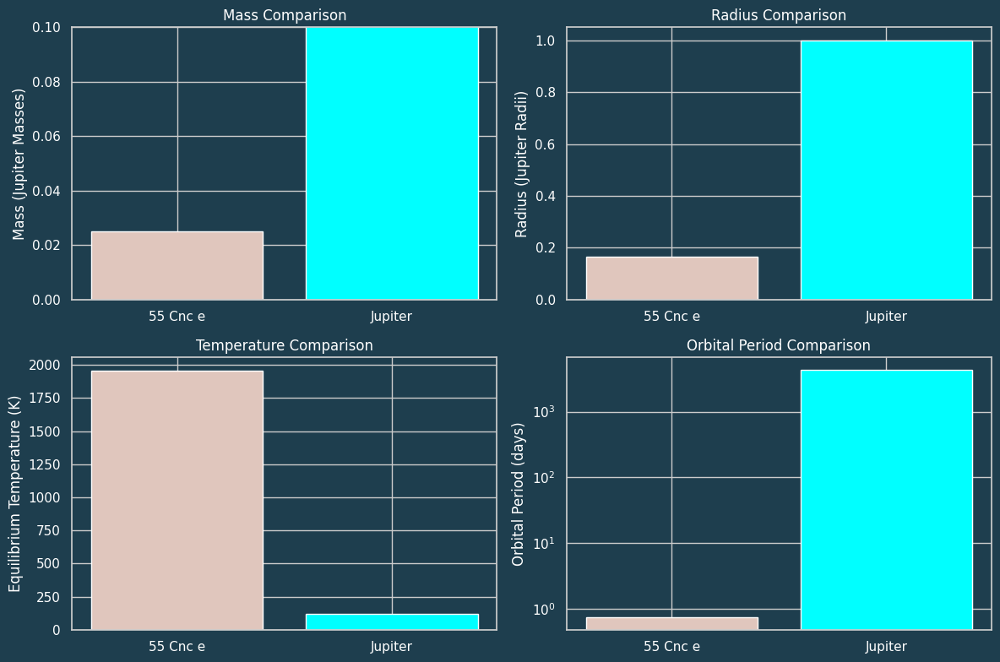

In [506]:
Cancri_e_data = exo_final[exo_final['pl_name'] == '55 Cnc e']
jupiter_data = pd.DataFrame({'pl_name': ['Jupiter'],
                           'pl_bmassj': [1],
                           'pl_radj': [1],
                           'pl_eqt': [122],
                           'pl_orbper': [4331.865]})

comparison_data = pd.concat([Cancri_e_data, jupiter_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmassj'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Jupiter Masses)')
axs[0, 0].set_title('Mass Comparison')
axs[0, 0].set_ylim(0, 0.1)
#axs[0, 0].set_yscale('log')

axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_radj'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Jupiter Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')
axs[1, 1].set_yscale('log')


plt.tight_layout()
plt.show()


# TRAPPIST-1 e

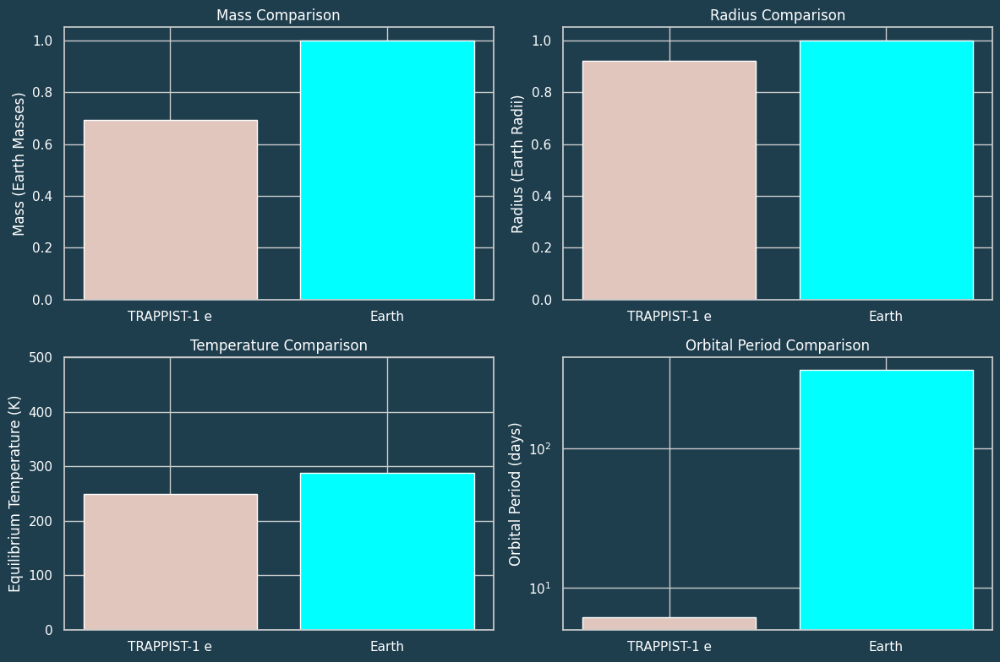

In [507]:
trappist_1e_data = exo_final[exo_final['pl_name'] == 'TRAPPIST-1 e']
earth_data = pd.DataFrame({'pl_name': ['Earth'],
                           'pl_bmasse': [1],
                           'pl_rade': [1],
                           'pl_eqt': [288],
                           'pl_orbper': [365.25]})

comparison_data = pd.concat([trappist_1e_data, earth_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmasse'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Earth Masses)')
axs[0, 0].set_title('Mass Comparison')

axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_rade'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Earth Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')
axs[1, 0].set_ylim(0, 500)

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')
axs[1, 1].set_yscale('log')


plt.tight_layout()
plt.show()


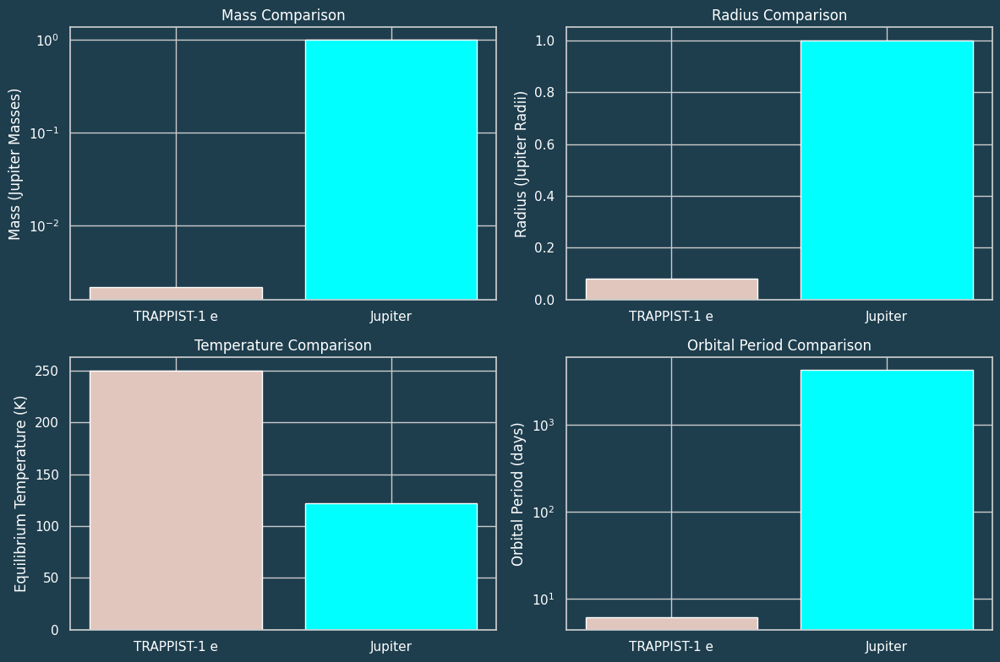

In [508]:
trappist_1e_data = exo_final[exo_final['pl_name'] == 'TRAPPIST-1 e']
jupiter_data = pd.DataFrame({'pl_name': ['Jupiter'],
                           'pl_bmassj': [1],
                           'pl_radj': [1],
                           'pl_eqt': [122],
                           'pl_orbper': [4331.865]})

comparison_data = pd.concat([trappist_1e_data, jupiter_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmassj'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Jupiter Masses)')
axs[0, 0].set_title('Mass Comparison')
axs[0, 0].set_yscale('log')


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_radj'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Jupiter Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')
axs[1, 1].set_yscale('log')


plt.tight_layout()
plt.show()


# Kepler-16 b

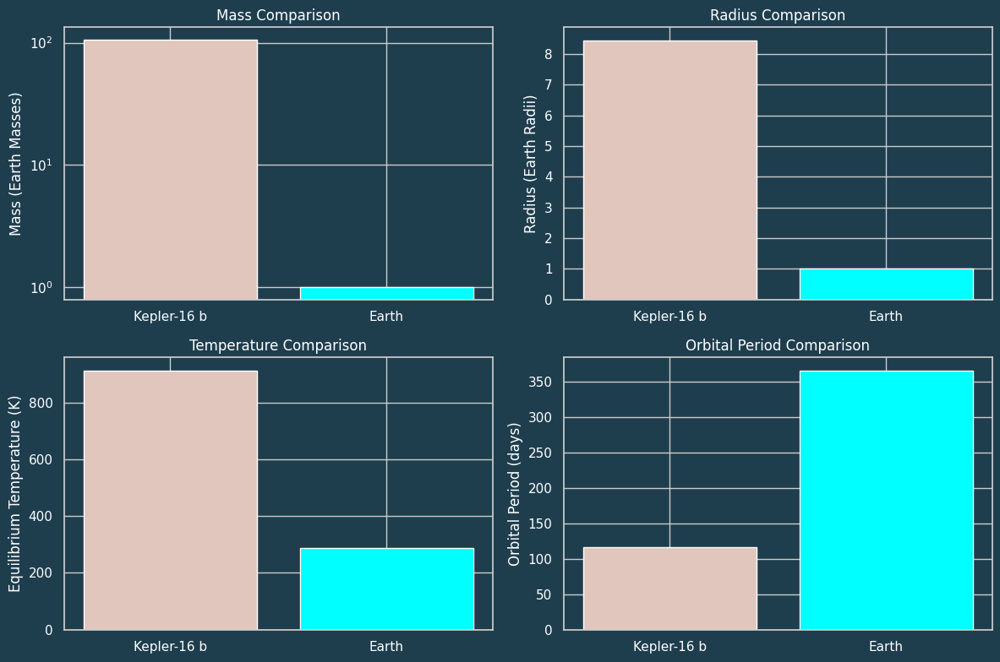

In [509]:
kepler_16_data = exo_final[exo_final['pl_name'] == 'Kepler-16 b']
earth_data = pd.DataFrame({'pl_name': ['Earth'],
                           'pl_bmasse': [1],
                           'pl_rade': [1],
                           'pl_eqt': [288],
                           'pl_orbper': [365.25]})

comparison_data = pd.concat([kepler_16_data, earth_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmasse'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Earth Masses)')
axs[0, 0].set_title('Mass Comparison')
axs[0, 0].set_yscale('log')


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_rade'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Earth Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')


plt.tight_layout()
plt.show()


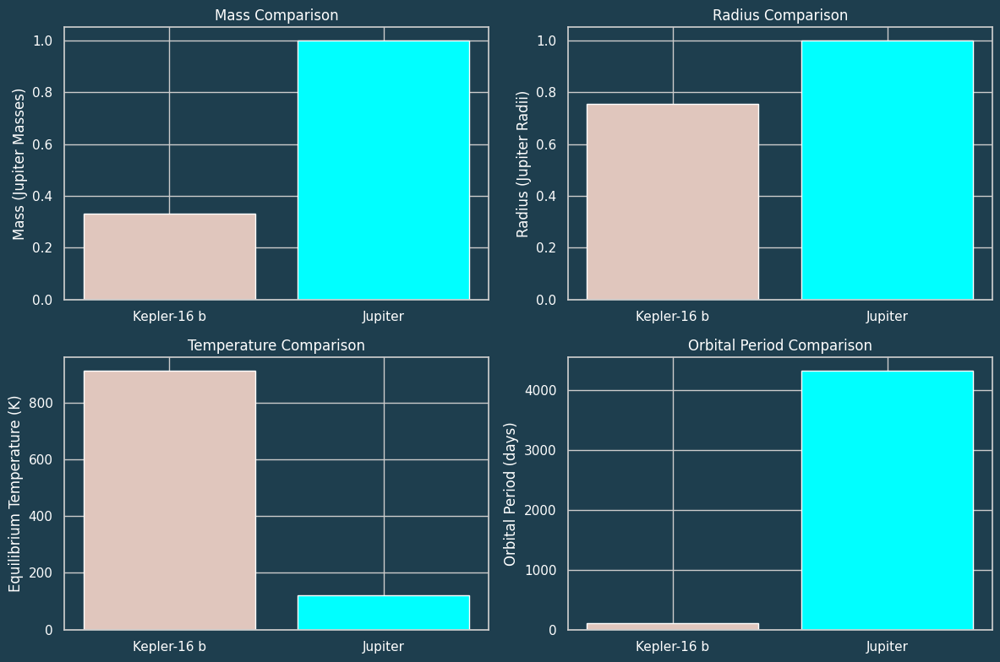

In [510]:
kepler_16_data = exo_final[exo_final['pl_name'] == 'Kepler-16 b']
jupiter_data = pd.DataFrame({'pl_name': ['Jupiter'],
                           'pl_bmassj': [1],
                           'pl_radj': [1],
                           'pl_eqt': [122],
                           'pl_orbper': [4331.865]})

comparison_data = pd.concat([kepler_16_data, jupiter_data], ignore_index=True)
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
fig.patch.set_facecolor('#1e3e4e')
for ax in axs.flat:
    ax.set_facecolor('#1e3e4e')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='both', colors='white')

axs[0, 0].bar(comparison_data['pl_name'], comparison_data['pl_bmassj'], color=['#E0C6BD', 'cyan'])
axs[0, 0].set_ylabel('Mass (Jupiter Masses)')
axs[0, 0].set_title('Mass Comparison')


axs[0, 1].bar(comparison_data['pl_name'], comparison_data['pl_radj'], color=['#E0C6BD', 'cyan'])
axs[0, 1].set_ylabel('Radius (Jupiter Radii)')
axs[0, 1].set_title('Radius Comparison')

axs[1, 0].bar(comparison_data['pl_name'], comparison_data['pl_eqt'], color=['#E0C6BD', 'cyan'])
axs[1, 0].set_ylabel('Equilibrium Temperature (K)')
axs[1, 0].set_title('Temperature Comparison')

axs[1, 1].bar(comparison_data['pl_name'], comparison_data['pl_orbper'], color=['#E0C6BD', 'cyan'])
axs[1, 1].set_ylabel('Orbital Period (days)')
axs[1, 1].set_title('Orbital Period Comparison')


plt.tight_layout()
plt.show()

# Sum up


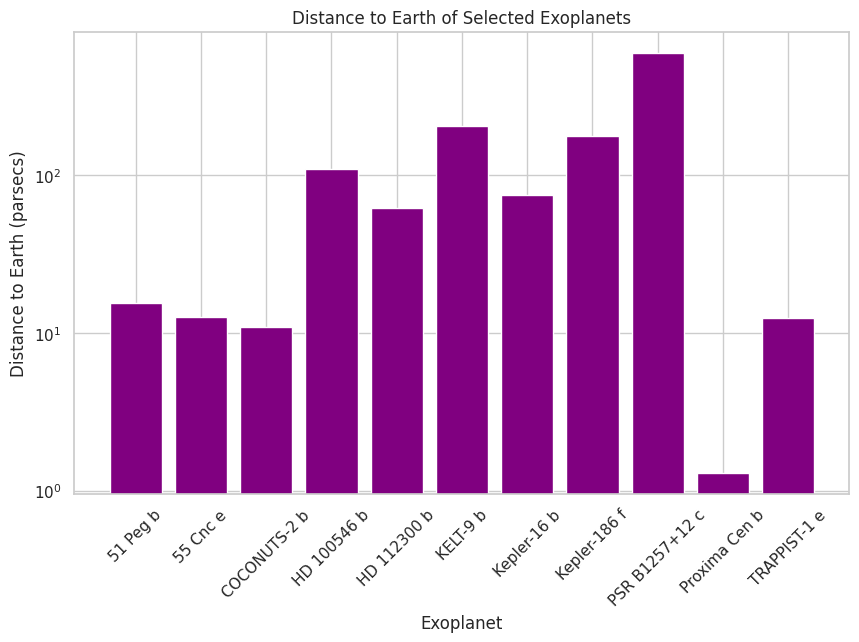

In [511]:
selected_planets = ['Kepler-16 b', 'TRAPPIST-1 e', '55 Cnc e', '51 Peg b', 'Kepler-186 f',
                    'HD 112300 b', 'Proxima Cen b', 'COCONUTS-2 b', 'KELT-9 b', 'HD 100546 b', 'PSR B1257+12 c']
selected_exo = exo_final[exo_final['pl_name'].isin(selected_planets)]
plt.figure(figsize=(10, 6))
plt.bar(selected_exo['pl_name'], selected_exo['sy_dist'], color='purple')
plt.title('Distance to Earth of Selected Exoplanets')
plt.xlabel('Exoplanet')
plt.ylabel('Distance to Earth (parsecs)')
plt.xticks(rotation=45)
plt.yscale('log')
plt.show()


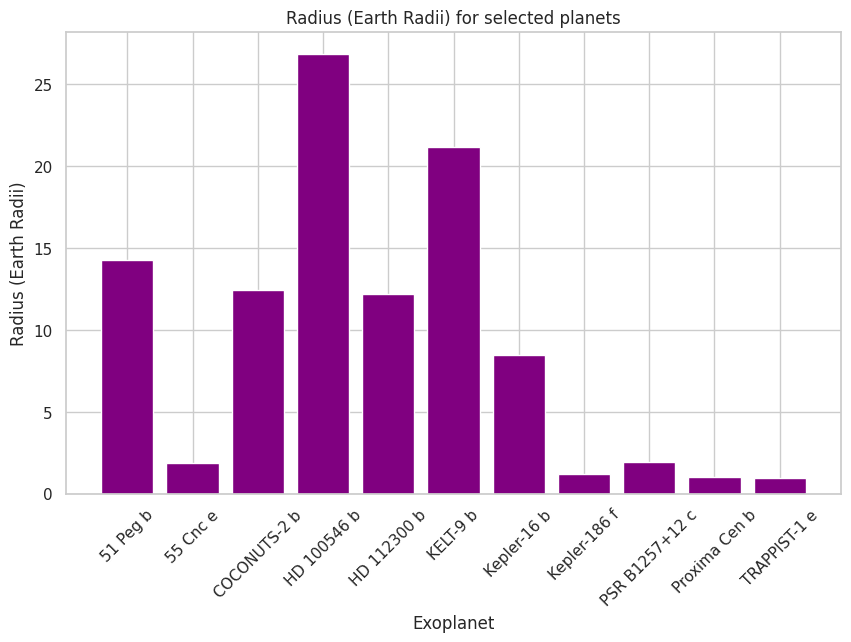

In [512]:
plt.figure(figsize=(10, 6))
plt.bar(selected_exo['pl_name'], selected_exo['pl_rade'], color='purple')
plt.title('Radius (Earth Radii) for selected planets')
plt.xlabel('Exoplanet')
plt.ylabel('Radius (Earth Radii)')
plt.xticks(rotation=45)
plt.show()


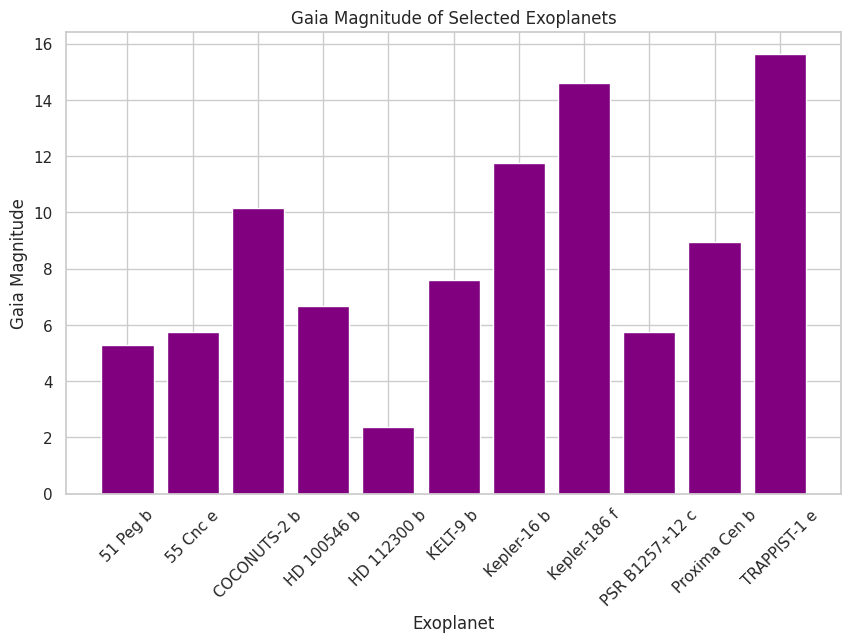

In [513]:
plt.figure(figsize=(10, 6))
plt.bar(selected_exo['pl_name'], selected_exo['sy_gaiamag'], color='purple')
plt.title('Gaia Magnitude of Selected Exoplanets')
plt.xlabel('Exoplanet')
plt.ylabel('Gaia Magnitude')
plt.xticks(rotation=45)
plt.show()


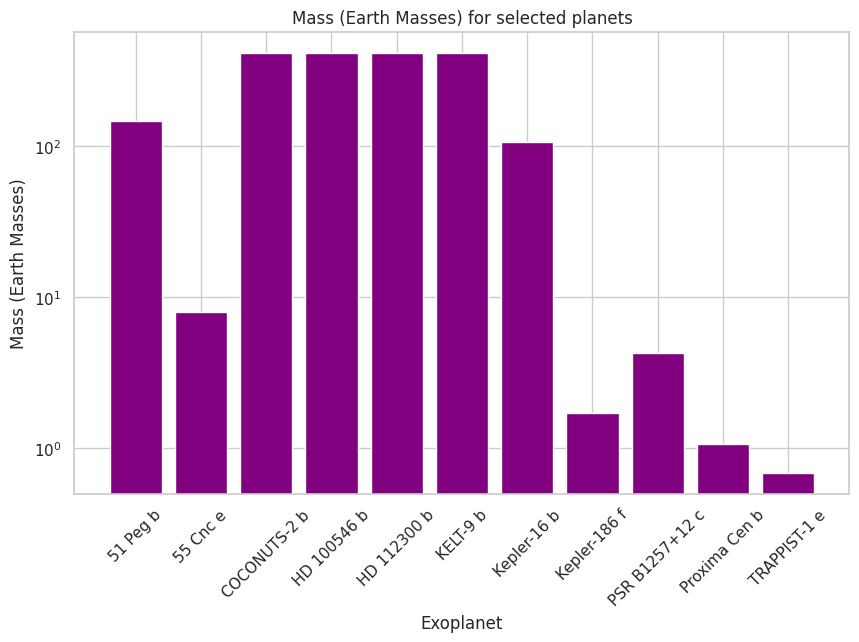

In [514]:
plt.figure(figsize=(10, 6))
plt.bar(selected_exo['pl_name'], selected_exo['pl_bmasse'], color='purple')
plt.title('Mass (Earth Masses) for selected planets')
plt.xlabel('Exoplanet')
plt.ylabel('Mass (Earth Masses)')
plt.xticks(rotation=45)
plt.yscale('log')
plt.show()


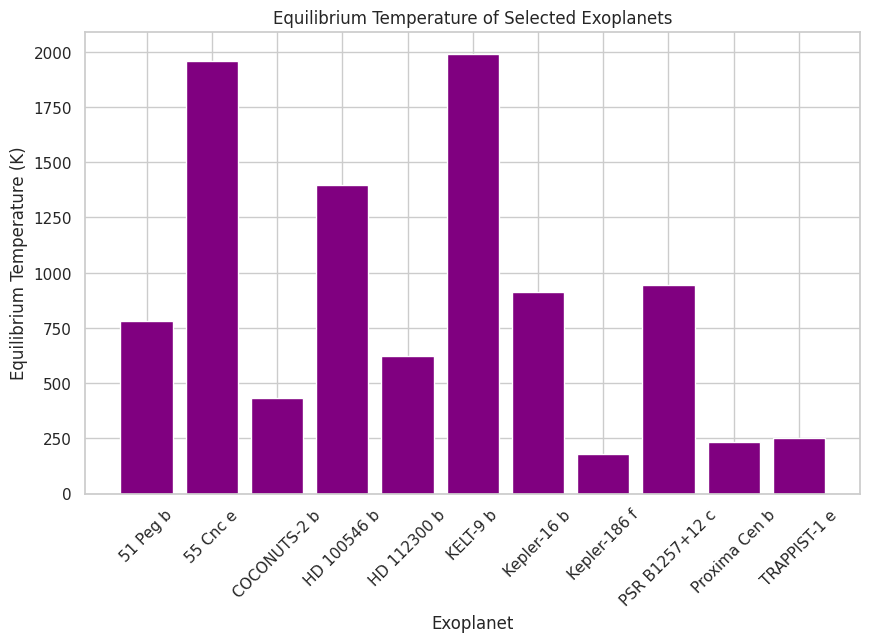

In [515]:
plt.figure(figsize=(10, 6))
plt.bar(selected_exo['pl_name'], selected_exo['pl_eqt'], color='purple')
plt.title('Equilibrium Temperature of Selected Exoplanets')
plt.xlabel('Exoplanet')
plt.ylabel('Equilibrium Temperature (K)')
plt.xticks(rotation=45)
plt.show()
